# Comprehensive Neural Architectures for Mass Spectrometry Prediction

This notebook implements and evaluates a family of neural architectures for electron ionization mass spectrum prediction. Given a molecular representation $\mathbf{x}\in\mathbb{R}^{d}$ (e.g., hashed/path/junction (HPJ) features), the task is to predict a non-negative intensity vector $\mathbf{y}\in\mathbb{R}_{\ge 0}^{B}$ over B discrete m/z bins.

## Problem setup and notation
- **Inputs**: features $\mathbf{x}\in\mathbb{R}^d$
- **Targets**: raw intensities $\tilde{\mathbf{y}}\in\mathbb{R}_{\ge 0}^B$
- **Training target transform** (variance stabilizing):  
  $$\mathbf{y} = \sqrt{\tilde{\mathbf{y}}}\quad\text{and}\quad\tilde{\mathbf{y}} = \mathbf{y}^{\odot 2}$$
- **Sparsity**: a large fraction of bins are zero, i.e. $\mathbb{P}[y_b=0]\approx 0.744$.

## Architecture families
1. **Traditional deep learning (10 models)**  
   SimpleMLP, ResidualNet, AttentionNet, DenseNet, DeepSetNet, HybridNet, MultiHeadAttentionNet, GatedNet, EnsembleNet, ModularNet
2. **Specialized for mass spectrometry (3 models)**  
   SparseGatedNet, RegionalExpertNet, HierarchicalPredictionNet
3. **Ensembles (3 methods)**  
   Stacked/Meta, Uncertainty-weighted, Regional

## Evaluation visuals (per model)
1. **Standard 2×2 diagnostic**: cosine distribution, m/z-range performance, intensity correlation with violin density, peak counts  
2. **Random spectrum grid**: qualitative agreement by examples  
3. **Training curves**: losses, cosine, F1, learning rate

## Targets & challenges
- **Challenges**: extreme sparsity, regional variability, multi-scale structure  
- **Benchmark**: XGBoost/RF > basic NN by ~2–5% (historically)  
- **Goal**: improve cosine similarity beyond 0.8063 and move toward RASSP performance (~0.929)

---

### Conceptual pipeline

```mermaid
flowchart LR
  A["Input features x ∈ R^d"] --> B{"Neural model f_θ"}
  B --> C["Predicted spectrum ŷ ∈ R_+^B"]
  C --> D["Losses: MSE, (1−cos), L1, BCE_presence"]
  C --> E["Metrics: cosine, F1 peaks, MSE, MAE, R^2"]
  E --> F["Diagnostics & model selection"]
```

Vector geometry view of cosine similarity

Let $\hat{\mathbf{y}}$ be the prediction and $\mathbf{y}$ the reference (both on the $\sqrt{\cdot}$ scale). The cosine similarity:
$$\mathrm{cos}(\mathbf{y},\hat{\mathbf{y}}) = \frac{\langle \mathbf{y},\hat{\mathbf{y}}\rangle}{\|\mathbf{y}\|_2\,\|\hat{\mathbf{y}}\|_2} \in [0,1]$$
makes the evaluation scale-invariant while respecting angular agreement of spectral shapes.

## 1. Environment Setup

This section:
- Imports scientific Python, PyTorch, and plotting utilities.
- Selects device automatically (MPS → CUDA → CPU).
- Sets deterministic seeds for reproducibility.
- Configures a colorblind-friendly palette and plot defaults.

Reproducibility note: training on GPU/MPS is subject to minor nondeterminism (e.g., parallel reductions). The fixed seeds and disabled warnings reduce—but cannot entirely eliminate—run-to-run noise. For final reporting, average across several seeds if time permits.

In [1]:
# Standard library imports
import os
import json
import pickle
import math
import warnings
import logging
import io
import random
from typing import Dict, Any, Tuple, List, Optional, Union
from collections import defaultdict
from dataclasses import dataclass
from abc import ABC, abstractmethod

# Data science imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import seaborn as sns
from tqdm import tqdm
from scipy.spatial.distance import cosine
from scipy.special import expit as sigmoid
from scipy.optimize import minimize
from scipy.ndimage import uniform_filter1d

# Machine learning imports
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.ensemble import RandomForestRegressor

# Deep learning imports
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from torch.optim.lr_scheduler import ReduceLROnPlateau, CosineAnnealingWarmRestarts
from torch.nn.utils import weight_norm

# Chemistry imports (optional)
try:
    from rdkit import Chem
    from rdkit.Chem import Descriptors
    from rdkit.Chem.Draw import rdMolDraw2D
    RDKIT_AVAILABLE = True
    print("RDKit available for molecular structure visualization")
except ImportError:
    RDKIT_AVAILABLE = False
    print("Warning: RDKit not available. Molecular structure features will be limited.")

# Configure environment
warnings.filterwarnings('ignore')
logging.basicConfig(level=logging.INFO)
logger = logging.getLogger(__name__)

# Device configuration
if torch.backends.mps.is_available():
    DEVICE = torch.device("mps")
elif torch.cuda.is_available():
    DEVICE = torch.device("cuda")
else:
    DEVICE = torch.device("cpu")
print(f"Using device: {DEVICE}")

# Set seeds for reproducibility
SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

# Colorblind-friendly Okabe–Ito palette for standard plots
PALETTE = {
    "blue": "#0072B2",
    "sky": "#56B4E9",
    "orange": "#E69F00",
    "vermillion": "#D55E00",
    "yellow": "#F0E442",
    "green": "#009E73",
    "purple": "#CC79A7",
    "black": "#000000",
    "grey": "#999999",
}

# Configure plotting defaults
plt.rcParams.update({
    'figure.figsize': (12, 10),
    'figure.dpi': 100,
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'axes.grid': True,
    'grid.alpha': 0.3
})

print("Environment setup complete")

RDKit available for molecular structure visualization
Using device: cuda
Environment setup complete


## 2. Configuration Management

Centralized configuration via dataclasses to ensure traceability:

- `PathConfig`: data/model output locations and input featurization type (HPJ).
- `DataConfig`:
  - `transform_sqrt=True` applies $y=\sqrt{\tilde y}$ (variance stabilization).
  - `feature_scaling=True` uses `StandardScaler` on $\mathbf{x}$.
  - `spectrum_dim=B` (m/z bins), `feature_dim=d` (feature count).
- `TrainingConfig`:
  - minibatch size, epochs, AdamW LR/WD,
  - early stopping & LR scheduler patience/factor,
  - gradient clipping radius.
- `LossConfig`:
  - weights $\lambda_{\mathrm{mse}}, \lambda_{\mathrm{cos}}, \lambda_{\mathrm{sp}}, \lambda_{\mathrm{pres}}$,
  - focal exponent $\gamma$ for focal-MSE (optional).
- `EvaluationConfig`:
  - `mz_step` for regional windows, `peak_threshold` for presence masks.

Master `Config` also holds per-architecture hyperparameters (depth, heads, growth-rates, etc.). All artifacts (best checkpoints, comparisons) are written to `models_dir`. 

In [2]:
@dataclass
class PathConfig:
    """Path configuration"""
    results_dir: str = '../data/results'
    models_dir: str = '../models/unified_nn'
    input_type: str = 'hpj'
    use_selected_data: bool = False
    
    @property
    def data_subdir(self) -> str:
        return 'selected' if self.use_selected_data else 'full_featurised'

@dataclass
class DataConfig:
    """Data processing configuration"""
    random_state: int = 42
    transform_sqrt: bool = True
    feature_scaling: bool = True
    target_sparsity: float = 0.744
    spectrum_dim: int = 500
    feature_dim: int = 7137

@dataclass
class TrainingConfig:
    """Training hyperparameters"""
    batch_size: int = 64
    epochs: int = 100
    learning_rate: float = 1e-3
    weight_decay: float = 1e-5
    early_stopping_patience: int = 10
    lr_scheduler_patience: int = 5
    lr_scheduler_factor: float = 0.5
    gradient_clip: float = 1.0
    eval_frequency: int = 5

@dataclass
class LossConfig:
    """Loss function weights"""
    mse_weight: float = 1.0
    cosine_weight: float = 1.0
    sparsity_weight: float = 1e-4
    presence_weight: float = 0.5
    focal_gamma: float = 2.0

@dataclass
class EvaluationConfig:
    """Evaluation settings"""
    mz_step: int = 50
    max_mz: int = 1000
    peak_threshold: float = 0.01
    eval_frequency: int = 5

class Config:
    """Master configuration"""
    def __init__(self):
        self.paths = PathConfig()
        self.data = DataConfig()
        self.training = TrainingConfig()
        self.loss = LossConfig()
        self.evaluation = EvaluationConfig()
        
        # Architecture-specific configs (will be set per model)
        self.architectures = self._get_architecture_configs()
        
        # Create directories
        os.makedirs(self.paths.models_dir, exist_ok=True)
    
    def _get_architecture_configs(self) -> Dict:
        """Get all architecture configurations"""
        return {
            # Traditional architectures
            'SimpleMLP': {
                'hidden_dims': [2048, 1024, 512],
                'dropout': 0.2,
                'batch_norm': True
            },
            'ResidualNet': {
                'hidden_dim': 1024,
                'num_blocks': 4,
                'dropout': 0.1
            },
            'AttentionNet': {
                'hidden_dim': 512,
                'num_heads': 8,
                'dropout': 0.1
            },
            'DenseNet': {
                'growth_rate': 32,
                'num_blocks': 4,
                'compression': 0.5
            },
            'DeepSetNet': {
                'encoder_dims': [512, 256],
                'decoder_dims': [512, 1024],
                'aggregation': 'mean'
            },
            'HybridNet': {
                'hidden_dim': 512,
                'num_heads': 4,
                'num_residual_blocks': 2
            },
            'MultiHeadAttentionNet': {
                'hidden_dim': 512,
                'num_heads': 16,
                'num_layers': 3
            },
            'GatedNet': {
                'hidden_dims': [1024, 512],
                'gate_hidden': 256
            },
            'EnsembleNet': {
                'num_models': 3,
                'hidden_dims': [512, 256],
                'diversity_weight': 0.1
            },
            'ModularNet': {
                'num_modules': 4,
                'module_dims': [256, 128],
                'fusion_method': 'attention'
            },
            # Specialized architectures
            'SparseGatedNet': {
                'hidden_dims': [1024, 512, 256],
                'gate_hidden': 128,
                'sparsity_threshold': 0.01,
                'gate_temperature': 1.0
            },
            'RegionalExpertNet': {
                'expert_regions': [(0, 100), (100, 200), (200, 300), (300, 400), (400, 500)],
                'expert_hidden': [512, 256],
                'router_hidden': 256,
                'overlap_bins': 10
            },
            'HierarchicalPredictionNet': {
                'presence_hidden': [512, 256],
                'intensity_hidden': [512, 256, 128],
                'presence_threshold': 0.01,
                'conditional_dropout': 0.2
            }
        }

# Initialize configuration
CONFIG = Config()
print(f"Configuration loaded. Models will be saved to: {CONFIG.paths.models_dir}")
print(f"Number of architectures configured: {len(CONFIG.architectures)}")

Configuration loaded. Models will be saved to: ../models/unified_nn
Number of architectures configured: 13


## 3. Data Management Module

Input format (JSONL per split):  
`{ "smiles": str, "features": List[float], "target": List[float] }`

Preprocessing
1. Sqrt transform $y=\sqrt{\tilde y}$ reduces dynamic range and stabilizes gradients:  
  $$\frac{\partial}{\partial \hat y}(\hat y - y)^2 = 2(\hat y - y),\quad y=\sqrt{\tilde y}\ \Rightarrow\ \text{effective residuals scale as }\sqrt{\tilde y}.$$
2. Feature scaling: standardize $\mathbf{x}$ (mean 0, unit variance).
3. Sparsity: report $\mathrm{Sparsity}=\tfrac{1}{NB}\sum_{n,b}\mathbb{1}[y_{nb}=0]$.

Dataloaders
- `TensorDataset` on `(X, y)` with shuffling for train split only.
- Shapes: $X\in\mathbb{R}^{N\times d}$, $y\in\mathbb{R}^{N\times B}$.

If a file is missing, a synthetic fallback is generated (with random peaks) so the notebook remains runnable and the full pipeline is testable.

In [3]:
class DataManager:
    """Handles all data loading and preprocessing operations"""
    
    def __init__(self, config: Config):
        self.config = config
        self.scaler = None
        self.datasets = {}
        self.data_loaders = {}
        
    def get_data_paths(self) -> Dict[str, str]:
        """Get paths to data files"""
        input_type_dir = os.path.join(
            self.config.paths.results_dir, 
            self.config.paths.input_type
        )
        data_dir = os.path.join(input_type_dir, self.config.paths.data_subdir)
        
        return {
            'train': os.path.join(data_dir, 'train_data.jsonl'),
            'val': os.path.join(data_dir, 'val_data.jsonl'),
            'test': os.path.join(data_dir, 'test_data.jsonl')
        }
    
    def load_jsonl_data(self, filepath: str) -> Tuple[List, np.ndarray, np.ndarray]:
        """Load data from JSONL file"""
        smiles_list, features, targets = [], [], []
        
        if not os.path.exists(filepath):
            print(f"File not found: {filepath}")
            # Create synthetic data for demonstration
            n_samples = 100 if 'train' in filepath else 20
            n_features = 100
            n_bins = 500
            
            features = np.random.randn(n_samples, n_features)
            targets = np.zeros((n_samples, n_bins))
            
            for i in range(n_samples):
                n_peaks = np.random.randint(5, 20)
                peak_positions = np.random.choice(n_bins, n_peaks, replace=False)
                targets[i, peak_positions] = np.random.exponential(0.5, n_peaks)
            
            smiles_list = ['N/A'] * n_samples
            return smiles_list, features, targets
        
        with open(filepath, 'r') as f:
            for line in f:
                try:
                    record = json.loads(line)
                    smiles = record.get("smiles")
                    feat = record.get("features")
                    targ = record.get("target")
                    
                    if smiles and feat is not None and targ is not None:
                        smiles_list.append(smiles)
                        features.append(feat)
                        targets.append(targ)
                except:
                    continue
        
        return smiles_list, np.array(features), np.array(targets)
    
    def load_all_data(self) -> Tuple[Dict, Any]:
        """Load and preprocess all datasets"""
        print("Loading datasets...")
        
        paths = self.get_data_paths()
        
        for name, path in paths.items():
            smiles, X, y = self.load_jsonl_data(path)
            
            # Apply transformation
            if self.config.data.transform_sqrt and len(y) > 0:
                y = np.sqrt(y)
            
            self.datasets[name] = (smiles, X, y)
            print(f"{name.capitalize()}: {len(X)} samples")
        
        # Apply feature scaling
        if self.config.data.feature_scaling and len(self.datasets['train'][1]) > 0:
            self.scaler = StandardScaler()
            _, X_train, _ = self.datasets['train']
            self.scaler.fit(X_train)
            
            for name in self.datasets:
                smiles, X, y = self.datasets[name]
                if len(X) > 0:
                    X_scaled = self.scaler.transform(X)
                    self.datasets[name] = (smiles, X_scaled, y)
        
        # Update config with actual dimensions
        if len(self.datasets['train'][1]) > 0:
            self.config.data.feature_dim = self.datasets['train'][1].shape[1]
            self.config.data.spectrum_dim = self.datasets['train'][2].shape[1]
        
        return self.datasets, self.scaler
    
    def create_data_loaders(self) -> Dict[str, DataLoader]:
        """Create PyTorch data loaders"""
        for name, (_, X, y) in self.datasets.items():
            if len(X) > 0:
                dataset = TensorDataset(
                    torch.from_numpy(X).float(),
                    torch.from_numpy(y).float()
                )
                
                self.data_loaders[name] = DataLoader(
                    dataset,
                    batch_size=self.config.training.batch_size,
                    shuffle=(name == 'train'),
                    num_workers=0  # MPS compatibility
                )
        
        return self.data_loaders
    
    def get_data_stats(self) -> pd.DataFrame:
        """Get statistics about loaded data"""
        stats = []
        for name, (_, X, y) in self.datasets.items():
            if len(X) > 0:
                stats.append({
                    'Dataset': name.capitalize(),
                    'Samples': len(X),
                    'Features': X.shape[1],
                    'Outputs': y.shape[1],
                    'Min Intensity': np.min(y),
                    'Max Intensity': np.max(y),
                    'Sparsity': np.mean(y == 0)
                })
        return pd.DataFrame(stats)

# Initialize data manager
data_manager = DataManager(CONFIG)
datasets, scaler = data_manager.load_all_data()
data_loaders = data_manager.create_data_loaders()

# Display data statistics
print("\nData Statistics:")
print(data_manager.get_data_stats().to_string(index=False))

# Store commonly used variables
test_smiles, X_test, y_test = datasets['test']
_, X_train, y_train = datasets['train']
_, X_val, y_val = datasets['val']

input_dim = CONFIG.data.feature_dim
output_dim = CONFIG.data.spectrum_dim

print(f"\nModel dimensions: input={input_dim}, output={output_dim}")

Loading datasets...
Train: 2176 samples
Val: 272 samples
Test: 272 samples

Data Statistics:
Dataset  Samples  Features  Outputs  Min Intensity  Max Intensity  Sparsity
  Train     2176      7137      500            0.0            1.0  0.745159
    Val      272      7137      500            0.0            1.0  0.740066
   Test      272      7137      500            0.0            1.0  0.736265

Model dimensions: input=7137, output=500


## 4. Evaluation Metrics Module

### Cosine similarity (primary)
For a batch $\{(\mathbf{y}^{(i)},\hat{\mathbf{y}}^{(i)})\}$:
$$\mathrm{cos}_i=\frac{\langle \mathbf{y}^{(i)},\hat{\mathbf{y}}^{(i)}\rangle}{\|\mathbf{y}^{(i)}\|_2\ \|\hat{\mathbf{y}}^{(i)}\|_2},\quad\overline{\mathrm{cos}}=\frac{1}{N}\sum_{i=1}^N \mathrm{cos}_i.$$
Robust to global scaling; sensitive to shape.

### Weighted Dot Product (WDP)
Emphasizes high-intensity regions:
$$\mathrm{WDP}=\frac{\sum_b w_b\,y_b\,\hat y_b}{\sum_b w_b\,y_b^2},\quad w_b=y_b+\varepsilon.$$

### Peak detection (threshold $\tau$)
Normalize each spectrum to $[0,1]$ by max; define peak masks $\mathbf{p}=\mathbb{1}[y>\tau]$, $\hat{\mathbf{p}}=\mathbb{1}[\hat y>\tau]$.
$$\mathrm{Precision}=\tfrac{TP}{TP+FP},\quad \mathrm{Recall}=\tfrac{TP}{TP+FN},\quad \mathrm{F1}=\tfrac{2\cdot\mathrm{Prec}\cdot\mathrm{Rec}}{\mathrm{Prec}+\mathrm{Rec}}.$$

### Global regression metrics
$$\mathrm{MSE}=\tfrac{1}{NB}\sum_{n,b}(\hat y_{nb}-y_{nb})^2,\quad\mathrm{MAE}=\tfrac{1}{NB}\sum_{n,b}\lvert \hat y_{nb}-y_{nb}\rvert,\quad R^2=1-\tfrac{\sum(\hat y-y)^2}{\sum(y-\bar y)^2}.$$

### Regional analysis over m/z
Partition $[0,B)$ into windows of size `mz_step`. For each window $[s,e)$, compute mean cosine, peak counts, and coverage (non-zero spectra %). This reveals low- vs high-m/z behavior and fragmentation biases.

All predictions are clipped to $\hat y\ge 0$ before evaluation.

In [4]:
class MetricsCalculator:
    """Handles all metric calculations"""
    
    @staticmethod
    def cosine_similarity_batch(y_true: np.ndarray, y_pred: np.ndarray) -> Tuple[float, np.ndarray]:
        """Calculate cosine similarity for a batch"""
        similarities = []
        for i in range(len(y_true)):
            true_spec = y_true[i]
            pred_spec = y_pred[i]
            
            if np.sum(true_spec) == 0 or np.sum(pred_spec) == 0:
                cos_sim = 0 if np.sum(true_spec) != np.sum(pred_spec) else 1
            else:
                cos_sim = 1 - cosine(true_spec, pred_spec)
            
            similarities.append(cos_sim if not np.isnan(cos_sim) else 0)
        
        return np.mean(similarities), np.array(similarities)
    
    @staticmethod
    def weighted_dot_product(y_true: np.ndarray, y_pred: np.ndarray, eps: float = 1e-8) -> float:
        """Calculate weighted dot product (WDP) score."""
        weights = y_true + eps
        numerator = np.sum(weights * y_true * y_pred)
        denominator = np.sum(weights * y_true * y_true) + eps
        return numerator / denominator
    
    @staticmethod
    def peak_detection_metrics(y_true: np.ndarray, y_pred: np.ndarray, threshold: float = 0.01) -> Dict:
        """Calculate peak detection metrics"""
        # Normalize to relative intensities
        y_true_norm = y_true / (np.max(y_true, axis=1, keepdims=True) + 1e-8)
        y_pred_norm = y_pred / (np.max(y_pred, axis=1, keepdims=True) + 1e-8)
        
        # Binary masks for peaks
        true_peaks = y_true_norm > threshold
        pred_peaks = y_pred_norm > threshold
        
        # Calculate metrics
        tp = np.sum(true_peaks & pred_peaks)
        fp = np.sum(~true_peaks & pred_peaks)
        fn = np.sum(true_peaks & ~pred_peaks)
        
        precision = tp / (tp + fp + 1e-8)
        recall = tp / (tp + fn + 1e-8)
        f1 = 2 * precision * recall / (precision + recall + 1e-8)
        
        return {
            'precision': precision,
            'recall': recall,
            'f1_score': f1,
            'true_peaks': np.sum(true_peaks),
            'pred_peaks': np.sum(pred_peaks),
            'tp': tp,
            'fp': fp,
            'fn': fn
        }
    
    @staticmethod
    def cosine_similarity_by_mz_range(y_true: np.ndarray, y_pred: np.ndarray, config: Config) -> Dict:
        """Calculate cosine similarity by m/z range."""
        spectrum_length = y_true.shape[1]
        step_size = config.evaluation.mz_step
        max_mz = min(config.evaluation.max_mz, spectrum_length)
        
        mz_ranges = {}
        for start in range(0, max_mz, step_size):
            end = min(start + step_size, max_mz)
            range_key = f"{start}-{end}"
            
            y_true_range = y_true[:, start:end]
            y_pred_range = y_pred[:, start:end]
            
            # Calculate cosine similarities
            similarities = []
            for i in range(len(y_true)):
                true_spec = y_true_range[i]
                pred_spec = y_pred_range[i]
                
                if np.sum(true_spec) == 0 or np.sum(pred_spec) == 0:
                    sim = 0 if np.sum(true_spec) != np.sum(pred_spec) else 1
                else:
                    sim = 1 - cosine(true_spec, pred_spec)
                similarities.append(sim)
            
            mean_sim = np.mean(similarities)
            
            # Statistical uncertainty (across samples)
            stat_uncertainty = np.std(similarities) / np.sqrt(len(similarities)) if len(similarities) > 1 else 0
            
            # For neural networks, we don't have model uncertainty
            model_uncertainty = 0
            
            # Peak counting
            true_peaks = np.sum(y_true_range > config.evaluation.peak_threshold)
            pred_peaks = np.sum(y_pred_range > config.evaluation.peak_threshold)
            
            # Coverage
            non_zero_samples = np.sum(np.sum(y_true_range, axis=1) > 0)
            coverage = non_zero_samples / len(y_true) * 100
            
            mz_ranges[range_key] = {
                'mean_similarity': mean_sim,
                'stat_uncertainty': stat_uncertainty,
                'model_uncertainty': model_uncertainty,
                'coverage': coverage,
                'avg_true_peaks_per_spectrum': true_peaks / len(y_true),
                'avg_pred_peaks_per_spectrum': pred_peaks / len(y_true)
            }
        
        return mz_ranges
    
    @staticmethod
    def comprehensive_evaluation(y_true: np.ndarray, y_pred: np.ndarray, 
                                config: Config, model_name: str = "Model") -> Dict:
        """Comprehensive evaluation of predictions"""
        # Ensure non-negative
        y_pred = np.maximum(y_pred, 0)
        
        # Calculate all metrics
        cosine_mean, cosine_all = MetricsCalculator.cosine_similarity_batch(y_true, y_pred)
        peak_metrics = MetricsCalculator.peak_detection_metrics(
            y_true, y_pred, config.evaluation.peak_threshold
        )
        mse = mean_squared_error(y_true, y_pred)
        r2 = r2_score(y_true, y_pred)
        mae = mean_absolute_error(y_true, y_pred)
        
        # Sparsity analysis
        true_sparsity = np.mean(y_true == 0)
        pred_sparsity = np.mean(y_pred < config.evaluation.peak_threshold)
        
        # Regional analysis
        mz_range_sims = MetricsCalculator.cosine_similarity_by_mz_range(y_true, y_pred, config)
        
        results = {
            'cosine': cosine_mean,
            'cosine_similarity': cosine_mean,
            'individual_cos_sims': cosine_all,
            'peak_metrics': peak_metrics,
            'mse': mse,
            'r2': r2,
            'mae': mae,
            'true_sparsity': true_sparsity,
            'pred_sparsity': pred_sparsity,
            'mz_range_sims': mz_range_sims,
            'y_true': y_true,
            'y_pred': y_pred
        }
        
        # Print summary
        print(f"\n{model_name} Performance:")
        print(f"  Cosine Similarity: {cosine_mean:.4f}")
        print(f"  MSE: {mse:.4f}, R²: {r2:.4f}")
        print(f"  Peak Detection - Precision: {peak_metrics['precision']:.4f}, "
              f"Recall: {peak_metrics['recall']:.4f}, F1: {peak_metrics['f1_score']:.4f}")
        print(f"  Sparsity - True: {true_sparsity:.3f}, Pred: {pred_sparsity:.3f}")
        
        return results

# Initialize metrics calculator
metrics_calc = MetricsCalculator()
print("Metrics calculator initialized")

Metrics calculator initialized


## 5. Loss Functions Module

Let $\hat{\mathbf{y}}=f_\theta(\mathbf{x})\ge 0$ be the prediction on the $\sqrt{\cdot}$ scale. The combined loss aggregates complementary criteria:

### Mean Squared Error (MSE)
$$\mathcal{L}_{\mathrm{mse}}(\hat{\mathbf{y}},\mathbf{y})=\tfrac{1}{B}\sum_{b=1}^B(\hat y_b-y_b)^2.$$

### Cosine distance
$$\mathcal{L}_{\mathrm{cos}}(\hat{\mathbf{y}},\mathbf{y})=1-\tfrac{\langle \mathbf{y},\hat{\mathbf{y}}\rangle}{\|\mathbf{y}\|_2\,\|\hat{\mathbf{y}}\|_2+\varepsilon}.$$

### Sparsity (L1) regularization on outputs
Encourages conservative emission in empty regions:
$$\mathcal{L}_{\mathrm{sp}}(\hat{\mathbf{y}})=\tfrac{1}{B}\sum_{b=1}^B\lvert \hat y_b\rvert.$$

### (Optional) Presence (hierarchical models)
Binary cross-entropy on peak logits $\mathbf{z}$ with targets $\mathbf{p}=\mathbb{1}[y>\tau]$:
$$\mathcal{L}_{\mathrm{pres}}(\mathbf{z},\mathbf{p})= -\tfrac{1}{B}\sum_{b=1}^B p_b\log\sigma(z_b)+(1-p_b)\log(1-\sigma(z_b)).$$

### (Optional) Focal-MSE (for hard examples)
Define $\mathrm{mse}_b=(\hat y_b-y_b)^2,\; p_t=\exp(-\mathrm{mse}_b)$.
$$\mathcal{L}_{\mathrm{focal\text{-}mse}}=\tfrac{1}{B}\sum_b\alpha\,(1-p_t)^{\gamma}\,\mathrm{mse}_b.$$
Down-weights easy bins and highlights hard residuals; $\gamma\in[1,4]$ typical.

### Sparsity-aware split loss
Let $\mathcal{Z}=\{b:y_b=0\}$ and $\mathcal{N}=\{b:y_b>0\}$:
$$\mathcal{L}_{\mathrm{sa}}=\tfrac{|\mathcal{Z}|}{B}\,\lambda_0\,\mathrm{MSE}(\hat y_\mathcal{Z},0)+\tfrac{|\mathcal{N}|}{B}\,\lambda_1\,\mathrm{MSE}(\hat y_\mathcal{N},y_\mathcal{N}).$$
Balances the sea of zeros vs true peaks.

### Total loss (used in training)
$$\boxed{\mathcal{L}= \lambda_{\mathrm{mse}}\mathcal{L}_{\mathrm{mse}}+ \lambda_{\mathrm{cos}}\mathcal{L}_{\mathrm{cos}}+ \lambda_{\mathrm{sp}}\mathcal{L}_{\mathrm{sp}}+ \lambda_{\mathrm{pres}}\mathcal{L}_{\mathrm{pres}}}$$
Weights are set in `LossConfig`. Hooks exist to swap in `focal_mse` or `sparsity_aware` variants.

In [5]:
class LossFunctions:
    """Collection of loss functions for mass spectrometry"""
    
    @staticmethod
    def cosine_loss(pred: torch.Tensor, true: torch.Tensor, eps: float = 1e-8) -> torch.Tensor:
        """Cosine distance loss"""
        pred_norm = pred / (torch.norm(pred, dim=1, keepdim=True) + eps)
        true_norm = true / (torch.norm(true, dim=1, keepdim=True) + eps)
        return 1.0 - (pred_norm * true_norm).sum(dim=1).mean()
    
    @staticmethod
    def sparsity_loss(pred: torch.Tensor) -> torch.Tensor:
        """L1 regularization to encourage sparsity"""
        return pred.abs().mean()
    
    @staticmethod
    def focal_mse_loss(pred: torch.Tensor, target: torch.Tensor, 
                      gamma: float = 2.0, alpha: float = 1.0) -> torch.Tensor:
        """Focal loss variant for MSE"""
        mse = (pred - target) ** 2
        pt = torch.exp(-mse)
        focal_weight = alpha * (1 - pt) ** gamma
        return (focal_weight * mse).mean()
    
    @staticmethod
    def sparsity_aware_loss(pred: torch.Tensor, target: torch.Tensor,
                           zero_weight: float = 0.1, 
                           nonzero_weight: float = 1.0) -> torch.Tensor:
        """Loss that explicitly handles sparse targets"""
        zero_mask = target == 0
        nonzero_mask = ~zero_mask
        
        # Separate losses
        zero_loss = zero_weight * F.mse_loss(
            pred[zero_mask], target[zero_mask], reduction='mean'
        )
        nonzero_loss = nonzero_weight * F.mse_loss(
            pred[nonzero_mask], target[nonzero_mask], reduction='mean'
        )
        
        # Combine with proper weighting
        n_zero = zero_mask.sum()
        n_nonzero = nonzero_mask.sum()
        total = n_zero + n_nonzero
        
        if n_zero > 0 and n_nonzero > 0:
            return (n_zero / total) * zero_loss + (n_nonzero / total) * nonzero_loss
        elif n_zero > 0:
            return zero_loss
        else:
            return nonzero_loss
    
    @staticmethod
    def combined_loss(pred: torch.Tensor, true: torch.Tensor, config: Config,
                     presence_pred: torch.Tensor = None, 
                     presence_true: torch.Tensor = None) -> Tuple[torch.Tensor, Dict]:
        """Combined loss function with optional hierarchical components"""
        losses = {}
        
        # Main losses
        losses['mse'] = F.mse_loss(pred, true)
        losses['cosine'] = LossFunctions.cosine_loss(pred, true)
        losses['sparsity'] = LossFunctions.sparsity_loss(pred)
        
        # Hierarchical loss if provided
        if presence_pred is not None and presence_true is not None:
            losses['presence'] = F.binary_cross_entropy_with_logits(
                presence_pred, presence_true
            )
        
        # Combine losses
        total_loss = (
            config.loss.mse_weight * losses['mse'] +
            config.loss.cosine_weight * losses['cosine'] +
            config.loss.sparsity_weight * losses['sparsity']
        )
        
        if 'presence' in losses:
            total_loss += config.loss.presence_weight * losses['presence']
        
        # Convert to item() for logging
        loss_items = {k: v.item() for k, v in losses.items()}
        
        return total_loss, loss_items

# Initialize loss functions
loss_fns = LossFunctions()
print("Loss functions initialized")

Loss functions initialized


## 6. Training Framework

Loop essentials
- Optimizer: AdamW with weight decay.
- Gradient clipping: $\|\nabla\theta\|_2 \leq$ `gradient_clip`.
- Scheduler: `ReduceLROnPlateau` on validation cosine (mode `max`).
- Early stopping: patience on validation cosine plateaus.
- Checkpointing: save the best epoch by cosine.

Per-batch forward
- Generic models: $\hat{\mathbf{y}}=f_\theta(\mathbf{x})$.
- Hierarchical models: additionally predict presence logits for BCE term.
- Ensembles with diversity: add pairwise cosine penalty among sub-members.

History tracking
- `train_loss`, `val_loss`, `val_cosine`, `val_f1`, `lr` → for the 2×2 training dashboard.

```text
Epoch k:
  for (x,y) in train:
    ŷ = model(x)
    L = L_mse + L_cos + L_sp (+ L_presence)
    backprop, clip, step
  if k % eval_freq == 0:
    evaluate on val, update scheduler, early-stop if needed
```

In [6]:
class Trainer:
    """Unified training framework"""
    
    def __init__(self, config: Config, device: torch.device):
        self.config = config
        self.device = device
        self.metrics_calc = MetricsCalculator()
        self.loss_fns = LossFunctions()
    
    def train_epoch(self, model: nn.Module, train_loader: DataLoader, 
                   optimizer: torch.optim.Optimizer, epoch: int, 
                   total_epochs: int) -> float:
        """Train for one epoch"""
        model.train()
        train_losses = []
        
        progress_bar = tqdm(train_loader, desc=f"Epoch {epoch}/{total_epochs}")
        
        for X_batch, y_batch in progress_bar:
            X_batch = X_batch.to(self.device)
            y_batch = y_batch.to(self.device)
            
            optimizer.zero_grad()
            
            # Handle models with special forward passes
            if hasattr(model, '__class__') and model.__class__.__name__ == 'HierarchicalPredictionNet':
                predictions, presence_logits = model(X_batch, return_presence=True)
                presence_true = (y_batch > self.config.evaluation.peak_threshold).float()
                loss, loss_components = self.loss_fns.combined_loss(
                    predictions, y_batch, self.config, presence_logits, presence_true
                )
            elif hasattr(model, '__class__') and model.__class__.__name__ == 'EnsembleNet':
                predictions = model(X_batch)
                main_loss, loss_components = self.loss_fns.combined_loss(
                    predictions, y_batch, self.config
                )
                div_loss = model.diversity_loss(X_batch)
                loss = main_loss + model.diversity_weight * div_loss
                loss_components['diversity'] = div_loss.item()
            else:
                predictions = model(X_batch)
                loss, loss_components = self.loss_fns.combined_loss(
                    predictions, y_batch, self.config
                )
            
            loss.backward()
            
            # Gradient clipping
            torch.nn.utils.clip_grad_norm_(
                model.parameters(), self.config.training.gradient_clip
            )
            
            optimizer.step()
            train_losses.append(loss.item())
            
            # Update progress bar
            progress_bar.set_postfix({
                'loss': f"{loss.item():.4f}",
                'cos': f"{loss_components.get('cosine', 0):.4f}"
            })
        
        return np.mean(train_losses)
    
    def evaluate(self, model: nn.Module, val_loader: DataLoader) -> Dict:
        """Evaluate model on validation/test set"""
        model.eval()
        all_preds = []
        all_true = []
        val_losses = []
        
        with torch.no_grad():
            for X_batch, y_batch in val_loader:
                X_batch = X_batch.to(self.device)
                y_batch = y_batch.to(self.device)
                
                # Handle special models
                if hasattr(model, '__class__') and model.__class__.__name__ == 'HierarchicalPredictionNet':
                    predictions = model(X_batch, return_presence=False)
                else:
                    predictions = model(X_batch)
                
                loss, _ = self.loss_fns.combined_loss(predictions, y_batch, self.config)
                val_losses.append(loss.item())
                
                all_preds.append(predictions.cpu().numpy())
                all_true.append(y_batch.cpu().numpy())
        
        y_pred = np.vstack(all_preds)
        y_true = np.vstack(all_true)
        
        # Calculate metrics
        results = self.metrics_calc.comprehensive_evaluation(
            y_true, y_pred, self.config, model.__class__.__name__
        )
        results['val_loss'] = np.mean(val_losses)
        
        return results
    
    def train_model(self, model: nn.Module, train_loader: DataLoader, 
                   val_loader: DataLoader, model_name: str) -> Tuple[Dict, float]:
        """Full training loop for a model"""
        
        # Setup optimizer
        optimizer = torch.optim.AdamW(
            model.parameters(),
            lr=self.config.training.learning_rate,
            weight_decay=self.config.training.weight_decay
        )
        
        # Setup scheduler
        scheduler = ReduceLROnPlateau(
            optimizer,
            mode='max',
            factor=self.config.training.lr_scheduler_factor,
            patience=self.config.training.lr_scheduler_patience
        )
        
        # Training history
        history = {
            'train_loss': [],
            'val_loss': [],
            'val_cosine': [],
            'val_f1': [],
            'lr': []
        }
        
        best_val_cosine = -1
        patience_counter = 0
        
        print(f"\nTraining {model_name}...")
        print("=" * 60)
        
        for epoch in range(1, self.config.training.epochs + 1):
            # Training
            avg_train_loss = self.train_epoch(
                model, train_loader, optimizer, epoch, self.config.training.epochs
            )
            history['train_loss'].append(avg_train_loss)
            history['lr'].append(optimizer.param_groups[0]['lr'])
            
            # Validation
            if epoch % self.config.evaluation.eval_frequency == 0:
                val_results = self.evaluate(model, val_loader)
                
                history['val_loss'].append(val_results['val_loss'])
                history['val_cosine'].append(val_results['cosine_similarity'])
                history['val_f1'].append(val_results['peak_metrics']['f1_score'])
                
                # Learning rate scheduling
                scheduler.step(val_results['cosine_similarity'])
                
                # Early stopping check
                if val_results['cosine_similarity'] > best_val_cosine:
                    best_val_cosine = val_results['cosine_similarity']
                    patience_counter = 0
                    
                    # Save best model
                    torch.save({
                        'model_state_dict': model.state_dict(),
                        'optimizer_state_dict': optimizer.state_dict(),
                        'epoch': epoch,
                        'best_val_cosine': best_val_cosine,
                        'model_name': model_name
                    }, os.path.join(self.config.paths.models_dir, f'{model_name}_best.pth'))
                    
                    print(f"  New best model saved! (Cosine: {best_val_cosine:.4f})")
                else:
                    patience_counter += 1
                
                if patience_counter >= self.config.training.early_stopping_patience:
                    print(f"\nEarly stopping triggered at epoch {epoch}")
                    break
        
        print(f"\nTraining complete. Best validation cosine: {best_val_cosine:.4f}")
        
        # Load best model
        checkpoint = torch.load(
            os.path.join(self.config.paths.models_dir, f'{model_name}_best.pth'),
            weights_only=False
        )
        model.load_state_dict(checkpoint['model_state_dict'])
        
        return history, best_val_cosine

# Initialize trainer
trainer = Trainer(CONFIG, DEVICE)
print("Trainer initialized")

Trainer initialized


## 7. Standard Visualization Module

The plotting suite standardizes model comparison:

1. Cosine distribution: histogram across test spectra (mean marked).
2. m/z-range performance: windowed cosine with optional uncertainty bands.
3. Intensity correlation: scatter in a rotated (u,v) frame with violin-like density bands to visualize dispersion around $\hat y = y$ (on $\sqrt{\cdot}$ scale; perfect line clipped to 1.0).
4. Peak counts: bar comparison of average detected peaks per window.

Random spectrum grids pair experimental (upright stems) and predicted (inverted stems) panels. If RDKit is present, a molecule inset with exact mass is included.

Training dashboard (2×2):
- Loss curves, cosine trends (with linear trendline), F1 evolution (smoothed), and LR schedule with drop annotations.

In [7]:
class StandardVisualizer:
    """Standard visualization suite for mass spectrometry models"""
    
    @staticmethod
    def plot_standard_2x2_diagnostic(results: Dict, model_name: str = "Model", show_uncertainties: bool = True):
        """Create standard 2x2 evaluation visualization.
        
        1. Cosine Similarity Distribution (Top-Left)
        2. Performance by m/z Range (Top-Right)
        3. Intensity Correlation with Violin Density (Bottom-Left)
        4. Peak Count Comparison (Bottom-Right)
        """
        fig, axes = plt.subplots(2, 2, figsize=(14, 10))
        
        # ---------- Top-Left: Cosine Similarity Distribution ----------
        ax = axes[0, 0]
        ax.hist(results['individual_cos_sims'], bins=30, range=(0, 1),
                alpha=0.85, color=PALETTE["blue"], edgecolor=PALETTE["black"], linewidth=0.5)
        ax.set_xlabel('Cosine Similarity')
        ax.set_ylabel('Count')
        ax.set_title(f'Cosine Similarity Distribution - {model_name}')
        ax.axvline(results['cosine'], color=PALETTE["vermillion"], linestyle='--', linewidth=2,
                   label=f"Mean: {results['cosine']:.4f}")
        ax.legend(frameon=False)
        ax.grid(alpha=0.3)
        
        # ---------- Top-Right: Performance by m/z with Uncertainties ----------
        ax = axes[0, 1]
        ranges = list(results['mz_range_sims'].keys())
        x_pos = np.arange(len(ranges))
        mean_sims = np.array([results['mz_range_sims'][r]['mean_similarity'] for r in ranges])
        stat_uncertainties = np.array([results['mz_range_sims'][r]['stat_uncertainty'] for r in ranges])
        model_uncertainties = np.array([results['mz_range_sims'][r]['model_uncertainty'] for r in ranges])
        
        if show_uncertainties:
            legend_handles = []
            # Statistical uncertainty (95% CI)
            if np.any(stat_uncertainties > 0):
                stat_ci = 1.96 * stat_uncertainties
                stat_lower = np.clip(mean_sims - stat_ci, 0, 1)
                stat_upper = np.clip(mean_sims + stat_ci, 0, 1)
                ax.fill_between(x_pos, stat_lower, stat_upper,
                                facecolor='none', edgecolor=PALETTE["yellow"],
                                hatch='////', linewidth=1.2, zorder=3)
                ax.plot(x_pos, stat_lower, linestyle='--', color=PALETTE["yellow"], linewidth=1.2, zorder=4)
                ax.plot(x_pos, stat_upper, linestyle='--', color=PALETTE["yellow"], linewidth=1.2, zorder=4)
                legend_handles.append(Patch(facecolor='none', edgecolor=PALETTE["yellow"], hatch='////',
                                            label='Statistical Uncertainty (95% CI)'))
            
            # Model uncertainty (±2σ)
            if np.any(model_uncertainties > 0):
                model_sigma = 2.0 * model_uncertainties
                model_lower = np.clip(mean_sims - model_sigma, 0, 1)
                model_upper = np.clip(mean_sims + model_sigma, 0, 1)
                ax.fill_between(x_pos, model_lower, model_upper,
                                facecolor=PALETTE["purple"], alpha=0.18,
                                edgecolor=PALETTE["purple"], linewidth=0.8, zorder=1)
                ax.plot(x_pos, model_lower, linestyle=':', color=PALETTE["purple"], linewidth=1.3, zorder=2)
                ax.plot(x_pos, model_upper, linestyle=':', color=PALETTE["purple"], linewidth=1.3, zorder=2)
                legend_handles.append(Patch(facecolor=PALETTE["purple"], alpha=0.18, edgecolor=PALETTE["purple"],
                                            label='Model Uncertainty (±2σ)'))
        
        ax.plot(x_pos, mean_sims, color=PALETTE["blue"], linewidth=2.5,
                label='Mean Cosine Similarity', marker='o', markersize=6, zorder=5)
        ax.set_xlabel('m/z Range')
        ax.set_ylabel('Cosine Similarity')
        ax.set_title(f'Performance by m/z Range - {model_name}')
        ax.set_xticks(x_pos)
        ax.set_xticklabels(ranges, rotation=45)
        ax.set_ylim(-0.05, 1.05)
        ax.grid(alpha=0.3)
        if show_uncertainties and len(legend_handles) > 0:
            ax.legend(handles=legend_handles, loc='lower left', fontsize=9, frameon=False)
        
        # ---------- Bottom-Left: True vs Predicted Intensity with Violin Density ----------
        ax = axes[1, 0]
        y_true_flat = np.ravel(results['y_true']).astype(float)
        y_pred_flat = np.ravel(results['y_pred']).astype(float)
        m = np.isfinite(y_true_flat) & np.isfinite(y_pred_flat)
        x = y_true_flat[m]
        y = y_pred_flat[m]
        
        # Rotate to (u,v) coordinates for violin visualization
        root2 = np.sqrt(2.0)
        u = (x + y) / root2
        v = (y - x) / root2
        
        # Bin along diagonal and compute quantiles
        n_bins = 60
        u_edges = np.linspace(u.min(), u.max(), n_bins + 1)
        u_centers = 0.5 * (u_edges[:-1] + u_edges[1:])
        widths_90 = np.full(n_bins, np.nan)
        widths_75 = np.full(n_bins, np.nan)
        widths_60 = np.full(n_bins, np.nan)
        min_count = 10
        
        for i in range(n_bins):
            mask = (u >= u_edges[i]) & (u < u_edges[i+1])
            if np.count_nonzero(mask) >= min_count:
                abs_v = np.abs(v[mask])
                widths_60[i] = np.percentile(abs_v, 60)
                widths_75[i] = np.percentile(abs_v, 75)
                widths_90[i] = np.percentile(abs_v, 90)
        
        # Interpolate and smooth
        def _interp_nan(a):
            xidx = np.arange(a.size)
            msk = ~np.isnan(a)
            if msk.sum() < 2:
                return np.nan_to_num(a, nan=0.0)
            return np.interp(xidx, xidx[msk], a[msk])
        
        def _smooth(a, k=5):
            if k <= 1: return a
            kernel = np.ones(k) / k
            return np.convolve(a, kernel, mode='same')
        
        widths_60 = _smooth(_interp_nan(widths_60), 5)
        widths_75 = _smooth(_interp_nan(widths_75), 5)
        widths_90 = _smooth(_interp_nan(widths_90), 5)
        
        def band_polygon(u_vals, w_vals):
            x_upper = (u_vals - w_vals) / root2
            y_upper = (u_vals + w_vals) / root2
            x_lower = (u_vals + w_vals) / root2
            y_lower = (u_vals - w_vals) / root2
            x_poly = np.r_[x_upper, x_lower[::-1]]
            y_poly = np.r_[y_upper, y_lower[::-1]]
            return x_poly, y_poly
        
        # Scatter points
        ax.scatter(x, y, s=4, marker='.', color=PALETTE["black"],
                   edgecolors='none', alpha=1.0, zorder=0, rasterized=True)
        
        # Draw violin bands
        for w, a in [(widths_90, 0.25), (widths_75, 0.35), (widths_60, 0.5)]:
            xp, yp = band_polygon(u_centers, w)
            ax.fill(xp, yp, color=PALETTE["sky"], alpha=a, edgecolor='none', zorder=2)
        
        # Perfect prediction line - FIXED: Clip at 1.0 for normalized intensities
        # Since these are sqrt-transformed intensities, max should be 1.0
        max_val = 1.0  # Fixed to 1.0 for normalized intensities
        line_pp, = ax.plot([0, max_val], [0, max_val], color=PALETTE["vermillion"],
                           linestyle='--', linewidth=1.6, label='Perfect Prediction', zorder=4)
        
        ax.set_xlim(0, max_val)
        ax.set_ylim(0, max_val)
        ax.set_xlabel('True Intensity')
        ax.set_ylabel('Predicted Intensity')
        ax.set_title(f'Intensity Correlation - {model_name}')
        
        # Legend
        violin_handle = Patch(facecolor=PALETTE["sky"], alpha=0.35, edgecolor='none', label='Density (violin)')
        points_handle = Line2D([0], [0], linestyle='none', marker='.', markersize=6,
                               color=PALETTE["black"], label='All points')
        ax.legend(handles=[points_handle, violin_handle, line_pp], loc='lower right',
                  frameon=True, facecolor='white', framealpha=0.85, edgecolor='none', handlelength=2.2)
        ax.grid(alpha=0.25)
        
        # Metrics annotation
        text = f"R² = {results['r2']:.4f}\nMAE = {results['mae']:.4f}"
        ax.text(0.05, 0.95, text, transform=ax.transAxes, fontsize=11,
                va='top', bbox=dict(boxstyle='round', facecolor='wheat',
                alpha=0.6, edgecolor='none'), zorder=5)
        
        # ---------- Bottom-Right: Peak Count Comparison ----------
        ax = axes[1, 1]
        true_peaks = [results['mz_range_sims'][r]['avg_true_peaks_per_spectrum'] for r in ranges]
        pred_peaks = [results['mz_range_sims'][r]['avg_pred_peaks_per_spectrum'] for r in ranges]
        width = 0.35
        
        bars1 = ax.bar(x_pos - width/2, true_peaks, width, label='True',
                       color=PALETTE["green"], alpha=0.9, edgecolor=PALETTE["black"], linewidth=0.6)
        bars2 = ax.bar(x_pos + width/2, pred_peaks, width, label='Predicted',
                       color=PALETTE["blue"],  alpha=0.9, edgecolor=PALETTE["black"], linewidth=0.6)
        
        # Add value labels on bars
        for bars in [bars1, bars2]:
            for bar in bars:
                h = bar.get_height()
                if h > 0:
                    ax.text(bar.get_x() + bar.get_width()/2., h, f'{h:.0f}',
                            ha='center', va='bottom', fontsize=12)
        
        ax.set_xlabel('m/z Range')
        ax.set_ylabel('Average Peaks per Spectrum')
        ax.set_title(f'Peak Count Comparison - {model_name}')
        ax.set_xticks(x_pos)
        ax.set_xticklabels(ranges, rotation=45)
        ax.legend(frameon=False)
        ax.grid(alpha=0.3)
        
        plt.suptitle(f'Standard Diagnostic Suite: {model_name}', fontsize=16, y=1.02)
        plt.tight_layout()
        plt.show()
    
    @staticmethod
    def plot_random_spectrum_grid(results: Dict, test_smiles: List, n_examples: int = 4, model_name: str = "Model"):
        """Create 2x2 grid of random spectrum examples with molecular structures."""
        # Select random examples
        n_samples = len(results['y_true'])
        random_indices = np.random.choice(n_samples, min(n_examples, n_samples), replace=False)
        
        # Calculate metrics for selected examples
        selected_data = []
        for idx in random_indices:
            y_true = results['y_true'][idx]
            y_pred = results['y_pred'][idx]
            
            # Calculate cosine similarity
            if np.sum(y_true) == 0 and np.sum(y_pred) == 0:
                cosine_sim = 1.0
            elif np.sum(y_true) == 0 or np.sum(y_pred) == 0:
                cosine_sim = 0.0
            else:
                cosine_sim = 1 - cosine(y_true, y_pred)
            
            # Calculate WDP score
            wdp_score = MetricsCalculator.weighted_dot_product(y_true, y_pred)
            
            # Get SMILES
            smiles = test_smiles[idx] if idx < len(test_smiles) else 'N/A'
            
            selected_data.append({
                'y_true': y_true,
                'y_pred': y_pred,
                'cosine_sim': cosine_sim,
                'wdp_score': wdp_score,
                'smiles': smiles,
                'index': idx
            })
        
        # Create figure
        fig = plt.figure(figsize=(20, 16))
        main_gs = gridspec.GridSpec(2, 2, figure=fig, hspace=0.3, wspace=0.3)
        
        print(f"\nSelected random examples:")
        
        for i, data in enumerate(selected_data[:4]):
            print(f"  {i+1}. Index {data['index']}: Cosine={data['cosine_sim']:.4f}, WDP={data['wdp_score']:.4f}")
            
            # Calculate position in 2x2 grid
            row = i // 2
            col = i % 2
            
            # Create sub-gridspec for this molecule
            sub_gs = gridspec.GridSpecFromSubplotSpec(2, 1, main_gs[row, col], 
                                                     height_ratios=[1, 1], hspace=0)
            
            ax1 = fig.add_subplot(sub_gs[0])  # Experimental
            ax2 = fig.add_subplot(sub_gs[1])  # Predicted
            
            # Process data (convert from sqrt scale if needed)
            y_true_scaled = data['y_true'] ** 2 if CONFIG.data.transform_sqrt else data['y_true']
            y_pred_scaled = data['y_pred'] ** 2 if CONFIG.data.transform_sqrt else data['y_pred']
            
            # Normalize to 0-100 scale
            if np.max(y_true_scaled) > 0:
                y_true_percent = (y_true_scaled / np.max(y_true_scaled)) * 100
            else:
                y_true_percent = y_true_scaled
                
            if np.max(y_pred_scaled) > 0:
                y_pred_percent = (y_pred_scaled / np.max(y_pred_scaled)) * 100
            else:
                y_pred_percent = y_pred_scaled
            
            # Find non-zero peaks for x-axis range
            mz_values = np.arange(len(data['y_true']))
            threshold = 0.1
            true_nonzero = y_true_percent > threshold
            pred_nonzero = y_pred_percent > threshold
            
            all_nonzero = true_nonzero | pred_nonzero
            if np.any(all_nonzero):
                nonzero_indices = np.where(all_nonzero)[0]
                min_mz = nonzero_indices[0]
                max_mz = nonzero_indices[-1]
                mz_range = max_mz - min_mz
                padding = max(10, int(0.05 * mz_range))
                x_min = max(0, min_mz - padding)
                x_max = min(len(data['y_true']), max_mz + padding)
            else:
                x_min = 0
                x_max = min(500, len(data['y_true']))
            
            # Top panel: Experimental spectrum
            if np.any(true_nonzero):
                markerline, stemlines, baseline = ax1.stem(
                    mz_values[true_nonzero], 
                    y_true_percent[true_nonzero],
                    linefmt='b-', markerfmt=' ', basefmt=' '
                )
                stemlines.set_linewidth(1)
            
            ax1.set_ylabel('Intensity (%)', fontsize=10)
            ax1.text(0.5, 0.95, 'Experimental', transform=ax1.transAxes,
                     fontsize=11, ha='center', va='top')
            ax1.set_ylim(0, 110)
            ax1.grid(False)
            ax1.spines['bottom'].set_visible(False)
            ax1.tick_params(bottom=False, labelbottom=False)
            
            # Bottom panel: Predicted spectrum (inverted)
            if np.any(pred_nonzero):
                markerline, stemlines, baseline = ax2.stem(
                    mz_values[pred_nonzero], 
                    -y_pred_percent[pred_nonzero],
                    linefmt='r-', markerfmt=' ', basefmt=' '
                )
                stemlines.set_linewidth(1)
            
            ax2.set_ylim(-110, 0)
            ax2.set_ylabel('Intensity (%)', fontsize=10)
            ax2.set_xlabel('m/z (Da)', fontsize=10)
            ax2.text(0.5, 0.05, 'Predicted', transform=ax2.transAxes,
                     fontsize=11, ha='center', va='bottom')
            
            # Format y-axis to show positive values
            ax2.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{abs(x):.0f}'))
            ax2.grid(False)
            ax2.spines['top'].set_visible(False)
            ax2.axhline(y=0, color='black', linewidth=1)
            
            # Set x-axis limits
            ax1.set_xlim(x_min, x_max)
            ax2.set_xlim(x_min, x_max)
            
            # Add molecular structure if available
            if data['smiles'] != "N/A" and RDKIT_AVAILABLE:
                try:
                    mol = Chem.MolFromSmiles(data['smiles'])
                    if mol:
                        mw = Descriptors.ExactMolWt(mol)
                        
                        # Create inset for molecular structure
                        axins = inset_axes(ax2, width="35%", height="50%", loc='lower right', 
                                           bbox_to_anchor=(0, 0.15, 1, 1), bbox_transform=ax2.transAxes)
                        
                        # Draw molecule
                        drawer = rdMolDraw2D.MolDraw2DCairo(300, 200)
                        drawer.DrawMolecule(mol)
                        drawer.FinishDrawing()
                        png = drawer.GetDrawingText()
                        bio = io.BytesIO(png)
                        img = plt.imread(bio, format='png')
                        axins.imshow(img)
                        axins.axis('off')
                        
                        # Add molecular weight
                        axins.text(0.5, -0.08, f'MW: {mw:.1f}', transform=axins.transAxes,
                                  fontsize=9, ha='center', va='top', fontweight='bold')
                except:
                    pass
            
            # Add title with scores
            title = f"Cosine: {data['cosine_sim']:.3f}, WDP: {data['wdp_score']:.3f}"
            ax1.set_title(title, fontsize=11, fontweight='bold')
        
        # Add overall title
        fig.suptitle(f'Random Spectrum Examples - {model_name}', fontsize=18, fontweight='bold')
        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()
    
    @staticmethod
    def plot_deep_learning_training(history: Dict, model_name: str = "Neural Network"):
        """Create 2x2 deep learning training visualization.
        
        1. Loss Curves (Top-Left)
        2. Cosine Similarity (Top-Right)
        3. Peak Detection F1 (Bottom-Left)
        4. Learning Rate Schedule (Bottom-Right)
        """
        fig, axes = plt.subplots(2, 2, figsize=(14, 10))
        
        # ---------- Top-Left: Loss Curves ----------
        ax = axes[0, 0]
        epochs = range(1, len(history['train_loss']) + 1)
        ax.plot(epochs, history['train_loss'], label='Train', color=PALETTE["blue"], linewidth=2, alpha=0.8)
        
        if history['val_loss']:
            # Interpolate validation loss to match training epochs if evaluated less frequently
            val_epochs = np.array(range(CONFIG.evaluation.eval_frequency, 
                                        len(history['train_loss']) + 1, 
                                        CONFIG.evaluation.eval_frequency))
            val_epochs = val_epochs[:len(history['val_loss'])]
            ax.plot(val_epochs, history['val_loss'][:len(val_epochs)], 
                   label='Validation', color=PALETTE["orange"], linewidth=2, alpha=0.8, marker='o', markersize=5)
        
        ax.set_xlabel('Epoch')
        ax.set_ylabel('Loss')
        ax.set_title(f'{model_name} - Training and Validation Loss')
        ax.legend(frameon=True, fancybox=True, shadow=True)
        ax.grid(True, alpha=0.3)
        
        # Highlight best epoch if validation loss exists
        if history['val_loss']:
            best_epoch_idx = np.argmin(history['val_loss'])
            best_epoch = val_epochs[best_epoch_idx] if best_epoch_idx < len(val_epochs) else val_epochs[-1]
            ax.axvline(x=best_epoch, color=PALETTE["vermillion"], linestyle='--', alpha=0.5, label='Best')
        
        # ---------- Top-Right: Cosine Similarity ----------
        ax = axes[0, 1]
        if history['val_cosine']:
            val_epochs = np.array(range(CONFIG.evaluation.eval_frequency, 
                                        len(history['train_loss']) + 1, 
                                        CONFIG.evaluation.eval_frequency))
            val_epochs = val_epochs[:len(history['val_cosine'])]
            ax.plot(val_epochs, history['val_cosine'][:len(val_epochs)], 
                   color=PALETTE["green"], linewidth=2, marker='o', markersize=6, label='Val Cosine')
            
            # Add trend line
            if len(val_epochs) > 1:
                z = np.polyfit(val_epochs, history['val_cosine'][:len(val_epochs)], 1)
                p = np.poly1d(z)
                ax.plot(val_epochs, p(val_epochs), linestyle='--', color=PALETTE["grey"], alpha=0.5, label='Trend')
            
            # Highlight best
            best_cosine_idx = np.argmax(history['val_cosine'])
            best_cosine = history['val_cosine'][best_cosine_idx]
            best_epoch = val_epochs[min(best_cosine_idx, len(val_epochs)-1)]
            ax.scatter([best_epoch], [best_cosine], color=PALETTE["vermillion"], s=100, zorder=5, 
                      label=f'Best: {best_cosine:.4f}')
        
        ax.set_xlabel('Epoch')
        ax.set_ylabel('Cosine Similarity')
        ax.set_title(f'{model_name} - Validation Cosine Similarity')
        ax.legend(frameon=True, fancybox=True, shadow=True)
        ax.grid(True, alpha=0.3)
        ax.set_ylim([0, 1])
        
        # ---------- Bottom-Left: Peak Detection F1 ----------
        ax = axes[1, 0]
        if history['val_f1']:
            val_epochs = np.array(range(CONFIG.evaluation.eval_frequency, 
                                        len(history['train_loss']) + 1, 
                                        CONFIG.evaluation.eval_frequency))
            val_epochs = val_epochs[:len(history['val_f1'])]
            ax.plot(val_epochs, history['val_f1'][:len(val_epochs)], 
                   color=PALETTE["purple"], linewidth=2, marker='s', markersize=6, label='Val F1')
            
            # Add smoothed curve
            if len(history['val_f1']) > 3:
                smoothed = uniform_filter1d(history['val_f1'][:len(val_epochs)], size=3, mode='nearest')
                ax.plot(val_epochs, smoothed, linestyle='--', color=PALETTE["grey"], 
                       alpha=0.5, label='Smoothed')
            
            # Highlight best
            best_f1_idx = np.argmax(history['val_f1'])
            best_f1 = history['val_f1'][best_f1_idx]
            best_epoch = val_epochs[min(best_f1_idx, len(val_epochs)-1)]
            ax.scatter([best_epoch], [best_f1], color=PALETTE["vermillion"], s=100, zorder=5,
                      label=f'Best: {best_f1:.4f}')
        
        ax.set_xlabel('Epoch')
        ax.set_ylabel('F1 Score')
        ax.set_title(f'{model_name} - Peak Detection F1 Score')
        ax.legend(frameon=True, fancybox=True, shadow=True)
        ax.grid(True, alpha=0.3)
        ax.set_ylim([0, 1])
        
        # ---------- Bottom-Right: Learning Rate Schedule ----------
        ax = axes[1, 1]
        if history['lr']:
            epochs = range(1, len(history['lr']) + 1)
            ax.plot(epochs, history['lr'], color=PALETTE["vermillion"], linewidth=2, 
                   marker='o', markersize=4)
            
            # Mark LR reductions
            lr_changes = []
            for i in range(1, len(history['lr'])):
                if history['lr'][i] < history['lr'][i-1]:
                    lr_changes.append(i)
            
            for change_epoch in lr_changes:
                ax.axvline(x=change_epoch, color=PALETTE["grey"], linestyle=':', alpha=0.5)
                ax.annotate(f'LR↓', xy=(change_epoch, history['lr'][change_epoch]), 
                           xytext=(change_epoch, history['lr'][change_epoch]*2),
                           arrowprops=dict(arrowstyle='->', color=PALETTE["grey"], alpha=0.5),
                           fontsize=9, ha='center')
        
        ax.set_xlabel('Epoch')
        ax.set_ylabel('Learning Rate')
        ax.set_title(f'{model_name} - Learning Rate Schedule')
        ax.set_yscale('log')
        ax.grid(True, alpha=0.3)
        
        # Add text annotation with final LR
        if history['lr']:
            final_lr = history['lr'][-1]
            ax.text(0.98, 0.98, f'Final LR: {final_lr:.2e}', transform=ax.transAxes,
                   ha='right', va='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
        
        # Overall title and layout
        plt.suptitle(f'Deep Learning Training Suite: {model_name}', fontsize=16, y=1.02)
        plt.tight_layout()
        plt.show()

# Initialize standard visualizer
visualizer = StandardVisualizer()
print("Standard visualizer initialized")

Standard visualizer initialized


## 8. Base Model Classes

### Residual block
A pre-activation BN-ReLU-Dropout style residual:
$$\mathbf{h} \leftarrow \mathrm{BN}(\mathbf{W}_1\mathbf{x}) \xrightarrow{\mathrm{ReLU,Drop}}\; \mathrm{BN}(\mathbf{W}_2\mathbf{h})\;+\;\mathbf{x}\;\xrightarrow{\mathrm{ReLU}}\;\mathbf{o}.$$
Residual connections stabilize deeper stacks and ease gradient flow.

### BaseModel
All architectures inherit input/output dimensions and expose `count_parameters()` to report trainable parameter budgets—useful for capacity-vs-performance trade-offs.

In [8]:
class ResidualBlock(nn.Module):
    """Residual block used by multiple architectures"""
    def __init__(self, dim: int, dropout: float = 0.1):
        super().__init__()
        self.fc1 = nn.Linear(dim, dim)
        self.bn1 = nn.BatchNorm1d(dim)
        self.fc2 = nn.Linear(dim, dim)
        self.bn2 = nn.BatchNorm1d(dim)
        self.dropout = nn.Dropout(dropout)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        residual = x
        
        out = self.fc1(x)
        out = self.bn1(out)
        out = F.relu(out)
        out = self.dropout(out)
        
        out = self.fc2(out)
        out = self.bn2(out)
        
        out += residual
        out = F.relu(out)
        
        return out

class BaseModel(nn.Module, ABC):
    """Base class for all models"""
    
    def __init__(self, input_dim: int, output_dim: int):
        super().__init__()
        self.input_dim = input_dim
        self.output_dim = output_dim
    
    @abstractmethod
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        pass
    
    def count_parameters(self) -> int:
        """Count trainable parameters"""
        return sum(p.numel() for p in self.parameters() if p.requires_grad)

print("Base model classes defined")

Base model classes defined


## 9. Model Training and Evaluation Function

A single entry point:
1. Instantiate model with the matching sub-config.
2. Train with early stopping and LR scheduling.
3. Evaluate on test and render:
   - Standard 2×2 diagnostic,
   - Random 2×2 spectrum grid,
   - Training 2×2 dashboard.
4. Return a results bundle: best validation cosine, test metrics, and history.

This ensures every architecture is judged with the same protocol.

In [9]:
def train_and_evaluate_model(model_class, config_name: str, display_name: str = None):
    """Train a model and display all standard visualizations.
    
    Args:
        model_class: The model class to instantiate
        config_name: Name of the configuration in CONFIG.architectures
        display_name: Display name for the model (defaults to config_name)
    
    Returns:
        Dictionary with results
    """
    if display_name is None:
        display_name = config_name
    
    print("\n" + "="*60)
    print(f"TRAINING {display_name.upper()}")
    print("="*60)
    
    # Create model
    model = model_class(input_dim, output_dim, CONFIG.architectures[config_name]).to(DEVICE)
    print(f"Total parameters: {model.count_parameters():,}")
    
    # Train model
    history, best_cosine = trainer.train_model(
        model, data_loaders['train'], data_loaders['val'], display_name
    )
    
    # Test evaluation
    test_results = trainer.evaluate(model, data_loaders['test'])
    
    print("\n" + "-"*60)
    print("GENERATING STANDARD VISUALIZATIONS")
    print("-"*60)
    
    # 1. Standard 2x2 Diagnostic Plots
    print("\n1. Standard 2x2 Diagnostic Plots")
    visualizer.plot_standard_2x2_diagnostic(test_results, display_name, show_uncertainties=True)
    
    # 2. Random Spectrum Visualization
    print("\n2. Random Spectrum Examples (2x2 Grid)")
    visualizer.plot_random_spectrum_grid(test_results, test_smiles, n_examples=4, model_name=display_name)
    
    # 3. Deep Learning Training Plots
    print("\n3. Deep Learning Training History")
    visualizer.plot_deep_learning_training(history, display_name)
    
    # Package results
    results = {
        'model_name': display_name,
        'val_cosine': best_cosine,
        'test_cosine': test_results['cosine_similarity'],
        'test_results': test_results,
        'history': history
    }
    
    print(f"\n{display_name} evaluation complete!")
    print("="*60)
    
    return results

print("Training and evaluation function defined")

Training and evaluation function defined


## 10. SimpleMLP Architecture

A depth-3 feedforward baseline with BN and Dropout.

Computation  
$$\mathbf{h}_1=\phi(\mathrm{BN}(\mathbf{W}_1\mathbf{x}+\mathbf{b}_1)),\quad
\mathbf{h}_2=\phi(\mathrm{BN}(\mathbf{W}_2\mathbf{h}_1+\mathbf{b}_2)),\quad
\mathbf{h}_3=\phi(\mathrm{BN}(\mathbf{W}_3\mathbf{h}_2+\mathbf{b}_3)),$$
$$\hat{\mathbf{y}}=\mathrm{ReLU}(\mathbf{W}_o\mathbf{h}_3+\mathbf{b}_o).$$
with $\phi=\mathrm{ReLU}$. The output ReLU enforces $\hat y\ge 0$.

```mermaid
flowchart LR
  X["Features d"] --> L1["Linear+BN+ReLU+Drop"]
  L1 --> L2["Linear+BN+ReLU+Drop"]
  L2 --> L3["Linear+BN+ReLU+Drop"]
  L3 --> O["Linear+ReLU → ŷ (B)"]
```


TRAINING SIMPLEMLP
Total parameters: 17,505,268

Training SimpleMLP...


Epoch 5/100: 100%|██████████| 34/34 [00:00<00:00, 144.06it/s, loss=0.2958, cos=0.2832]



SimpleMLP Performance:
  Cosine Similarity: 0.6994
  MSE: 0.0144, R²: -0.1384
  Peak Detection - Precision: 0.8061, Recall: 0.6309, F1: 0.7078
  Sparsity - True: 0.740, Pred: 0.796
  New best model saved! (Cosine: 0.6994)


Epoch 10/100: 100%|██████████| 34/34 [00:00<00:00, 132.33it/s, loss=0.2460, cos=0.2363]



SimpleMLP Performance:
  Cosine Similarity: 0.7212
  MSE: 0.0112, R²: 0.0315
  Peak Detection - Precision: 0.8201, Recall: 0.6318, F1: 0.7138
  Sparsity - True: 0.740, Pred: 0.800
  New best model saved! (Cosine: 0.7212)


Epoch 15/100: 100%|██████████| 34/34 [00:00<00:00, 137.73it/s, loss=0.2099, cos=0.2033]



SimpleMLP Performance:
  Cosine Similarity: 0.7250
  MSE: 0.0114, R²: 0.0279
  Peak Detection - Precision: 0.8193, Recall: 0.6342, F1: 0.7149
  Sparsity - True: 0.740, Pred: 0.799
  New best model saved! (Cosine: 0.7250)


Epoch 20/100: 100%|██████████| 34/34 [00:00<00:00, 139.08it/s, loss=0.1742, cos=0.1685]



SimpleMLP Performance:
  Cosine Similarity: 0.7376
  MSE: 0.0108, R²: 0.0476
  Peak Detection - Precision: 0.8288, Recall: 0.6384, F1: 0.7212
  Sparsity - True: 0.740, Pred: 0.801
  New best model saved! (Cosine: 0.7376)


Epoch 25/100: 100%|██████████| 34/34 [00:00<00:00, 141.87it/s, loss=0.1637, cos=0.1576]



SimpleMLP Performance:
  Cosine Similarity: 0.7374
  MSE: 0.0107, R²: 0.0562
  Peak Detection - Precision: 0.8375, Recall: 0.6254, F1: 0.7160
  Sparsity - True: 0.740, Pred: 0.806


Epoch 30/100: 100%|██████████| 34/34 [00:00<00:00, 155.24it/s, loss=0.1371, cos=0.1323]



SimpleMLP Performance:
  Cosine Similarity: 0.7450
  MSE: 0.0093, R²: 0.1240
  Peak Detection - Precision: 0.8349, Recall: 0.6434, F1: 0.7267
  Sparsity - True: 0.740, Pred: 0.801
  New best model saved! (Cosine: 0.7450)


Epoch 35/100: 100%|██████████| 34/34 [00:00<00:00, 141.74it/s, loss=0.1359, cos=0.1308]



SimpleMLP Performance:
  Cosine Similarity: 0.7482
  MSE: 0.0098, R²: 0.0806
  Peak Detection - Precision: 0.8386, Recall: 0.6474, F1: 0.7307
  Sparsity - True: 0.740, Pred: 0.801
  New best model saved! (Cosine: 0.7482)


Epoch 40/100: 100%|██████████| 34/34 [00:00<00:00, 150.94it/s, loss=0.1381, cos=0.1334]



SimpleMLP Performance:
  Cosine Similarity: 0.7538
  MSE: 0.0083, R²: 0.1717
  Peak Detection - Precision: 0.8388, Recall: 0.6474, F1: 0.7308
  Sparsity - True: 0.740, Pred: 0.801
  New best model saved! (Cosine: 0.7538)


Epoch 45/100: 100%|██████████| 34/34 [00:00<00:00, 147.98it/s, loss=0.1260, cos=0.1215]



SimpleMLP Performance:
  Cosine Similarity: 0.7532
  MSE: 0.0093, R²: 0.1136
  Peak Detection - Precision: 0.8466, Recall: 0.6380, F1: 0.7276
  Sparsity - True: 0.740, Pred: 0.805


Epoch 50/100: 100%|██████████| 34/34 [00:00<00:00, 151.48it/s, loss=0.1155, cos=0.1114]



SimpleMLP Performance:
  Cosine Similarity: 0.7554
  MSE: 0.0087, R²: 0.1454
  Peak Detection - Precision: 0.8451, Recall: 0.6531, F1: 0.7368
  Sparsity - True: 0.740, Pred: 0.801
  New best model saved! (Cosine: 0.7554)


Epoch 55/100: 100%|██████████| 34/34 [00:00<00:00, 146.68it/s, loss=0.1290, cos=0.1243]



SimpleMLP Performance:
  Cosine Similarity: 0.7577
  MSE: 0.0090, R²: 0.1300
  Peak Detection - Precision: 0.8482, Recall: 0.6464, F1: 0.7337
  Sparsity - True: 0.740, Pred: 0.803
  New best model saved! (Cosine: 0.7577)


Epoch 60/100: 100%|██████████| 34/34 [00:00<00:00, 143.06it/s, loss=0.1285, cos=0.1242]



SimpleMLP Performance:
  Cosine Similarity: 0.7614
  MSE: 0.0090, R²: 0.1319
  Peak Detection - Precision: 0.8464, Recall: 0.6582, F1: 0.7405
  Sparsity - True: 0.740, Pred: 0.799
  New best model saved! (Cosine: 0.7614)


Epoch 65/100: 100%|██████████| 34/34 [00:00<00:00, 138.72it/s, loss=0.1188, cos=0.1144]



SimpleMLP Performance:
  Cosine Similarity: 0.7616
  MSE: 0.0085, R²: 0.1535
  Peak Detection - Precision: 0.8415, Recall: 0.6602, F1: 0.7399
  Sparsity - True: 0.740, Pred: 0.798
  New best model saved! (Cosine: 0.7616)


Epoch 70/100: 100%|██████████| 34/34 [00:00<00:00, 147.00it/s, loss=0.1223, cos=0.1168]



SimpleMLP Performance:
  Cosine Similarity: 0.7647
  MSE: 0.0083, R²: 0.1659
  Peak Detection - Precision: 0.8496, Recall: 0.6547, F1: 0.7395
  Sparsity - True: 0.740, Pred: 0.801
  New best model saved! (Cosine: 0.7647)


Epoch 75/100: 100%|██████████| 34/34 [00:00<00:00, 144.61it/s, loss=0.1047, cos=0.1013]



SimpleMLP Performance:
  Cosine Similarity: 0.7638
  MSE: 0.0078, R²: 0.1867
  Peak Detection - Precision: 0.8431, Recall: 0.6655, F1: 0.7439
  Sparsity - True: 0.740, Pred: 0.796


Epoch 80/100: 100%|██████████| 34/34 [00:00<00:00, 145.54it/s, loss=0.1120, cos=0.1090]



SimpleMLP Performance:
  Cosine Similarity: 0.7652
  MSE: 0.0078, R²: 0.1857
  Peak Detection - Precision: 0.8485, Recall: 0.6655, F1: 0.7459
  Sparsity - True: 0.740, Pred: 0.798
  New best model saved! (Cosine: 0.7652)


Epoch 85/100: 100%|██████████| 34/34 [00:00<00:00, 143.95it/s, loss=0.0917, cos=0.0882]



SimpleMLP Performance:
  Cosine Similarity: 0.7631
  MSE: 0.0077, R²: 0.1909
  Peak Detection - Precision: 0.8482, Recall: 0.6723, F1: 0.7501
  Sparsity - True: 0.740, Pred: 0.795


Epoch 90/100: 100%|██████████| 34/34 [00:00<00:00, 147.78it/s, loss=0.1007, cos=0.0966]



SimpleMLP Performance:
  Cosine Similarity: 0.7686
  MSE: 0.0073, R²: 0.2102
  Peak Detection - Precision: 0.8457, Recall: 0.6764, F1: 0.7516
  Sparsity - True: 0.740, Pred: 0.794
  New best model saved! (Cosine: 0.7686)


Epoch 95/100: 100%|██████████| 34/34 [00:00<00:00, 135.54it/s, loss=0.0940, cos=0.0905]



SimpleMLP Performance:
  Cosine Similarity: 0.7638
  MSE: 0.0075, R²: 0.1991
  Peak Detection - Precision: 0.8507, Recall: 0.6703, F1: 0.7498
  Sparsity - True: 0.740, Pred: 0.797


Epoch 100/100: 100%|██████████| 34/34 [00:00<00:00, 151.36it/s, loss=0.0843, cos=0.0814]



SimpleMLP Performance:
  Cosine Similarity: 0.7651
  MSE: 0.0073, R²: 0.2118
  Peak Detection - Precision: 0.8474, Recall: 0.6818, F1: 0.7556
  Sparsity - True: 0.740, Pred: 0.793

Training complete. Best validation cosine: 0.7686

SimpleMLP Performance:
  Cosine Similarity: 0.7575
  MSE: 0.0054, R²: 0.2452
  Peak Detection - Precision: 0.8540, Recall: 0.6838, F1: 0.7595
  Sparsity - True: 0.736, Pred: 0.791

------------------------------------------------------------
GENERATING STANDARD VISUALIZATIONS
------------------------------------------------------------

1. Standard 2x2 Diagnostic Plots


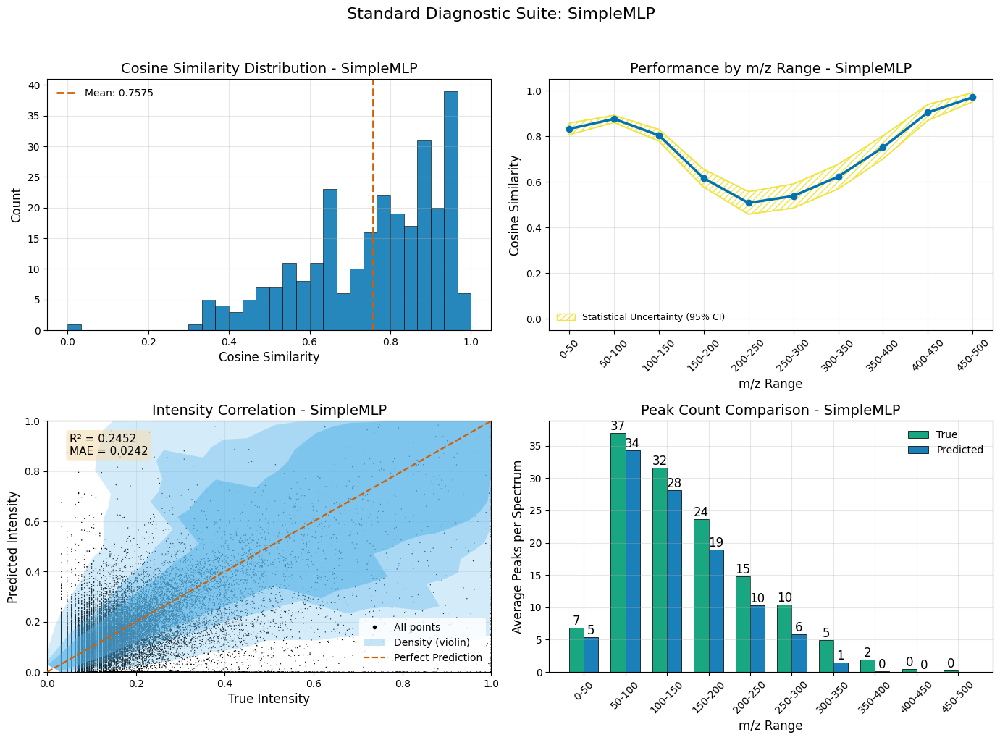


2. Random Spectrum Examples (2x2 Grid)

Selected random examples:
  1. Index 30: Cosine=0.7978, WDP=0.6546
  2. Index 116: Cosine=0.7795, WDP=0.4177
  3. Index 79: Cosine=0.9422, WDP=0.8104
  4. Index 127: Cosine=0.8207, WDP=0.4873


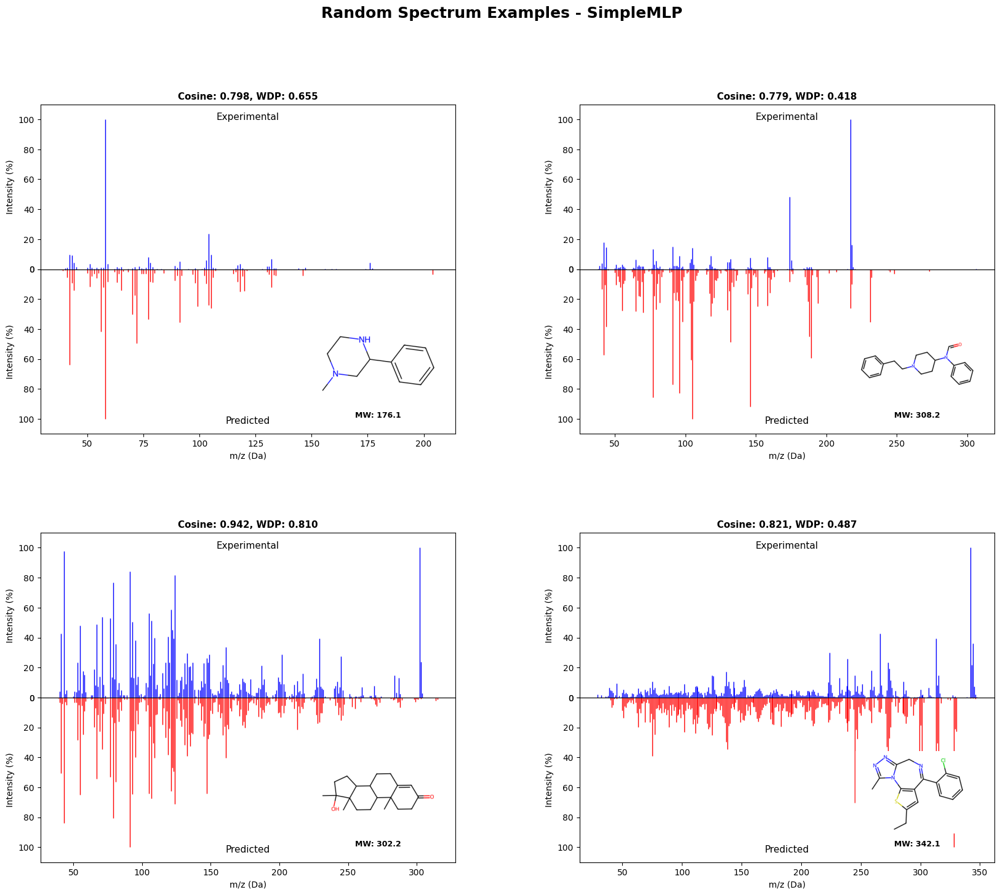


3. Deep Learning Training History


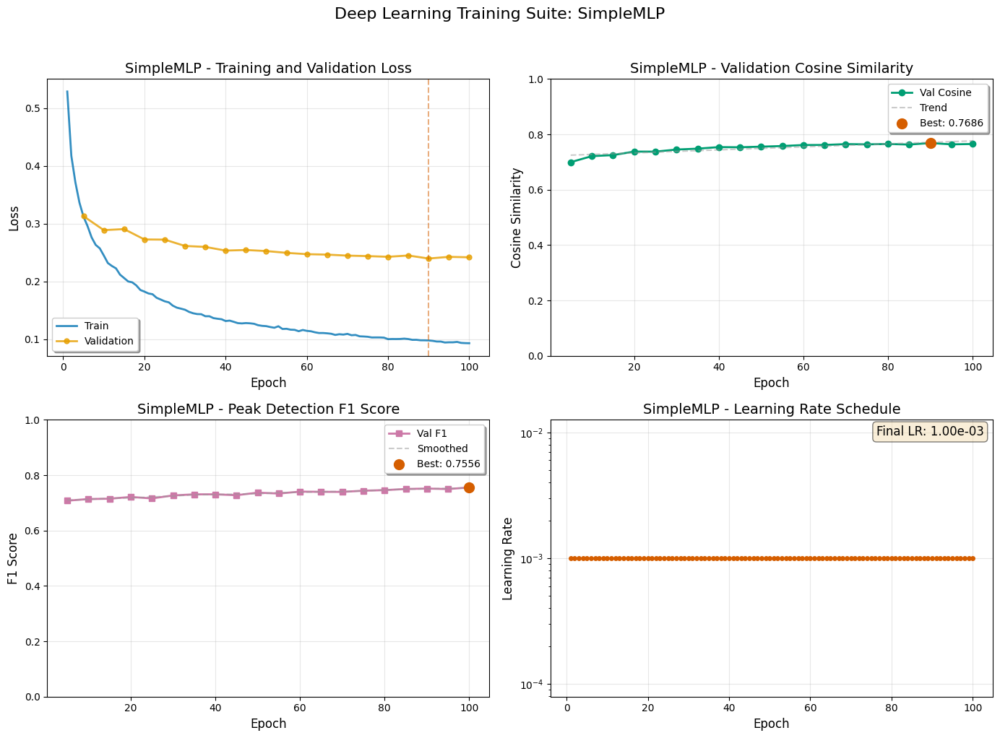


SimpleMLP evaluation complete!


In [10]:
class SimpleMLP(BaseModel):
    def __init__(self, input_dim: int, output_dim: int, config: Dict):
        super().__init__(input_dim, output_dim)
        
        hidden_dims = config['hidden_dims']
        dropout = config['dropout']
        use_bn = config['batch_norm']
        
        layers = []
        dims = [input_dim] + hidden_dims
        
        for i in range(len(hidden_dims)):
            layers.append(nn.Linear(dims[i], dims[i+1]))
            if use_bn:
                layers.append(nn.BatchNorm1d(dims[i+1]))
            layers.append(nn.ReLU())
            layers.append(nn.Dropout(dropout))
        
        layers.append(nn.Linear(hidden_dims[-1], output_dim))
        layers.append(nn.ReLU())
        
        self.network = nn.Sequential(*layers)
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.network(x)

# Train and evaluate SimpleMLP with standard visualizations
if len(X_train) > 0:
    results_simple = train_and_evaluate_model(SimpleMLP, 'SimpleMLP')

## 11. ResidualNet Architecture

Deep MLP with residual blocks to increase effective depth without instabilities.

Structure
- Linear $d\to h$, BN, ReLU.
- $K$ residual blocks (BN–Linear–BN–Linear + skip).
- Linear $h\to B$, ReLU.

Effect: captures higher-order feature interactions and supports wider receptive fields in feature space while keeping gradients healthy.

```mermaid
flowchart TD
  X["Input d"] --> P["Proj d→h"]
  P --> B1["Residual Block"]
  B1 --> B2["Residual Block"]
  B2 --> B3["..."]
  B3 --> BO["Out Linear h→B"]
  BO --> O["ReLU → ŷ"]
```


TRAINING RESIDUALNET
Total parameters: 16,237,044

Training ResidualNet...


Epoch 5/100: 100%|██████████| 34/34 [00:00<00:00, 122.66it/s, loss=0.4697, cos=0.4520]



ResidualNet Performance:
  Cosine Similarity: 0.5263
  MSE: 0.0205, R²: -0.4562
  Peak Detection - Precision: 0.9063, Recall: 0.2776, F1: 0.4250
  Sparsity - True: 0.740, Pred: 0.920
  New best model saved! (Cosine: 0.5263)


Epoch 10/100: 100%|██████████| 34/34 [00:00<00:00, 132.77it/s, loss=0.4412, cos=0.4279]



ResidualNet Performance:
  Cosine Similarity: 0.5354
  MSE: 0.0161, R²: -0.2342
  Peak Detection - Precision: 0.9069, Recall: 0.2910, F1: 0.4406
  Sparsity - True: 0.740, Pred: 0.916
  New best model saved! (Cosine: 0.5354)


Epoch 15/100: 100%|██████████| 34/34 [00:00<00:00, 134.09it/s, loss=0.3855, cos=0.3713]



ResidualNet Performance:
  Cosine Similarity: 0.5589
  MSE: 0.0155, R²: -0.2041
  Peak Detection - Precision: 0.8947, Recall: 0.3232, F1: 0.4748
  Sparsity - True: 0.740, Pred: 0.906
  New best model saved! (Cosine: 0.5589)


Epoch 20/100: 100%|██████████| 34/34 [00:00<00:00, 133.34it/s, loss=0.3583, cos=0.3488]



ResidualNet Performance:
  Cosine Similarity: 0.5543
  MSE: 0.0132, R²: -0.1056
  Peak Detection - Precision: 0.8973, Recall: 0.3116, F1: 0.4626
  Sparsity - True: 0.740, Pred: 0.910


Epoch 25/100: 100%|██████████| 34/34 [00:00<00:00, 129.50it/s, loss=0.3919, cos=0.3819]



ResidualNet Performance:
  Cosine Similarity: 0.5540
  MSE: 0.0135, R²: -0.1200
  Peak Detection - Precision: 0.9004, Recall: 0.3118, F1: 0.4632
  Sparsity - True: 0.740, Pred: 0.910


Epoch 30/100: 100%|██████████| 34/34 [00:00<00:00, 130.86it/s, loss=0.3810, cos=0.3723]



ResidualNet Performance:
  Cosine Similarity: 0.5643
  MSE: 0.0124, R²: -0.0641
  Peak Detection - Precision: 0.8984, Recall: 0.3248, F1: 0.4771
  Sparsity - True: 0.740, Pred: 0.906
  New best model saved! (Cosine: 0.5643)


Epoch 35/100: 100%|██████████| 34/34 [00:00<00:00, 129.90it/s, loss=0.4012, cos=0.3912]



ResidualNet Performance:
  Cosine Similarity: 0.5650
  MSE: 0.0122, R²: -0.0599
  Peak Detection - Precision: 0.8933, Recall: 0.3293, F1: 0.4812
  Sparsity - True: 0.740, Pred: 0.904
  New best model saved! (Cosine: 0.5650)


Epoch 40/100: 100%|██████████| 34/34 [00:00<00:00, 123.74it/s, loss=0.3844, cos=0.3746]



ResidualNet Performance:
  Cosine Similarity: 0.5632
  MSE: 0.0132, R²: -0.0962
  Peak Detection - Precision: 0.8880, Recall: 0.3299, F1: 0.4811
  Sparsity - True: 0.740, Pred: 0.903


Epoch 45/100: 100%|██████████| 34/34 [00:00<00:00, 126.31it/s, loss=0.3783, cos=0.3662]



ResidualNet Performance:
  Cosine Similarity: 0.5792
  MSE: 0.0125, R²: -0.0567
  Peak Detection - Precision: 0.8889, Recall: 0.3542, F1: 0.5065
  Sparsity - True: 0.740, Pred: 0.896
  New best model saved! (Cosine: 0.5792)


Epoch 50/100: 100%|██████████| 34/34 [00:00<00:00, 126.51it/s, loss=0.3372, cos=0.3275]



ResidualNet Performance:
  Cosine Similarity: 0.5995
  MSE: 0.0114, R²: -0.0170
  Peak Detection - Precision: 0.8819, Recall: 0.3755, F1: 0.5267
  Sparsity - True: 0.740, Pred: 0.889
  New best model saved! (Cosine: 0.5995)


Epoch 55/100: 100%|██████████| 34/34 [00:00<00:00, 128.41it/s, loss=0.2926, cos=0.2859]



ResidualNet Performance:
  Cosine Similarity: 0.6255
  MSE: 0.0108, R²: 0.0153
  Peak Detection - Precision: 0.8772, Recall: 0.4082, F1: 0.5571
  Sparsity - True: 0.740, Pred: 0.879
  New best model saved! (Cosine: 0.6255)


Epoch 60/100: 100%|██████████| 34/34 [00:00<00:00, 127.35it/s, loss=0.2822, cos=0.2759]



ResidualNet Performance:
  Cosine Similarity: 0.6389
  MSE: 0.0107, R²: 0.0187
  Peak Detection - Precision: 0.8765, Recall: 0.4340, F1: 0.5805
  Sparsity - True: 0.740, Pred: 0.872
  New best model saved! (Cosine: 0.6389)


Epoch 65/100: 100%|██████████| 34/34 [00:00<00:00, 125.19it/s, loss=0.2550, cos=0.2481]



ResidualNet Performance:
  Cosine Similarity: 0.6663
  MSE: 0.0097, R²: 0.0684
  Peak Detection - Precision: 0.8721, Recall: 0.4694, F1: 0.6103
  Sparsity - True: 0.740, Pred: 0.861
  New best model saved! (Cosine: 0.6663)


Epoch 70/100: 100%|██████████| 34/34 [00:00<00:00, 119.97it/s, loss=0.2421, cos=0.2360]



ResidualNet Performance:
  Cosine Similarity: 0.6792
  MSE: 0.0095, R²: 0.0782
  Peak Detection - Precision: 0.8693, Recall: 0.4957, F1: 0.6314
  Sparsity - True: 0.740, Pred: 0.852
  New best model saved! (Cosine: 0.6792)


Epoch 75/100: 100%|██████████| 34/34 [00:00<00:00, 132.67it/s, loss=0.2125, cos=0.2058]



ResidualNet Performance:
  Cosine Similarity: 0.6955
  MSE: 0.0089, R²: 0.1093
  Peak Detection - Precision: 0.8672, Recall: 0.5234, F1: 0.6528
  Sparsity - True: 0.740, Pred: 0.844
  New best model saved! (Cosine: 0.6955)


Epoch 80/100: 100%|██████████| 34/34 [00:00<00:00, 123.81it/s, loss=0.1836, cos=0.1791]



ResidualNet Performance:
  Cosine Similarity: 0.7019
  MSE: 0.0088, R²: 0.1187
  Peak Detection - Precision: 0.8683, Recall: 0.5339, F1: 0.6612
  Sparsity - True: 0.740, Pred: 0.841
  New best model saved! (Cosine: 0.7019)


Epoch 85/100: 100%|██████████| 34/34 [00:00<00:00, 122.32it/s, loss=0.2361, cos=0.2311]



ResidualNet Performance:
  Cosine Similarity: 0.7083
  MSE: 0.0086, R²: 0.1261
  Peak Detection - Precision: 0.8628, Recall: 0.5544, F1: 0.6750
  Sparsity - True: 0.740, Pred: 0.834
  New best model saved! (Cosine: 0.7083)


Epoch 90/100: 100%|██████████| 34/34 [00:00<00:00, 120.16it/s, loss=0.1678, cos=0.1622]



ResidualNet Performance:
  Cosine Similarity: 0.7142
  MSE: 0.0084, R²: 0.1366
  Peak Detection - Precision: 0.8657, Recall: 0.5599, F1: 0.6800
  Sparsity - True: 0.740, Pred: 0.833
  New best model saved! (Cosine: 0.7142)


Epoch 95/100: 100%|██████████| 34/34 [00:00<00:00, 119.70it/s, loss=0.1664, cos=0.1620]



ResidualNet Performance:
  Cosine Similarity: 0.7159
  MSE: 0.0084, R²: 0.1396
  Peak Detection - Precision: 0.8543, Recall: 0.5734, F1: 0.6862
  Sparsity - True: 0.740, Pred: 0.827
  New best model saved! (Cosine: 0.7159)


Epoch 100/100: 100%|██████████| 34/34 [00:00<00:00, 125.55it/s, loss=0.1775, cos=0.1726]



ResidualNet Performance:
  Cosine Similarity: 0.7197
  MSE: 0.0085, R²: 0.1350
  Peak Detection - Precision: 0.8527, Recall: 0.5806, F1: 0.6908
  Sparsity - True: 0.740, Pred: 0.824
  New best model saved! (Cosine: 0.7197)

Training complete. Best validation cosine: 0.7197

ResidualNet Performance:
  Cosine Similarity: 0.6970
  MSE: 0.0069, R²: 0.1015
  Peak Detection - Precision: 0.8626, Recall: 0.5648, F1: 0.6826
  Sparsity - True: 0.736, Pred: 0.828

------------------------------------------------------------
GENERATING STANDARD VISUALIZATIONS
------------------------------------------------------------

1. Standard 2x2 Diagnostic Plots


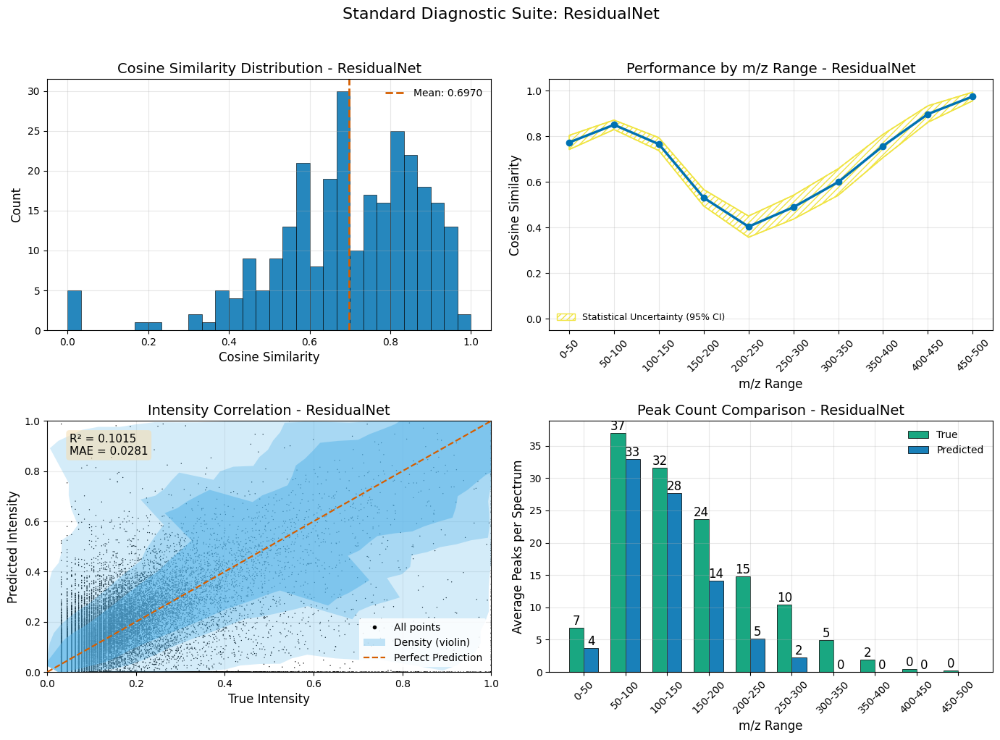


2. Random Spectrum Examples (2x2 Grid)

Selected random examples:
  1. Index 83: Cosine=0.6973, WDP=0.3970
  2. Index 81: Cosine=0.3143, WDP=0.2060
  3. Index 265: Cosine=0.5710, WDP=0.4151
  4. Index 128: Cosine=0.4295, WDP=0.0885


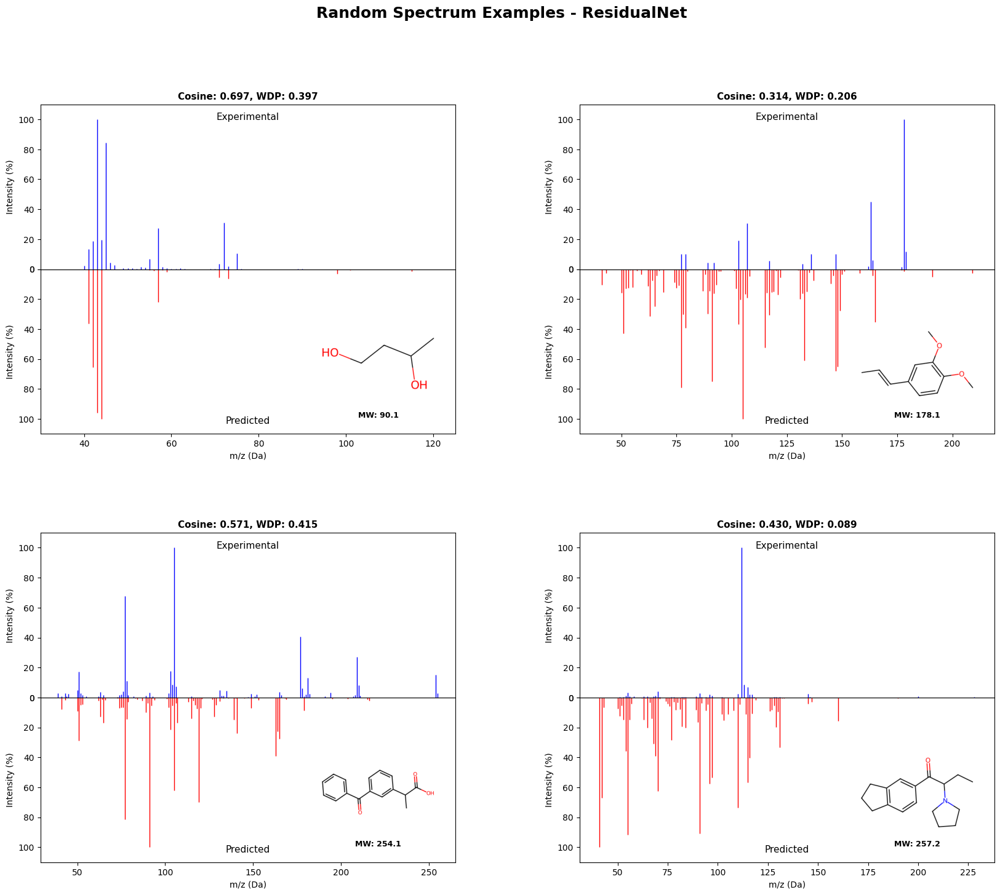


3. Deep Learning Training History


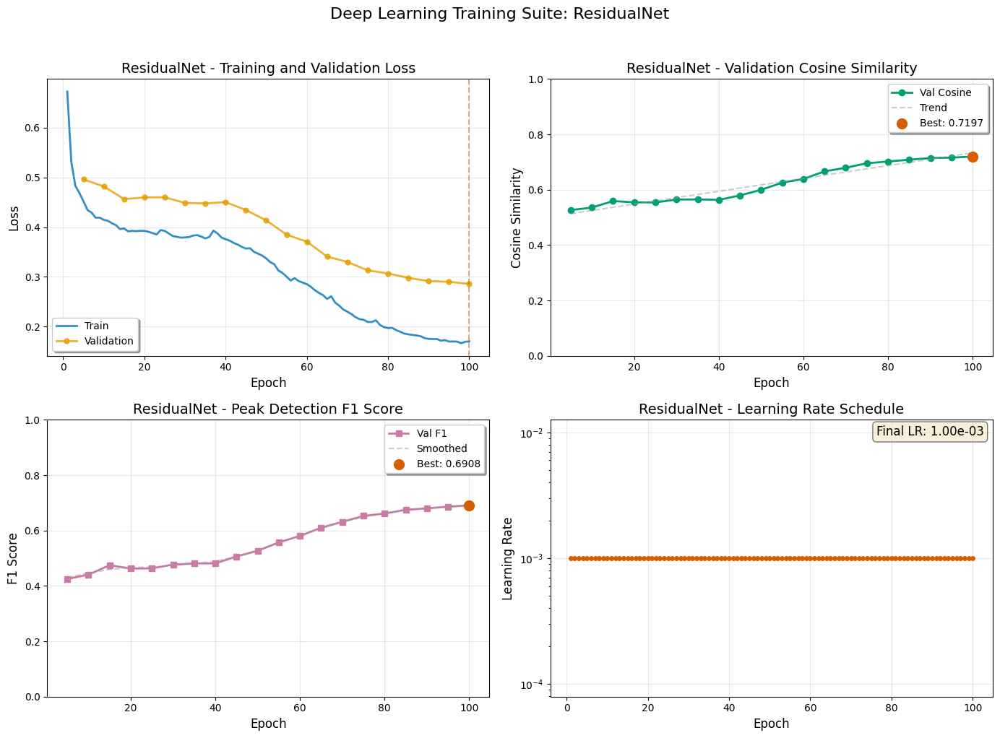


ResidualNet evaluation complete!


In [11]:
class ResidualNet(BaseModel):
    def __init__(self, input_dim: int, output_dim: int, config: Dict):
        super().__init__(input_dim, output_dim)
        
        hidden_dim = config['hidden_dim']
        num_blocks = config['num_blocks']
        dropout = config['dropout']
        
        self.input_proj = nn.Linear(input_dim, hidden_dim)
        self.input_bn = nn.BatchNorm1d(hidden_dim)
        
        self.residual_blocks = nn.ModuleList([
            ResidualBlock(hidden_dim, dropout) for _ in range(num_blocks)
        ])
        
        self.output_proj = nn.Linear(hidden_dim, output_dim)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.input_proj(x)
        x = self.input_bn(x)
        x = F.relu(x)
        
        for block in self.residual_blocks:
            x = block(x)
        
        x = self.output_proj(x)
        x = F.relu(x)
        
        return x

# Train and evaluate ResidualNet with standard visualizations
if len(X_train) > 0:
    results_residual = train_and_evaluate_model(ResidualNet, 'ResidualNet')

## 12. AttentionNet Architecture

Single-layer self-attention over a 1-token sequence (batch-first) provides content-dependent mixing of hidden channels.

Computation
$$
\mathbf{h}=\phi(\mathrm{BN}(\mathbf{W}_p\mathbf{x})),\quad
\mathbf{h}_{att}=\mathrm{MHA}(\mathbf{h},\mathbf{h},\mathbf{h}),\\
\mathbf{h}'=\mathrm{LN}(\mathbf{h}+\mathbf{h}_{att}),\quad
\mathbf{h}''=\mathrm{LN}(\mathbf{h}'+\mathrm{FFN}(\mathbf{h}')),
\quad\hat{\mathbf{y}}=\mathrm{ReLU}(\mathbf{W}_o\mathbf{h}'').
$$

```mermaid
flowchart LR
  X --> P["Proj"]
  P --> A["MHA"]
  A --> R1["Add & LayerNorm"]
  R1 --> FFN["FFN"]
  FFN --> R2["Add & LayerNorm"]
  R2 --> O["Linear+ReLU → ŷ"]
```


TRAINING ATTENTIONNET
Total parameters: 7,064,564

Training AttentionNet...


Epoch 5/100: 100%|██████████| 34/34 [00:00<00:00, 199.14it/s, loss=0.2547, cos=0.2400]



AttentionNet Performance:
  Cosine Similarity: 0.6775
  MSE: 0.0165, R²: -0.2601
  Peak Detection - Precision: 0.8540, Recall: 0.5200, F1: 0.6464
  Sparsity - True: 0.740, Pred: 0.840
  New best model saved! (Cosine: 0.6775)


Epoch 10/100: 100%|██████████| 34/34 [00:00<00:00, 196.16it/s, loss=0.2163, cos=0.2070]



AttentionNet Performance:
  Cosine Similarity: 0.6937
  MSE: 0.0132, R²: -0.1102
  Peak Detection - Precision: 0.8696, Recall: 0.5310, F1: 0.6594
  Sparsity - True: 0.740, Pred: 0.840
  New best model saved! (Cosine: 0.6937)


Epoch 15/100: 100%|██████████| 34/34 [00:00<00:00, 183.28it/s, loss=0.1989, cos=0.1916]



AttentionNet Performance:
  Cosine Similarity: 0.7035
  MSE: 0.0113, R²: -0.0092
  Peak Detection - Precision: 0.8741, Recall: 0.5353, F1: 0.6640
  Sparsity - True: 0.740, Pred: 0.840
  New best model saved! (Cosine: 0.7035)


Epoch 20/100: 100%|██████████| 34/34 [00:00<00:00, 199.27it/s, loss=0.1478, cos=0.1421]



AttentionNet Performance:
  Cosine Similarity: 0.7120
  MSE: 0.0106, R²: 0.0309
  Peak Detection - Precision: 0.8709, Recall: 0.5549, F1: 0.6779
  Sparsity - True: 0.740, Pred: 0.833
  New best model saved! (Cosine: 0.7120)


Epoch 25/100: 100%|██████████| 34/34 [00:00<00:00, 211.40it/s, loss=0.1813, cos=0.1752]



AttentionNet Performance:
  Cosine Similarity: 0.7186
  MSE: 0.0099, R²: 0.0632
  Peak Detection - Precision: 0.8529, Recall: 0.5837, F1: 0.6931
  Sparsity - True: 0.740, Pred: 0.821
  New best model saved! (Cosine: 0.7186)


Epoch 30/100: 100%|██████████| 34/34 [00:00<00:00, 206.46it/s, loss=0.1550, cos=0.1494]



AttentionNet Performance:
  Cosine Similarity: 0.7195
  MSE: 0.0101, R²: 0.0468
  Peak Detection - Precision: 0.8558, Recall: 0.5857, F1: 0.6954
  Sparsity - True: 0.740, Pred: 0.821
  New best model saved! (Cosine: 0.7195)


Epoch 35/100: 100%|██████████| 34/34 [00:00<00:00, 202.24it/s, loss=0.1527, cos=0.1464]



AttentionNet Performance:
  Cosine Similarity: 0.7260
  MSE: 0.0108, R²: 0.0149
  Peak Detection - Precision: 0.8365, Recall: 0.6124, F1: 0.7071
  Sparsity - True: 0.740, Pred: 0.808
  New best model saved! (Cosine: 0.7260)


Epoch 40/100: 100%|██████████| 34/34 [00:00<00:00, 195.60it/s, loss=0.1468, cos=0.1419]



AttentionNet Performance:
  Cosine Similarity: 0.7319
  MSE: 0.0093, R²: 0.0928
  Peak Detection - Precision: 0.8581, Recall: 0.5948, F1: 0.7026
  Sparsity - True: 0.740, Pred: 0.819
  New best model saved! (Cosine: 0.7319)


Epoch 45/100: 100%|██████████| 34/34 [00:00<00:00, 197.60it/s, loss=0.1613, cos=0.1563]



AttentionNet Performance:
  Cosine Similarity: 0.7311
  MSE: 0.0088, R²: 0.1183
  Peak Detection - Precision: 0.8490, Recall: 0.6098, F1: 0.7098
  Sparsity - True: 0.740, Pred: 0.813


Epoch 50/100: 100%|██████████| 34/34 [00:00<00:00, 202.13it/s, loss=0.1264, cos=0.1222]



AttentionNet Performance:
  Cosine Similarity: 0.7347
  MSE: 0.0091, R²: 0.1048
  Peak Detection - Precision: 0.8331, Recall: 0.6319, F1: 0.7187
  Sparsity - True: 0.740, Pred: 0.802
  New best model saved! (Cosine: 0.7347)


Epoch 55/100: 100%|██████████| 34/34 [00:00<00:00, 211.51it/s, loss=0.1423, cos=0.1377]



AttentionNet Performance:
  Cosine Similarity: 0.7357
  MSE: 0.0084, R²: 0.1357
  Peak Detection - Precision: 0.8494, Recall: 0.6191, F1: 0.7162
  Sparsity - True: 0.740, Pred: 0.810
  New best model saved! (Cosine: 0.7357)


Epoch 60/100: 100%|██████████| 34/34 [00:00<00:00, 212.34it/s, loss=0.1228, cos=0.1182]



AttentionNet Performance:
  Cosine Similarity: 0.7362
  MSE: 0.0089, R²: 0.1133
  Peak Detection - Precision: 0.8249, Recall: 0.6465, F1: 0.7249
  Sparsity - True: 0.740, Pred: 0.796
  New best model saved! (Cosine: 0.7362)


Epoch 65/100: 100%|██████████| 34/34 [00:00<00:00, 177.20it/s, loss=0.1428, cos=0.1378]



AttentionNet Performance:
  Cosine Similarity: 0.7352
  MSE: 0.0085, R²: 0.1317
  Peak Detection - Precision: 0.8405, Recall: 0.6243, F1: 0.7164
  Sparsity - True: 0.740, Pred: 0.807


Epoch 70/100: 100%|██████████| 34/34 [00:00<00:00, 179.71it/s, loss=0.1165, cos=0.1125]



AttentionNet Performance:
  Cosine Similarity: 0.7412
  MSE: 0.0085, R²: 0.1377
  Peak Detection - Precision: 0.8382, Recall: 0.6374, F1: 0.7241
  Sparsity - True: 0.740, Pred: 0.802
  New best model saved! (Cosine: 0.7412)


Epoch 75/100: 100%|██████████| 34/34 [00:00<00:00, 189.87it/s, loss=0.1321, cos=0.1284]



AttentionNet Performance:
  Cosine Similarity: 0.7405
  MSE: 0.0080, R²: 0.1585
  Peak Detection - Precision: 0.8385, Recall: 0.6386, F1: 0.7250
  Sparsity - True: 0.740, Pred: 0.802


Epoch 80/100: 100%|██████████| 34/34 [00:00<00:00, 199.45it/s, loss=0.1448, cos=0.1405]



AttentionNet Performance:
  Cosine Similarity: 0.7420
  MSE: 0.0084, R²: 0.1378
  Peak Detection - Precision: 0.8315, Recall: 0.6478, F1: 0.7283
  Sparsity - True: 0.740, Pred: 0.797
  New best model saved! (Cosine: 0.7420)


Epoch 85/100: 100%|██████████| 34/34 [00:00<00:00, 183.14it/s, loss=0.1358, cos=0.1322]



AttentionNet Performance:
  Cosine Similarity: 0.7446
  MSE: 0.0079, R²: 0.1675
  Peak Detection - Precision: 0.8346, Recall: 0.6474, F1: 0.7292
  Sparsity - True: 0.740, Pred: 0.799
  New best model saved! (Cosine: 0.7446)


Epoch 90/100: 100%|██████████| 34/34 [00:00<00:00, 193.49it/s, loss=0.0872, cos=0.0845]



AttentionNet Performance:
  Cosine Similarity: 0.7439
  MSE: 0.0077, R²: 0.1731
  Peak Detection - Precision: 0.8291, Recall: 0.6542, F1: 0.7313
  Sparsity - True: 0.740, Pred: 0.796


Epoch 95/100: 100%|██████████| 34/34 [00:00<00:00, 198.17it/s, loss=0.1149, cos=0.1117]



AttentionNet Performance:
  Cosine Similarity: 0.7462
  MSE: 0.0077, R²: 0.1737
  Peak Detection - Precision: 0.8341, Recall: 0.6553, F1: 0.7339
  Sparsity - True: 0.740, Pred: 0.796
  New best model saved! (Cosine: 0.7462)


Epoch 100/100: 100%|██████████| 34/34 [00:00<00:00, 185.46it/s, loss=0.1198, cos=0.1164]



AttentionNet Performance:
  Cosine Similarity: 0.7455
  MSE: 0.0079, R²: 0.1653
  Peak Detection - Precision: 0.8251, Recall: 0.6615, F1: 0.7343
  Sparsity - True: 0.740, Pred: 0.792

Training complete. Best validation cosine: 0.7462

AttentionNet Performance:
  Cosine Similarity: 0.7332
  MSE: 0.0060, R²: 0.1867
  Peak Detection - Precision: 0.8427, Recall: 0.6485, F1: 0.7329
  Sparsity - True: 0.736, Pred: 0.798

------------------------------------------------------------
GENERATING STANDARD VISUALIZATIONS
------------------------------------------------------------

1. Standard 2x2 Diagnostic Plots


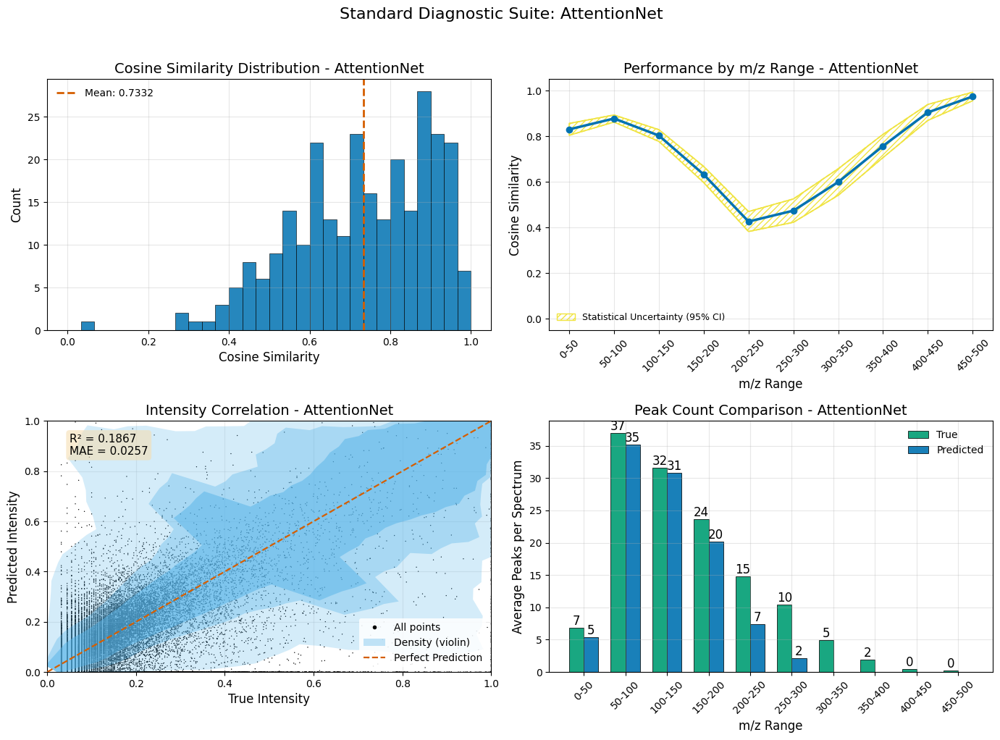


2. Random Spectrum Examples (2x2 Grid)

Selected random examples:
  1. Index 80: Cosine=0.8892, WDP=0.9683
  2. Index 129: Cosine=0.8914, WDP=1.1863
  3. Index 208: Cosine=0.7054, WDP=0.6227
  4. Index 241: Cosine=0.3835, WDP=0.1428


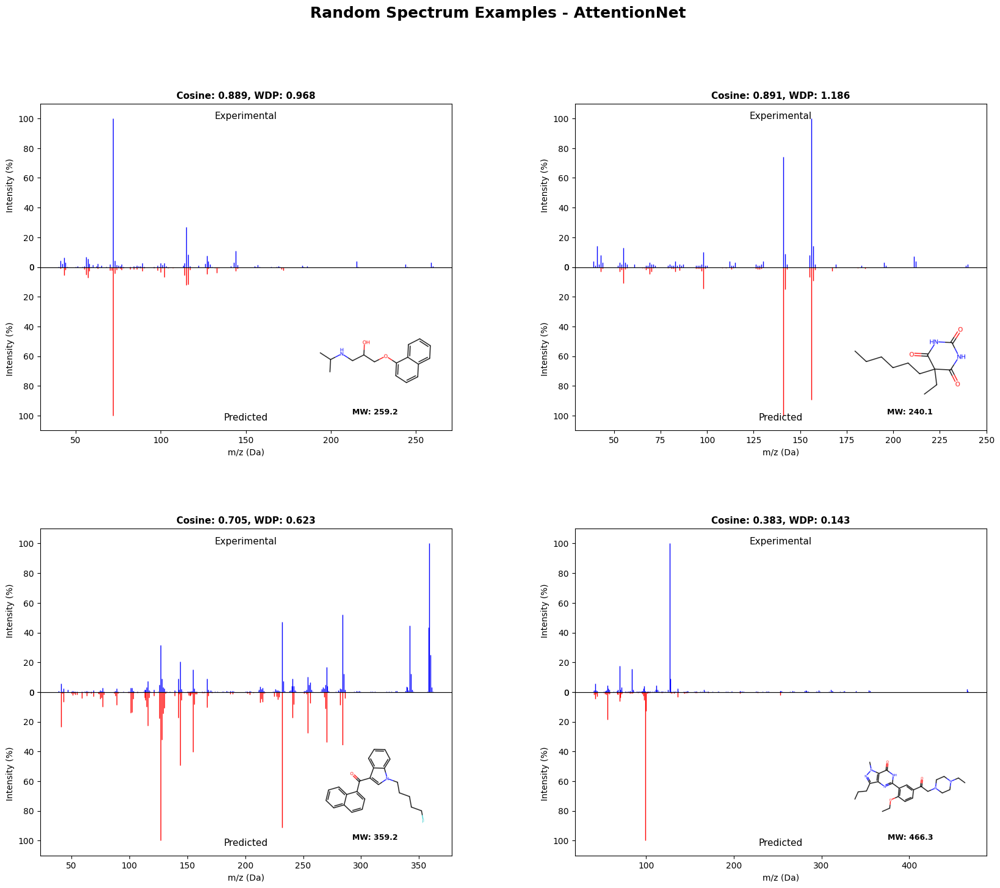


3. Deep Learning Training History


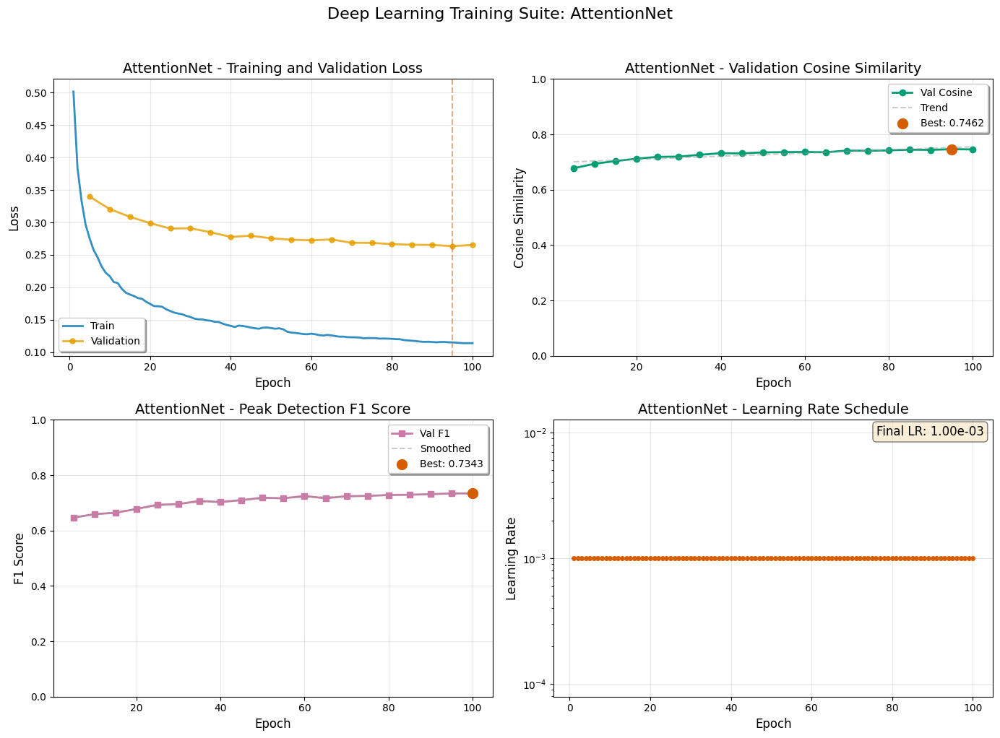


AttentionNet evaluation complete!


In [12]:
class AttentionNet(BaseModel):
    def __init__(self, input_dim: int, output_dim: int, config: Dict):
        super().__init__(input_dim, output_dim)
        
        hidden_dim = config['hidden_dim']
        num_heads = config['num_heads']
        dropout = config['dropout']
        
        self.input_proj = nn.Linear(input_dim, hidden_dim)
        self.input_bn = nn.BatchNorm1d(hidden_dim)
        
        self.attention = nn.MultiheadAttention(
            hidden_dim, num_heads, dropout=dropout, batch_first=True
        )
        
        self.norm1 = nn.LayerNorm(hidden_dim)
        
        self.ffn = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim * 4),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim * 4, hidden_dim)
        )
        
        self.norm2 = nn.LayerNorm(hidden_dim)
        self.output_proj = nn.Linear(hidden_dim, output_dim)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.input_proj(x)
        x = self.input_bn(x)
        x = F.relu(x)
        
        x = x.unsqueeze(1)  # Add sequence dimension
        
        attn_out, _ = self.attention(x, x, x)
        x = self.norm1(x + attn_out)
        
        ffn_out = self.ffn(x)
        x = self.norm2(x + ffn_out)
        
        x = x.squeeze(1)  # Remove sequence dimension
        
        x = self.output_proj(x)
        x = F.relu(x)
        
        return x

# Train and evaluate AttentionNet with standard visualizations
if len(X_train) > 0:
    results_attention = train_and_evaluate_model(AttentionNet, 'AttentionNet')

## 13. DenseNet Architecture

A dense block concatenates all previous features at each layer (growth rate $g$), enabling feature reuse.

Dense block (L layers):
$$
\mathbf{h}^{(l)}=\phi(\mathrm{BN}([\mathbf{h}^{(0)},\ldots,\mathbf{h}^{(l-1)}])\mathbf{W}^{(l)})
\Rightarrow
\mathbf{h}^{(L)}=[\mathbf{h}^{(0)},\ldots,\mathbf{h}^{(L-1)}].
$$
Transitions compress via $1\times 1$ linear + dropout (compression factor $c\in(0,1]$).

```mermaid
flowchart TD
  X["Input"] --> P
  subgraph "Dense Block 1"
    P --> H1
    H1 --> H2
    H2 --> H3
    H3 --> Cat1["Concat"]
  end
  Cat1 --> T1["Transition (compress)"]
  T1 --> O["Final Linear+ReLU → ŷ"]
```


TRAINING DENSENET
Total parameters: 1,239,156

Training DenseNet...


Epoch 5/100: 100%|██████████| 34/34 [00:00<00:00, 113.11it/s, loss=0.3400, cos=0.3267]



DenseNet Performance:
  Cosine Similarity: 0.6589
  MSE: 0.0142, R²: -0.1646
  Peak Detection - Precision: 0.6792, Recall: 0.7764, F1: 0.7245
  Sparsity - True: 0.740, Pred: 0.704
  New best model saved! (Cosine: 0.6589)


Epoch 10/100: 100%|██████████| 34/34 [00:00<00:00, 109.60it/s, loss=0.3107, cos=0.2999]



DenseNet Performance:
  Cosine Similarity: 0.6928
  MSE: 0.0121, R²: -0.0396
  Peak Detection - Precision: 0.7261, Recall: 0.7518, F1: 0.7387
  Sparsity - True: 0.740, Pred: 0.731
  New best model saved! (Cosine: 0.6928)


Epoch 15/100: 100%|██████████| 34/34 [00:00<00:00, 116.08it/s, loss=0.2891, cos=0.2792]



DenseNet Performance:
  Cosine Similarity: 0.7133
  MSE: 0.0111, R²: 0.0096
  Peak Detection - Precision: 0.7348, Recall: 0.7480, F1: 0.7413
  Sparsity - True: 0.740, Pred: 0.735
  New best model saved! (Cosine: 0.7133)


Epoch 20/100: 100%|██████████| 34/34 [00:00<00:00, 86.12it/s, loss=0.2680, cos=0.2596]



DenseNet Performance:
  Cosine Similarity: 0.7183
  MSE: 0.0118, R²: -0.0238
  Peak Detection - Precision: 0.7460, Recall: 0.7420, F1: 0.7440
  Sparsity - True: 0.740, Pred: 0.741
  New best model saved! (Cosine: 0.7183)


Epoch 25/100: 100%|██████████| 34/34 [00:00<00:00, 103.55it/s, loss=0.2903, cos=0.2827]



DenseNet Performance:
  Cosine Similarity: 0.7249
  MSE: 0.0101, R²: 0.0587
  Peak Detection - Precision: 0.7551, Recall: 0.7359, F1: 0.7454
  Sparsity - True: 0.740, Pred: 0.747
  New best model saved! (Cosine: 0.7249)


Epoch 30/100: 100%|██████████| 34/34 [00:00<00:00, 98.41it/s, loss=0.2542, cos=0.2451] 



DenseNet Performance:
  Cosine Similarity: 0.7286
  MSE: 0.0102, R²: 0.0528
  Peak Detection - Precision: 0.7698, Recall: 0.7204, F1: 0.7443
  Sparsity - True: 0.740, Pred: 0.756
  New best model saved! (Cosine: 0.7286)


Epoch 35/100: 100%|██████████| 34/34 [00:00<00:00, 101.12it/s, loss=0.2476, cos=0.2406]



DenseNet Performance:
  Cosine Similarity: 0.7342
  MSE: 0.0100, R²: 0.0580
  Peak Detection - Precision: 0.7771, Recall: 0.7237, F1: 0.7495
  Sparsity - True: 0.740, Pred: 0.758
  New best model saved! (Cosine: 0.7342)


Epoch 40/100: 100%|██████████| 34/34 [00:00<00:00, 103.68it/s, loss=0.2463, cos=0.2394]



DenseNet Performance:
  Cosine Similarity: 0.7342
  MSE: 0.0096, R²: 0.0830
  Peak Detection - Precision: 0.7681, Recall: 0.7251, F1: 0.7460
  Sparsity - True: 0.740, Pred: 0.754
  New best model saved! (Cosine: 0.7342)


Epoch 45/100: 100%|██████████| 34/34 [00:00<00:00, 42.50it/s, loss=0.2386, cos=0.2328]



DenseNet Performance:
  Cosine Similarity: 0.7383
  MSE: 0.0093, R²: 0.0950
  Peak Detection - Precision: 0.7770, Recall: 0.7222, F1: 0.7486
  Sparsity - True: 0.740, Pred: 0.758
  New best model saved! (Cosine: 0.7383)


Epoch 50/100: 100%|██████████| 34/34 [00:00<00:00, 43.08it/s, loss=0.2379, cos=0.2312]



DenseNet Performance:
  Cosine Similarity: 0.7399
  MSE: 0.0094, R²: 0.0983
  Peak Detection - Precision: 0.7941, Recall: 0.7037, F1: 0.7462
  Sparsity - True: 0.740, Pred: 0.769
  New best model saved! (Cosine: 0.7399)


Epoch 55/100: 100%|██████████| 34/34 [00:00<00:00, 44.02it/s, loss=0.1830, cos=0.1770]



DenseNet Performance:
  Cosine Similarity: 0.7374
  MSE: 0.0094, R²: 0.0949
  Peak Detection - Precision: 0.7811, Recall: 0.7118, F1: 0.7449
  Sparsity - True: 0.740, Pred: 0.763


Epoch 60/100: 100%|██████████| 34/34 [00:00<00:00, 43.22it/s, loss=0.2037, cos=0.1979]



DenseNet Performance:
  Cosine Similarity: 0.7388
  MSE: 0.0094, R²: 0.0920
  Peak Detection - Precision: 0.7915, Recall: 0.7063, F1: 0.7464
  Sparsity - True: 0.740, Pred: 0.768


Epoch 65/100: 100%|██████████| 34/34 [00:00<00:00, 42.85it/s, loss=0.1934, cos=0.1889]



DenseNet Performance:
  Cosine Similarity: 0.7447
  MSE: 0.0097, R²: 0.0777
  Peak Detection - Precision: 0.7894, Recall: 0.7121, F1: 0.7488
  Sparsity - True: 0.740, Pred: 0.765
  New best model saved! (Cosine: 0.7447)


Epoch 70/100: 100%|██████████| 34/34 [00:00<00:00, 42.40it/s, loss=0.2153, cos=0.2092]



DenseNet Performance:
  Cosine Similarity: 0.7463
  MSE: 0.0096, R²: 0.0845
  Peak Detection - Precision: 0.7901, Recall: 0.7149, F1: 0.7506
  Sparsity - True: 0.740, Pred: 0.765
  New best model saved! (Cosine: 0.7463)


Epoch 75/100: 100%|██████████| 34/34 [00:00<00:00, 105.16it/s, loss=0.2135, cos=0.2068]



DenseNet Performance:
  Cosine Similarity: 0.7421
  MSE: 0.0100, R²: 0.0659
  Peak Detection - Precision: 0.8054, Recall: 0.6943, F1: 0.7457
  Sparsity - True: 0.740, Pred: 0.776


Epoch 80/100: 100%|██████████| 34/34 [00:00<00:00, 111.40it/s, loss=0.1899, cos=0.1846]



DenseNet Performance:
  Cosine Similarity: 0.7420
  MSE: 0.0089, R²: 0.1233
  Peak Detection - Precision: 0.7975, Recall: 0.7036, F1: 0.7476
  Sparsity - True: 0.740, Pred: 0.770


Epoch 85/100: 100%|██████████| 34/34 [00:00<00:00, 44.04it/s, loss=0.1799, cos=0.1748]



DenseNet Performance:
  Cosine Similarity: 0.7426
  MSE: 0.0090, R²: 0.1153
  Peak Detection - Precision: 0.7952, Recall: 0.7019, F1: 0.7457
  Sparsity - True: 0.740, Pred: 0.770


Epoch 90/100: 100%|██████████| 34/34 [00:00<00:00, 42.67it/s, loss=0.1888, cos=0.1829]



DenseNet Performance:
  Cosine Similarity: 0.7486
  MSE: 0.0093, R²: 0.0984
  Peak Detection - Precision: 0.8020, Recall: 0.6974, F1: 0.7461
  Sparsity - True: 0.740, Pred: 0.773
  New best model saved! (Cosine: 0.7486)


Epoch 95/100: 100%|██████████| 34/34 [00:00<00:00, 44.12it/s, loss=0.1894, cos=0.1843]



DenseNet Performance:
  Cosine Similarity: 0.7469
  MSE: 0.0089, R²: 0.1231
  Peak Detection - Precision: 0.8138, Recall: 0.6884, F1: 0.7459
  Sparsity - True: 0.740, Pred: 0.780


Epoch 100/100: 100%|██████████| 34/34 [00:00<00:00, 43.64it/s, loss=0.1774, cos=0.1730]



DenseNet Performance:
  Cosine Similarity: 0.7491
  MSE: 0.0096, R²: 0.0877
  Peak Detection - Precision: 0.8070, Recall: 0.6952, F1: 0.7470
  Sparsity - True: 0.740, Pred: 0.775
  New best model saved! (Cosine: 0.7491)

Training complete. Best validation cosine: 0.7491

DenseNet Performance:
  Cosine Similarity: 0.7370
  MSE: 0.0092, R²: -0.0823
  Peak Detection - Precision: 0.8162, Recall: 0.7083, F1: 0.7584
  Sparsity - True: 0.736, Pred: 0.771

------------------------------------------------------------
GENERATING STANDARD VISUALIZATIONS
------------------------------------------------------------

1. Standard 2x2 Diagnostic Plots


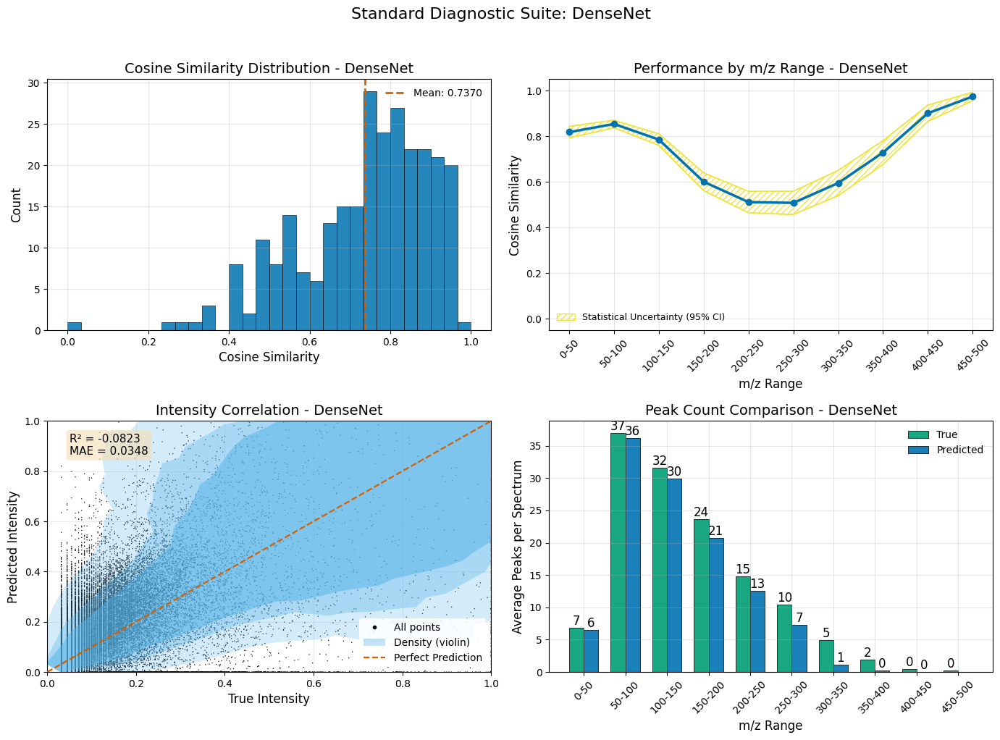


2. Random Spectrum Examples (2x2 Grid)

Selected random examples:
  1. Index 95: Cosine=0.7262, WDP=0.5734
  2. Index 211: Cosine=0.9074, WDP=1.3701
  3. Index 53: Cosine=0.7804, WDP=0.7274
  4. Index 75: Cosine=0.8619, WDP=1.2709


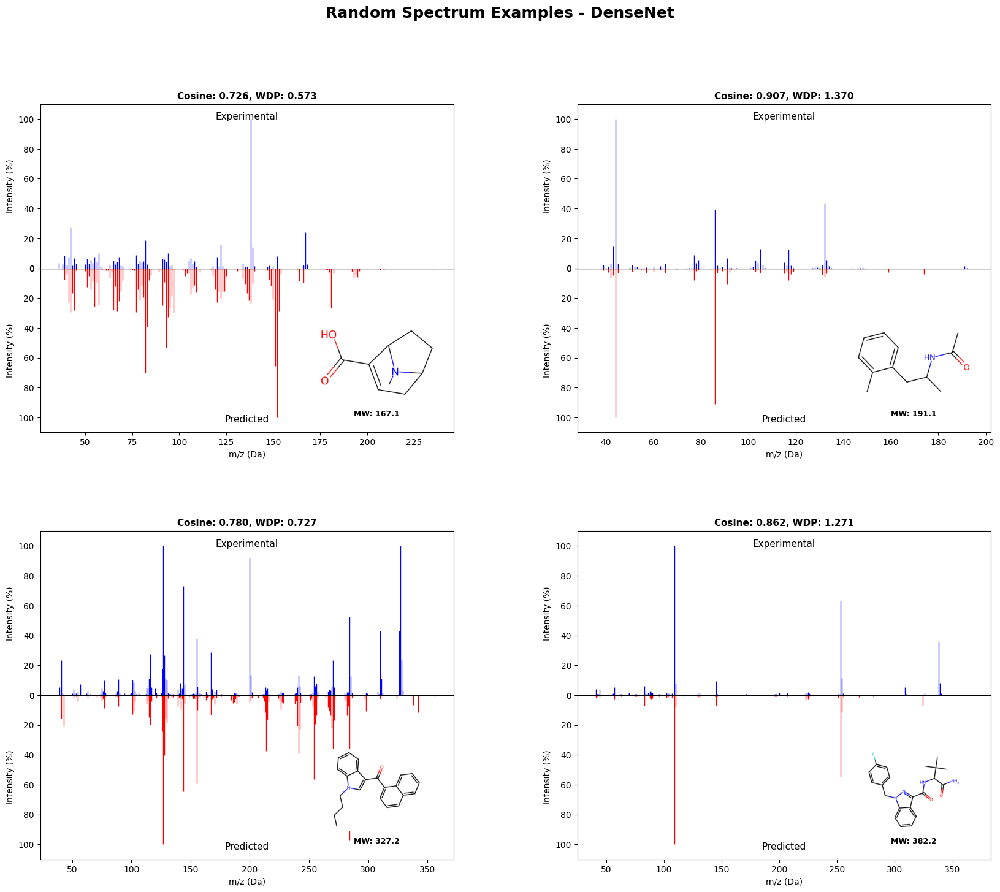


3. Deep Learning Training History


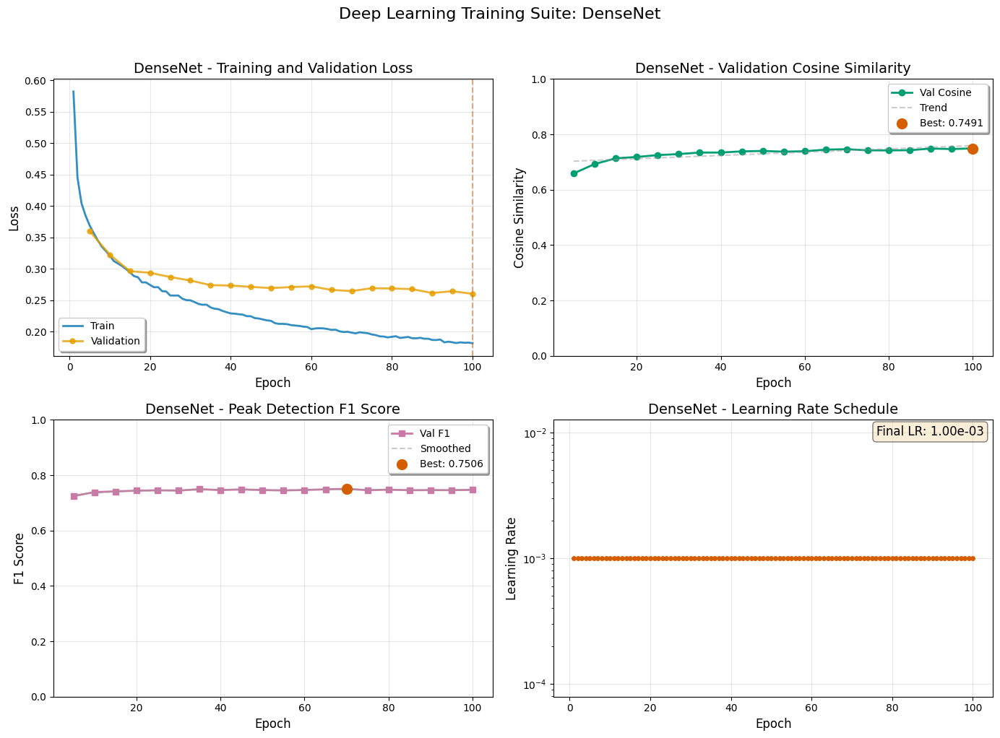


DenseNet evaluation complete!


In [13]:
class DenseBlock(nn.Module):
    """Dense block for DenseNet"""
    def __init__(self, in_channels: int, growth_rate: int, num_layers: int = 4):
        super().__init__()
        self.layers = nn.ModuleList()
        
        for i in range(num_layers):
            self.layers.append(
                nn.Sequential(
                    nn.BatchNorm1d(in_channels + i * growth_rate),
                    nn.ReLU(),
                    nn.Linear(in_channels + i * growth_rate, growth_rate)
                )
            )
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        features = [x]
        for layer in self.layers:
            new_features = layer(torch.cat(features, dim=1))
            features.append(new_features)
        return torch.cat(features, dim=1)

class DenseNet(BaseModel):
    def __init__(self, input_dim: int, output_dim: int, config: Dict):
        super().__init__(input_dim, output_dim)
        
        growth_rate = config['growth_rate']
        num_blocks = config['num_blocks']
        compression = config['compression']
        
        # Initial projection
        self.input_proj = nn.Linear(input_dim, growth_rate * 4)
        
        # Dense blocks with transition layers
        self.blocks = nn.ModuleList()
        self.transitions = nn.ModuleList()
        
        current_channels = growth_rate * 4
        
        for i in range(num_blocks):
            block = DenseBlock(current_channels, growth_rate)
            self.blocks.append(block)
            current_channels += growth_rate * 4  # 4 layers per block
            
            if i < num_blocks - 1:  # No transition after last block
                out_channels = int(current_channels * compression)
                transition = nn.Sequential(
                    nn.BatchNorm1d(current_channels),
                    nn.ReLU(),
                    nn.Linear(current_channels, out_channels),
                    nn.Dropout(0.2)
                )
                self.transitions.append(transition)
                current_channels = out_channels
        
        # Final layers
        self.final_bn = nn.BatchNorm1d(current_channels)
        self.output_proj = nn.Linear(current_channels, output_dim)
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.input_proj(x)
        
        for i, block in enumerate(self.blocks):
            x = block(x)
            if i < len(self.transitions):
                x = self.transitions[i](x)
        
        x = self.final_bn(x)
        x = F.relu(x)
        x = self.output_proj(x)
        x = F.relu(x)
        
        return x

# Train and evaluate DenseNet with standard visualizations
if len(X_train) > 0:
    results_dense = train_and_evaluate_model(DenseNet, 'DenseNet')

## 14. DeepSetNet Architecture

Permutation-invariant DeepSets pattern ($\rho \circ \mathrm{Agg} \circ \phi$). Here, since input is a fixed feature vector (not a literal set), the encoder $\phi$ learns a compact representation directly passed to decoder $\rho$; aggregation is identity.

$$
\mathbf{z}=\phi(\mathbf{x}),\quad
\bar{\mathbf{z}}=\mathrm{Agg}(\{\mathbf{z}\})\equiv\mathbf{z},\quad
\hat{\mathbf{y}}=\rho(\bar{\mathbf{z}}).
$$

```mermaid
flowchart LR
  X["Input x"] --> Phi["Encoder φ"]
  Phi --> Agg["Aggregation"]
  Agg --> Rho["Decoder ρ"]
  Rho --> O["ŷ (B)"]
```


TRAINING DEEPSETNET
Total parameters: 4,959,988

Training DeepSetNet...


Epoch 5/100: 100%|██████████| 34/34 [00:00<00:00, 117.46it/s, loss=0.3704, cos=0.3505]



DeepSetNet Performance:
  Cosine Similarity: 0.6619
  MSE: 0.0201, R²: -0.4859
  Peak Detection - Precision: 0.7813, Recall: 0.5955, F1: 0.6759
  Sparsity - True: 0.740, Pred: 0.801
  New best model saved! (Cosine: 0.6619)


Epoch 10/100: 100%|██████████| 34/34 [00:00<00:00, 253.39it/s, loss=0.2711, cos=0.2609]



DeepSetNet Performance:
  Cosine Similarity: 0.6938
  MSE: 0.0134, R²: -0.0806
  Peak Detection - Precision: 0.8165, Recall: 0.6064, F1: 0.6959
  Sparsity - True: 0.740, Pred: 0.807
  New best model saved! (Cosine: 0.6938)


Epoch 15/100: 100%|██████████| 34/34 [00:00<00:00, 230.42it/s, loss=0.2385, cos=0.2299]



DeepSetNet Performance:
  Cosine Similarity: 0.7151
  MSE: 0.0118, R²: 0.0077
  Peak Detection - Precision: 0.8210, Recall: 0.6174, F1: 0.7048
  Sparsity - True: 0.740, Pred: 0.805
  New best model saved! (Cosine: 0.7151)


Epoch 20/100: 100%|██████████| 34/34 [00:00<00:00, 141.50it/s, loss=0.2261, cos=0.2193]



DeepSetNet Performance:
  Cosine Similarity: 0.7229
  MSE: 0.0095, R²: 0.1078
  Peak Detection - Precision: 0.8118, Recall: 0.6392, F1: 0.7153
  Sparsity - True: 0.740, Pred: 0.796
  New best model saved! (Cosine: 0.7229)


Epoch 25/100: 100%|██████████| 34/34 [00:00<00:00, 119.74it/s, loss=0.2225, cos=0.2155]



DeepSetNet Performance:
  Cosine Similarity: 0.7250
  MSE: 0.0092, R²: 0.1240
  Peak Detection - Precision: 0.8188, Recall: 0.6370, F1: 0.7166
  Sparsity - True: 0.740, Pred: 0.799
  New best model saved! (Cosine: 0.7250)


Epoch 30/100: 100%|██████████| 34/34 [00:00<00:00, 116.71it/s, loss=0.1861, cos=0.1805]



DeepSetNet Performance:
  Cosine Similarity: 0.7315
  MSE: 0.0085, R²: 0.1570
  Peak Detection - Precision: 0.8153, Recall: 0.6566, F1: 0.7274
  Sparsity - True: 0.740, Pred: 0.792
  New best model saved! (Cosine: 0.7315)


Epoch 35/100: 100%|██████████| 34/34 [00:00<00:00, 118.05it/s, loss=0.1970, cos=0.1844]



DeepSetNet Performance:
  Cosine Similarity: 0.7381
  MSE: 0.0085, R²: 0.1485
  Peak Detection - Precision: 0.8197, Recall: 0.6603, F1: 0.7314
  Sparsity - True: 0.740, Pred: 0.792
  New best model saved! (Cosine: 0.7381)


Epoch 40/100: 100%|██████████| 34/34 [00:00<00:00, 111.84it/s, loss=0.1882, cos=0.1810]



DeepSetNet Performance:
  Cosine Similarity: 0.7418
  MSE: 0.0097, R²: 0.0084
  Peak Detection - Precision: 0.8272, Recall: 0.6638, F1: 0.7366
  Sparsity - True: 0.740, Pred: 0.793
  New best model saved! (Cosine: 0.7418)


Epoch 45/100: 100%|██████████| 34/34 [00:00<00:00, 116.92it/s, loss=0.1789, cos=0.1713]



DeepSetNet Performance:
  Cosine Similarity: 0.7473
  MSE: 0.0084, R²: 0.1599
  Peak Detection - Precision: 0.8327, Recall: 0.6589, F1: 0.7356
  Sparsity - True: 0.740, Pred: 0.796
  New best model saved! (Cosine: 0.7473)


Epoch 50/100: 100%|██████████| 34/34 [00:00<00:00, 113.26it/s, loss=0.1722, cos=0.1662]



DeepSetNet Performance:
  Cosine Similarity: 0.7331
  MSE: 0.0100, R²: 0.0924
  Peak Detection - Precision: 0.8363, Recall: 0.6402, F1: 0.7252
  Sparsity - True: 0.740, Pred: 0.803


Epoch 55/100: 100%|██████████| 34/34 [00:00<00:00, 116.61it/s, loss=0.1474, cos=0.1431]



DeepSetNet Performance:
  Cosine Similarity: 0.7426
  MSE: 0.0079, R²: 0.1794
  Peak Detection - Precision: 0.8272, Recall: 0.6683, F1: 0.7393
  Sparsity - True: 0.740, Pred: 0.793


Epoch 60/100: 100%|██████████| 34/34 [00:00<00:00, 113.48it/s, loss=0.1591, cos=0.1515]



DeepSetNet Performance:
  Cosine Similarity: 0.7519
  MSE: 0.0099, R²: 0.0357
  Peak Detection - Precision: 0.8416, Recall: 0.6626, F1: 0.7415
  Sparsity - True: 0.740, Pred: 0.797
  New best model saved! (Cosine: 0.7519)


Epoch 65/100: 100%|██████████| 34/34 [00:00<00:00, 113.22it/s, loss=0.1437, cos=0.1397]



DeepSetNet Performance:
  Cosine Similarity: 0.7510
  MSE: 0.0079, R²: 0.1848
  Peak Detection - Precision: 0.8359, Recall: 0.6723, F1: 0.7452
  Sparsity - True: 0.740, Pred: 0.795


Epoch 70/100: 100%|██████████| 34/34 [00:00<00:00, 120.27it/s, loss=0.1265, cos=0.1212]



DeepSetNet Performance:
  Cosine Similarity: 0.7433
  MSE: 0.0096, R²: 0.1115
  Peak Detection - Precision: 0.8309, Recall: 0.6645, F1: 0.7384
  Sparsity - True: 0.740, Pred: 0.796


Epoch 75/100: 100%|██████████| 34/34 [00:00<00:00, 199.87it/s, loss=0.1253, cos=0.1205]



DeepSetNet Performance:
  Cosine Similarity: 0.7503
  MSE: 0.0076, R²: 0.1895
  Peak Detection - Precision: 0.8287, Recall: 0.6729, F1: 0.7427
  Sparsity - True: 0.740, Pred: 0.793


Epoch 80/100: 100%|██████████| 34/34 [00:00<00:00, 204.25it/s, loss=0.1217, cos=0.1160]



DeepSetNet Performance:
  Cosine Similarity: 0.7504
  MSE: 0.0128, R²: 0.0256
  Peak Detection - Precision: 0.8335, Recall: 0.6716, F1: 0.7438
  Sparsity - True: 0.740, Pred: 0.794


Epoch 85/100: 100%|██████████| 34/34 [00:00<00:00, 226.28it/s, loss=0.1321, cos=0.1281]



DeepSetNet Performance:
  Cosine Similarity: 0.7561
  MSE: 0.0074, R²: 0.2025
  Peak Detection - Precision: 0.8333, Recall: 0.6835, F1: 0.7510
  Sparsity - True: 0.740, Pred: 0.791
  New best model saved! (Cosine: 0.7561)


Epoch 90/100: 100%|██████████| 34/34 [00:00<00:00, 116.69it/s, loss=0.1323, cos=0.1287]



DeepSetNet Performance:
  Cosine Similarity: 0.7374
  MSE: 0.0083, R²: 0.1617
  Peak Detection - Precision: 0.8400, Recall: 0.6435, F1: 0.7287
  Sparsity - True: 0.740, Pred: 0.806


Epoch 95/100: 100%|██████████| 34/34 [00:00<00:00, 112.97it/s, loss=0.1252, cos=0.1211]



DeepSetNet Performance:
  Cosine Similarity: 0.7567
  MSE: 0.0089, R²: 0.1407
  Peak Detection - Precision: 0.8366, Recall: 0.6834, F1: 0.7523
  Sparsity - True: 0.740, Pred: 0.791
  New best model saved! (Cosine: 0.7567)


Epoch 100/100: 100%|██████████| 34/34 [00:00<00:00, 118.12it/s, loss=0.1284, cos=0.1246]



DeepSetNet Performance:
  Cosine Similarity: 0.7484
  MSE: 0.0076, R²: 0.1937
  Peak Detection - Precision: 0.8328, Recall: 0.6788, F1: 0.7480
  Sparsity - True: 0.740, Pred: 0.793

Training complete. Best validation cosine: 0.7567

DeepSetNet Performance:
  Cosine Similarity: 0.7411
  MSE: 0.0070, R²: 0.1415
  Peak Detection - Precision: 0.8403, Recall: 0.6722, F1: 0.7469
  Sparsity - True: 0.736, Pred: 0.793

------------------------------------------------------------
GENERATING STANDARD VISUALIZATIONS
------------------------------------------------------------

1. Standard 2x2 Diagnostic Plots


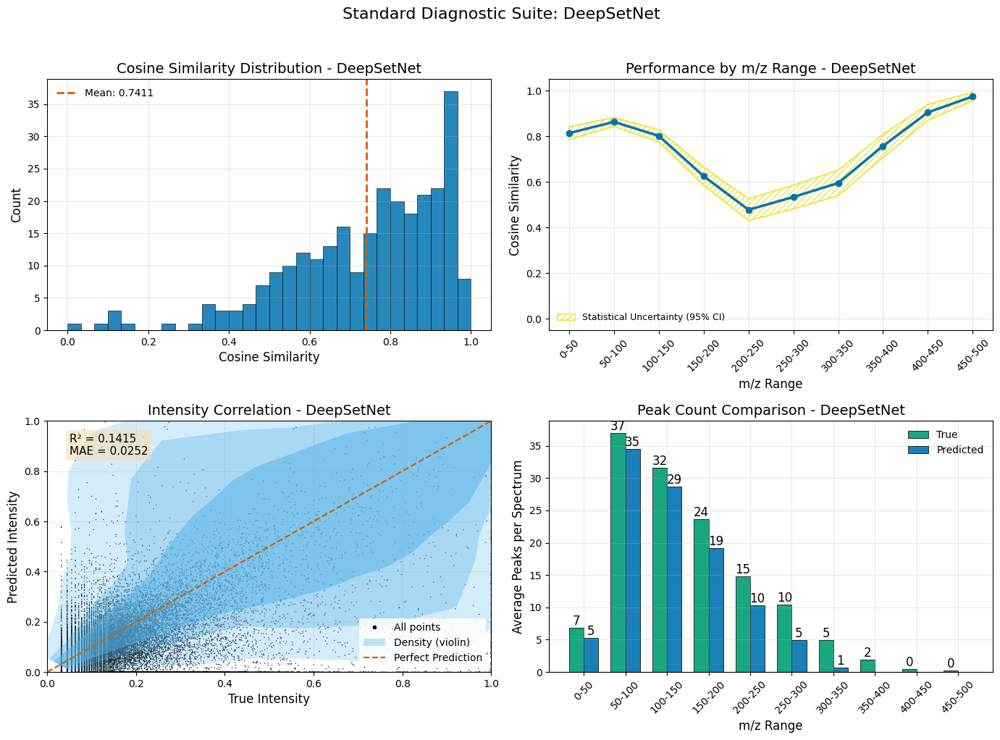


2. Random Spectrum Examples (2x2 Grid)

Selected random examples:
  1. Index 2: Cosine=0.0943, WDP=0.1189
  2. Index 169: Cosine=0.9695, WDP=1.2632
  3. Index 178: Cosine=0.5613, WDP=0.1722
  4. Index 194: Cosine=0.7474, WDP=0.3106


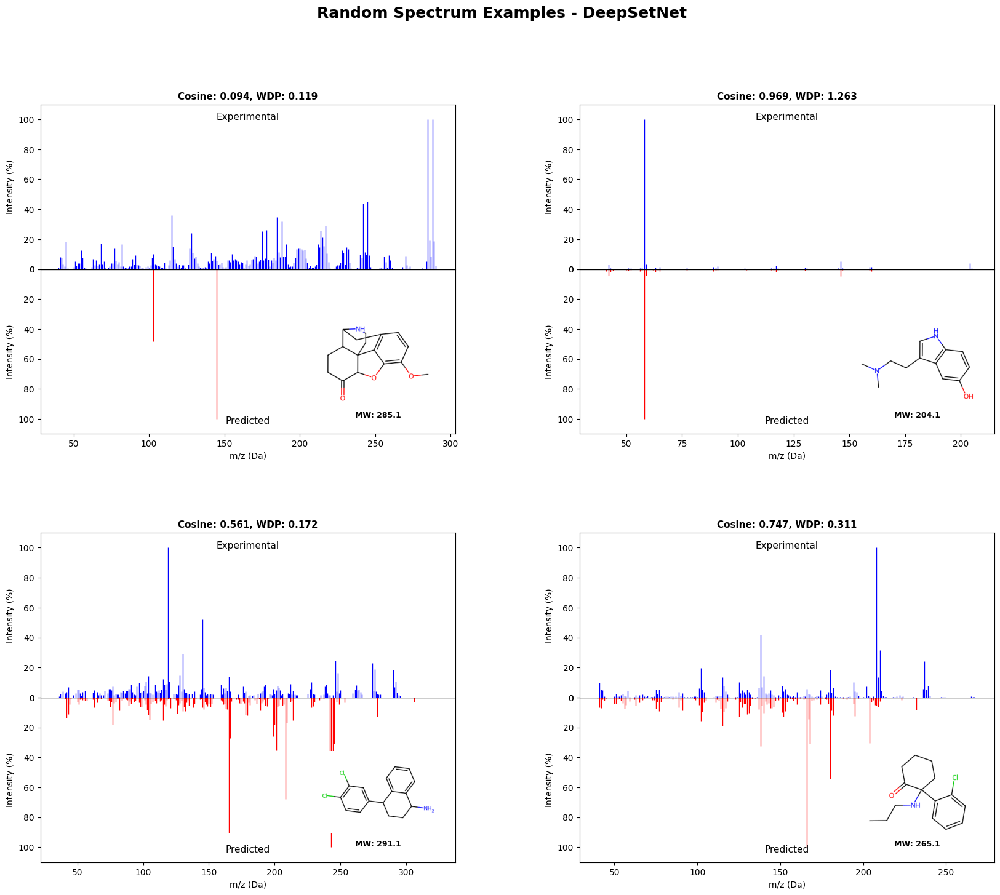


3. Deep Learning Training History


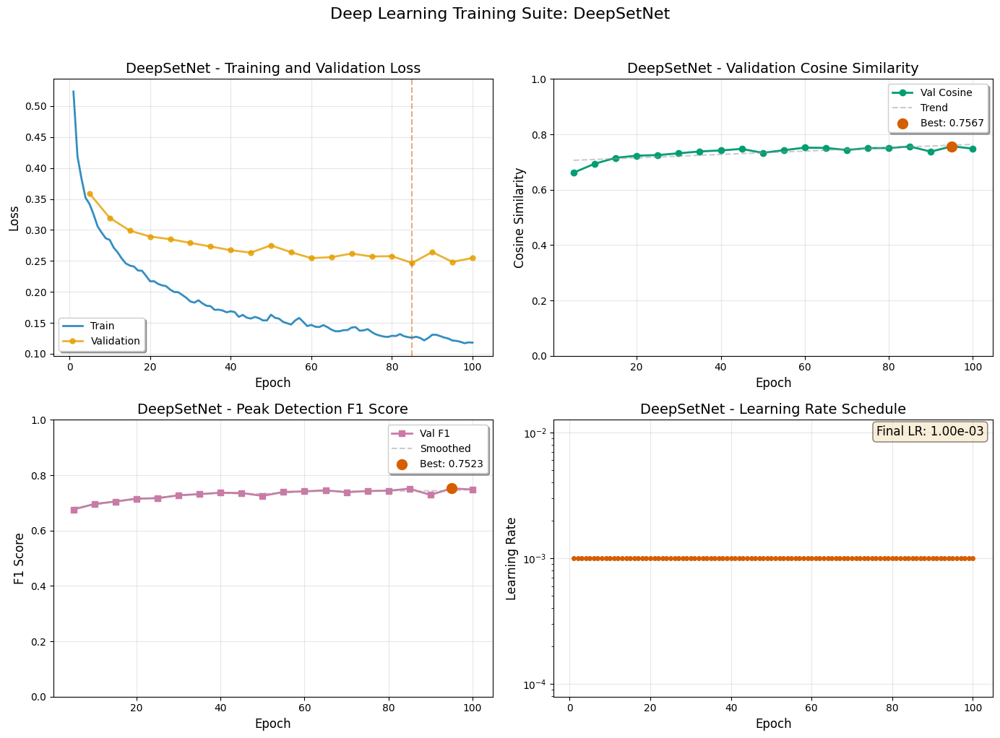


DeepSetNet evaluation complete!


In [14]:
class DeepSetNet(BaseModel):
    def __init__(self, input_dim: int, output_dim: int, config: Dict):
        super().__init__(input_dim, output_dim)
        
        encoder_dims = config['encoder_dims']
        decoder_dims = config['decoder_dims']
        aggregation = config['aggregation']
        
        # Encoder (φ network)
        encoder_layers = []
        dims = [input_dim] + encoder_dims
        for i in range(len(encoder_dims)):
            encoder_layers.extend([
                nn.Linear(dims[i], dims[i+1]),
                nn.BatchNorm1d(dims[i+1]),
                nn.ReLU(),
                nn.Dropout(0.1)
            ])
        self.encoder = nn.Sequential(*encoder_layers)
        
        # Aggregation function
        self.aggregation = aggregation
        
        # Decoder (ρ network)
        decoder_layers = []
        dims = [encoder_dims[-1]] + decoder_dims
        for i in range(len(decoder_dims)):
            decoder_layers.extend([
                nn.Linear(dims[i], dims[i+1]),
                nn.BatchNorm1d(dims[i+1]),
                nn.ReLU(),
                nn.Dropout(0.1)
            ])
        decoder_layers.append(nn.Linear(decoder_dims[-1], output_dim))
        decoder_layers.append(nn.ReLU())
        self.decoder = nn.Sequential(*decoder_layers)
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # Encode
        encoded = self.encoder(x)
        
        # Aggregate (permutation-invariant operation)
        if self.aggregation == 'mean':
            aggregated = encoded
        elif self.aggregation == 'max':
            aggregated = encoded
        elif self.aggregation == 'sum':
            aggregated = encoded
        else:
            aggregated = encoded  # Default to mean
        
        # Decode
        output = self.decoder(aggregated)
        
        return output

# Train and evaluate DeepSetNet with standard visualizations
if len(X_train) > 0:
    results_deepset = train_and_evaluate_model(DeepSetNet, 'DeepSetNet')

## 15. HybridNet Architecture

Blends self-attention and residual processing, then fuses via a small cross-attention step.

$$
\mathbf{h}=\phi(\mathrm{BN}(\mathbf{W}_p\mathbf{x})),\quad
\mathbf{h}_{att}=\mathrm{MHA}(\mathbf{h}),\quad
\mathbf{h}_{res}=\mathrm{ResBlocks}(\mathbf{h}),\\
\mathbf{h}_{\text{fuse}}=\mathrm{CrossAttn}(\mathbf{h}\mid \mathbf{h}_{res}),\quad
\hat{\mathbf{y}}=\mathrm{ReLU}(\mathbf{W}_o\mathbf{h}_{\text{fuse}}).
$$

```mermaid
flowchart LR
  X --> P["Proj"]
  P --> SA["Self-Attn"] --> N1["Norm"]
  P --> RB["Residual Stack"]
  N1 --> CA["Cross-Attn with RB"]
  RB --> CA
  CA --> O["Linear+ReLU → ŷ"]
```


TRAINING HYBRIDNET
Total parameters: 7,070,196

Training HybridNet...


Epoch 5/100: 100%|██████████| 34/34 [00:00<00:00, 68.91it/s, loss=0.2889, cos=0.2743]



HybridNet Performance:
  Cosine Similarity: 0.6721
  MSE: 0.0159, R²: -0.2323
  Peak Detection - Precision: 0.8396, Recall: 0.5301, F1: 0.6499
  Sparsity - True: 0.740, Pred: 0.835
  New best model saved! (Cosine: 0.6721)


Epoch 10/100: 100%|██████████| 34/34 [00:00<00:00, 66.54it/s, loss=0.2103, cos=0.2022]



HybridNet Performance:
  Cosine Similarity: 0.6966
  MSE: 0.0130, R²: -0.0927
  Peak Detection - Precision: 0.8611, Recall: 0.5312, F1: 0.6571
  Sparsity - True: 0.740, Pred: 0.838
  New best model saved! (Cosine: 0.6966)


Epoch 15/100: 100%|██████████| 34/34 [00:00<00:00, 65.91it/s, loss=0.2050, cos=0.1949]



HybridNet Performance:
  Cosine Similarity: 0.7108
  MSE: 0.0128, R²: -0.0836
  Peak Detection - Precision: 0.8451, Recall: 0.5932, F1: 0.6971
  Sparsity - True: 0.740, Pred: 0.816
  New best model saved! (Cosine: 0.7108)


Epoch 20/100: 100%|██████████| 34/34 [00:00<00:00, 146.14it/s, loss=0.1605, cos=0.1545]



HybridNet Performance:
  Cosine Similarity: 0.7178
  MSE: 0.0103, R²: 0.0502
  Peak Detection - Precision: 0.8824, Recall: 0.5457, F1: 0.6744
  Sparsity - True: 0.740, Pred: 0.838
  New best model saved! (Cosine: 0.7178)


Epoch 25/100: 100%|██████████| 34/34 [00:00<00:00, 137.09it/s, loss=0.1503, cos=0.1442]



HybridNet Performance:
  Cosine Similarity: 0.7242
  MSE: 0.0102, R²: 0.0427
  Peak Detection - Precision: 0.8538, Recall: 0.5908, F1: 0.6984
  Sparsity - True: 0.740, Pred: 0.819
  New best model saved! (Cosine: 0.7242)


Epoch 30/100: 100%|██████████| 34/34 [00:00<00:00, 70.64it/s, loss=0.1629, cos=0.1565]



HybridNet Performance:
  Cosine Similarity: 0.7316
  MSE: 0.0103, R²: 0.0380
  Peak Detection - Precision: 0.8477, Recall: 0.6075, F1: 0.7078
  Sparsity - True: 0.740, Pred: 0.813
  New best model saved! (Cosine: 0.7316)


Epoch 35/100: 100%|██████████| 34/34 [00:00<00:00, 68.61it/s, loss=0.1283, cos=0.1241]



HybridNet Performance:
  Cosine Similarity: 0.7347
  MSE: 0.0090, R²: 0.1136
  Peak Detection - Precision: 0.8724, Recall: 0.5748, F1: 0.6930
  Sparsity - True: 0.740, Pred: 0.828
  New best model saved! (Cosine: 0.7347)


Epoch 40/100: 100%|██████████| 34/34 [00:00<00:00, 70.58it/s, loss=0.1261, cos=0.1202]



HybridNet Performance:
  Cosine Similarity: 0.7399
  MSE: 0.0098, R²: 0.0532
  Peak Detection - Precision: 0.8459, Recall: 0.6273, F1: 0.7203
  Sparsity - True: 0.740, Pred: 0.806
  New best model saved! (Cosine: 0.7399)


Epoch 45/100: 100%|██████████| 34/34 [00:00<00:00, 69.41it/s, loss=0.1178, cos=0.1138]



HybridNet Performance:
  Cosine Similarity: 0.7366
  MSE: 0.0091, R²: 0.1068
  Peak Detection - Precision: 0.8650, Recall: 0.5984, F1: 0.7074
  Sparsity - True: 0.740, Pred: 0.820


Epoch 50/100: 100%|██████████| 34/34 [00:00<00:00, 69.65it/s, loss=0.1270, cos=0.1225]



HybridNet Performance:
  Cosine Similarity: 0.7382
  MSE: 0.0091, R²: 0.0980
  Peak Detection - Precision: 0.8509, Recall: 0.6245, F1: 0.7203
  Sparsity - True: 0.740, Pred: 0.809


Epoch 55/100: 100%|██████████| 34/34 [00:00<00:00, 68.72it/s, loss=0.1109, cos=0.1074]



HybridNet Performance:
  Cosine Similarity: 0.7451
  MSE: 0.0092, R²: 0.0902
  Peak Detection - Precision: 0.8472, Recall: 0.6322, F1: 0.7241
  Sparsity - True: 0.740, Pred: 0.805
  New best model saved! (Cosine: 0.7451)


Epoch 60/100: 100%|██████████| 34/34 [00:00<00:00, 145.67it/s, loss=0.1212, cos=0.1177]



HybridNet Performance:
  Cosine Similarity: 0.7439
  MSE: 0.0086, R²: 0.1284
  Peak Detection - Precision: 0.8444, Recall: 0.6424, F1: 0.7297
  Sparsity - True: 0.740, Pred: 0.802


Epoch 65/100: 100%|██████████| 34/34 [00:00<00:00, 145.97it/s, loss=0.1310, cos=0.1262]



HybridNet Performance:
  Cosine Similarity: 0.7489
  MSE: 0.0090, R²: 0.1067
  Peak Detection - Precision: 0.8285, Recall: 0.6604, F1: 0.7350
  Sparsity - True: 0.740, Pred: 0.792
  New best model saved! (Cosine: 0.7489)


Epoch 70/100: 100%|██████████| 34/34 [00:00<00:00, 69.46it/s, loss=0.0959, cos=0.0930]



HybridNet Performance:
  Cosine Similarity: 0.7492
  MSE: 0.0082, R²: 0.1490
  Peak Detection - Precision: 0.8449, Recall: 0.6400, F1: 0.7283
  Sparsity - True: 0.740, Pred: 0.803
  New best model saved! (Cosine: 0.7492)


Epoch 75/100: 100%|██████████| 34/34 [00:00<00:00, 68.40it/s, loss=0.0982, cos=0.0953]



HybridNet Performance:
  Cosine Similarity: 0.7471
  MSE: 0.0082, R²: 0.1481
  Peak Detection - Precision: 0.8554, Recall: 0.6334, F1: 0.7279
  Sparsity - True: 0.740, Pred: 0.807


Epoch 80/100: 100%|██████████| 34/34 [00:00<00:00, 69.31it/s, loss=0.0904, cos=0.0878]



HybridNet Performance:
  Cosine Similarity: 0.7438
  MSE: 0.0082, R²: 0.1529
  Peak Detection - Precision: 0.8443, Recall: 0.6380, F1: 0.7268
  Sparsity - True: 0.740, Pred: 0.803


Epoch 85/100: 100%|██████████| 34/34 [00:00<00:00, 71.45it/s, loss=0.1201, cos=0.1166]



HybridNet Performance:
  Cosine Similarity: 0.7525
  MSE: 0.0082, R²: 0.1431
  Peak Detection - Precision: 0.8296, Recall: 0.6614, F1: 0.7360
  Sparsity - True: 0.740, Pred: 0.792
  New best model saved! (Cosine: 0.7525)


Epoch 90/100: 100%|██████████| 34/34 [00:00<00:00, 67.88it/s, loss=0.0805, cos=0.0776]



HybridNet Performance:
  Cosine Similarity: 0.7534
  MSE: 0.0083, R²: 0.1466
  Peak Detection - Precision: 0.8403, Recall: 0.6571, F1: 0.7375
  Sparsity - True: 0.740, Pred: 0.796
  New best model saved! (Cosine: 0.7534)


Epoch 95/100: 100%|██████████| 34/34 [00:00<00:00, 65.84it/s, loss=0.1038, cos=0.0969]



HybridNet Performance:
  Cosine Similarity: 0.7521
  MSE: 0.0082, R²: 0.1463
  Peak Detection - Precision: 0.8403, Recall: 0.6474, F1: 0.7314
  Sparsity - True: 0.740, Pred: 0.799


Epoch 100/100: 100%|██████████| 34/34 [00:00<00:00, 70.34it/s, loss=0.0946, cos=0.0910]



HybridNet Performance:
  Cosine Similarity: 0.7543
  MSE: 0.0081, R²: 0.1558
  Peak Detection - Precision: 0.8438, Recall: 0.6557, F1: 0.7379
  Sparsity - True: 0.740, Pred: 0.798
  New best model saved! (Cosine: 0.7543)

Training complete. Best validation cosine: 0.7543

HybridNet Performance:
  Cosine Similarity: 0.7411
  MSE: 0.0063, R²: 0.1646
  Peak Detection - Precision: 0.8504, Recall: 0.6562, F1: 0.7408
  Sparsity - True: 0.736, Pred: 0.797

------------------------------------------------------------
GENERATING STANDARD VISUALIZATIONS
------------------------------------------------------------

1. Standard 2x2 Diagnostic Plots


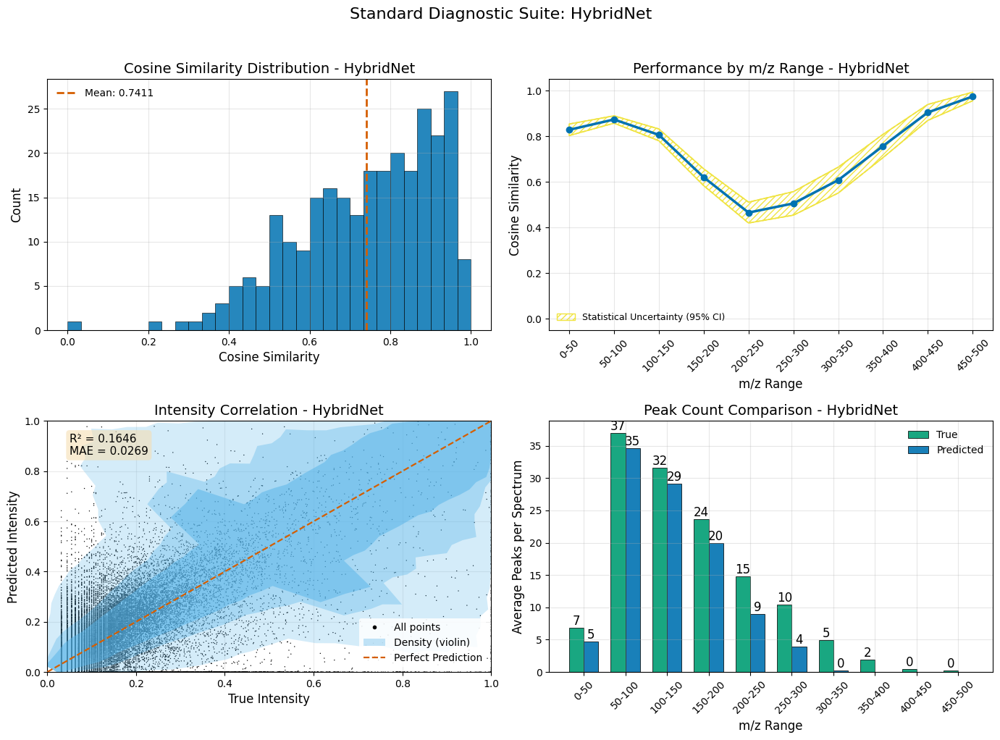


2. Random Spectrum Examples (2x2 Grid)

Selected random examples:
  1. Index 22: Cosine=0.7812, WDP=0.5953
  2. Index 86: Cosine=0.8696, WDP=0.9576
  3. Index 248: Cosine=0.9037, WDP=0.8912
  4. Index 202: Cosine=0.6558, WDP=0.3956


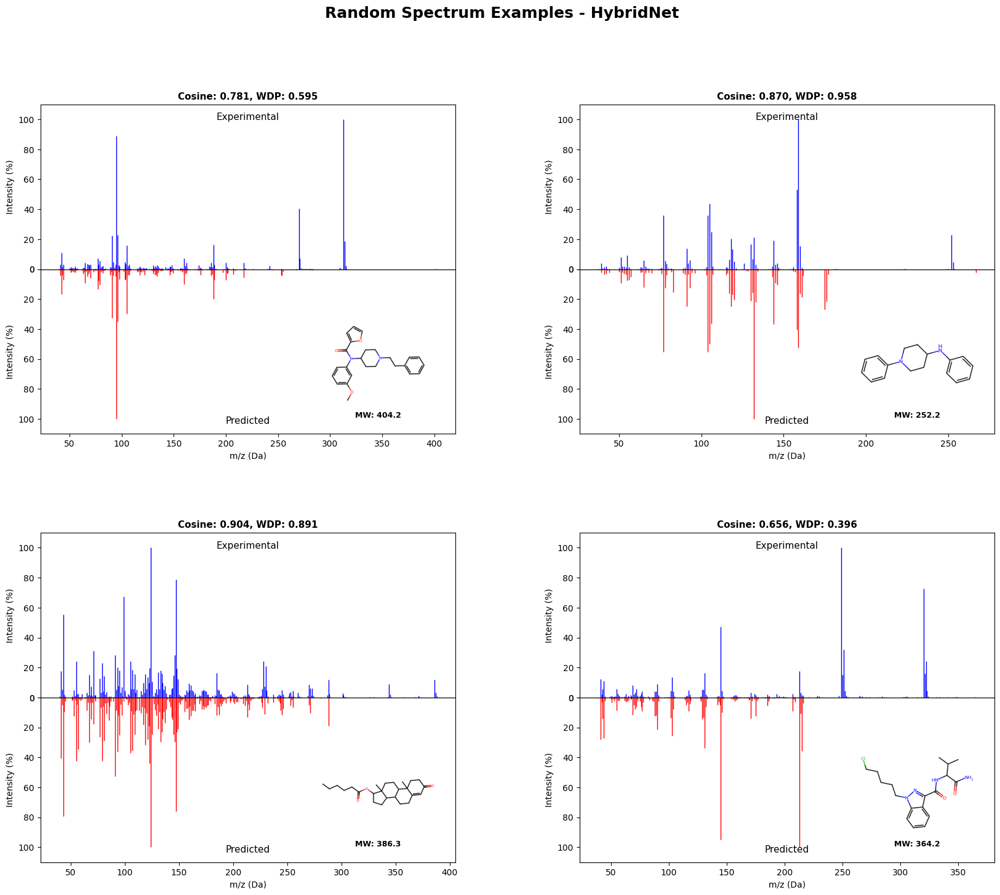


3. Deep Learning Training History


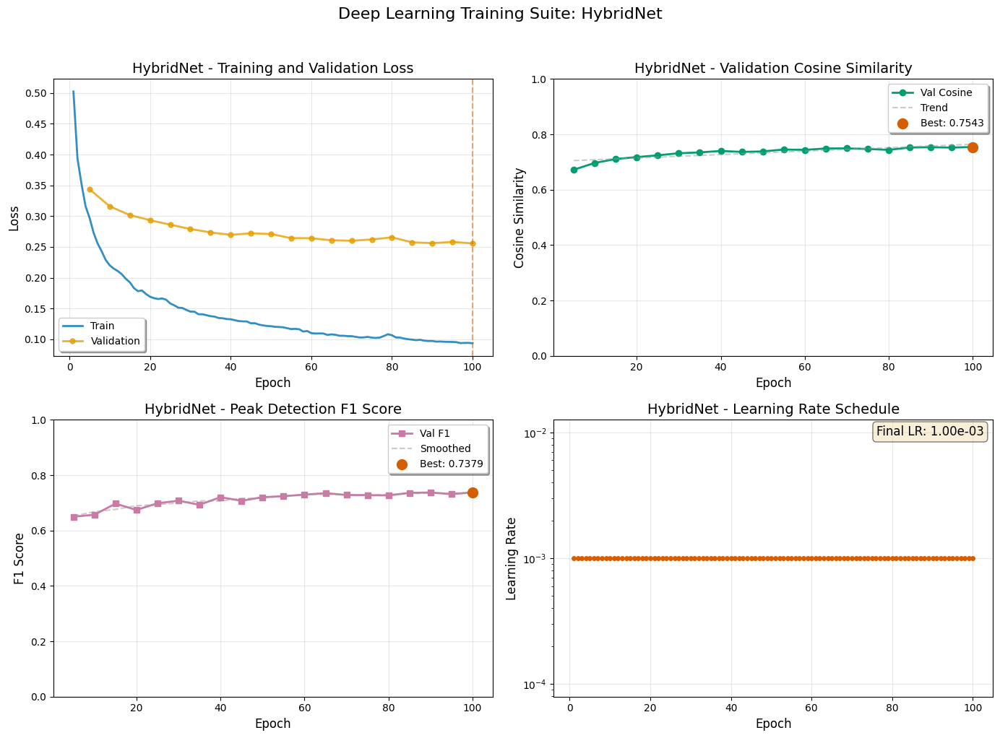


HybridNet evaluation complete!


In [15]:
class HybridNet(BaseModel):
    def __init__(self, input_dim: int, output_dim: int, config: Dict):
        super().__init__(input_dim, output_dim)
        
        hidden_dim = config['hidden_dim']
        num_heads = config['num_heads']
        num_residual_blocks = config['num_residual_blocks']
        
        # Initial projection
        self.input_proj = nn.Linear(input_dim, hidden_dim)
        self.input_bn = nn.BatchNorm1d(hidden_dim)
        
        # Attention layer
        self.attention = nn.MultiheadAttention(
            hidden_dim, num_heads, dropout=0.1, batch_first=True
        )
        self.attn_norm = nn.LayerNorm(hidden_dim)
        
        # Residual blocks
        self.residual_blocks = nn.ModuleList([
            ResidualBlock(hidden_dim, 0.1) for _ in range(num_residual_blocks)
        ])
        
        # Cross-attention fusion
        self.cross_attention = nn.MultiheadAttention(
            hidden_dim, num_heads // 2, dropout=0.1, batch_first=True
        )
        self.cross_norm = nn.LayerNorm(hidden_dim)
        
        # Output projection
        self.output_proj = nn.Linear(hidden_dim, output_dim)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # Initial projection
        x = self.input_proj(x)
        x = self.input_bn(x)
        x = F.relu(x)
        
        # Self-attention
        x_seq = x.unsqueeze(1)
        attn_out, _ = self.attention(x_seq, x_seq, x_seq)
        x = self.attn_norm(x_seq + attn_out).squeeze(1)
        
        # Residual processing
        residual_out = x
        for block in self.residual_blocks:
            residual_out = block(residual_out)
        
        # Cross-attention fusion
        x_seq = x.unsqueeze(1)
        residual_seq = residual_out.unsqueeze(1)
        cross_out, _ = self.cross_attention(x_seq, residual_seq, residual_seq)
        x = self.cross_norm(x_seq + cross_out).squeeze(1)
        
        # Output
        x = self.output_proj(x)
        x = F.relu(x)
        
        return x

# Train and evaluate HybridNet with standard visualizations
if len(X_train) > 0:
    results_hybrid = train_and_evaluate_model(HybridNet, 'HybridNet')

## 16. MultiHeadAttentionNet Architecture

Deeper Transformer-style stack: $L$ layers of MHA + FFN with residual connections and layer norms.

Layer $\ell$:
$$
\mathbf{h}^{(\ell+1)}=
\mathrm{LN}\Big(\mathbf{h}^{(\ell)}+\mathrm{MHA}(\mathbf{h}^{(\ell)})\Big)
\;\xrightarrow{\mathrm{FFN+Res}}\;
\mathrm{LN}\Big(\mathbf{h}^{(\ell+1)}+\mathrm{FFN}(\mathbf{h}^{(\ell+1)})\Big).
$$

Benefits: stronger channel mixing and nonlinearity; costs: higher compute.

```mermaid
flowchart TD
  X["Input d"] --> P["Proj d→h"]
  P --> L1["MHA + FFN + LN"]
  L1 --> L2["MHA + FFN + LN"]
  L2 --> L3["… (×L)"]
  L3 --> O["Linear → ReLU → ŷ"]
```


TRAINING MULTIHEADATTENTIONNET
Total parameters: 13,369,332

Training MultiHeadAttentionNet...


Epoch 5/100: 100%|██████████| 34/34 [00:00<00:00, 56.47it/s, loss=0.3728, cos=0.3566]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.6197
  MSE: 0.0174, R²: -0.2989
  Peak Detection - Precision: 0.8332, Recall: 0.4568, F1: 0.5901
  Sparsity - True: 0.740, Pred: 0.856
  New best model saved! (Cosine: 0.6197)


Epoch 10/100: 100%|██████████| 34/34 [00:00<00:00, 53.03it/s, loss=0.3190, cos=0.3073]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.6452
  MSE: 0.0151, R²: -0.2212
  Peak Detection - Precision: 0.8397, Recall: 0.4779, F1: 0.6091
  Sparsity - True: 0.740, Pred: 0.851
  New best model saved! (Cosine: 0.6452)


Epoch 15/100: 100%|██████████| 34/34 [00:00<00:00, 54.55it/s, loss=0.2673, cos=0.2586]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.6470
  MSE: 0.0124, R²: -0.0559
  Peak Detection - Precision: 0.8737, Recall: 0.4551, F1: 0.5984
  Sparsity - True: 0.740, Pred: 0.864
  New best model saved! (Cosine: 0.6470)


Epoch 20/100: 100%|██████████| 34/34 [00:00<00:00, 52.93it/s, loss=0.2540, cos=0.2464]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.6543
  MSE: 0.0110, R²: 0.0109
  Peak Detection - Precision: 0.8793, Recall: 0.4523, F1: 0.5974
  Sparsity - True: 0.740, Pred: 0.866
  New best model saved! (Cosine: 0.6543)


Epoch 25/100: 100%|██████████| 34/34 [00:00<00:00, 113.28it/s, loss=0.2410, cos=0.2335]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.6682
  MSE: 0.0117, R²: -0.0382
  Peak Detection - Precision: 0.8408, Recall: 0.5071, F1: 0.6326
  Sparsity - True: 0.740, Pred: 0.842
  New best model saved! (Cosine: 0.6682)


Epoch 30/100: 100%|██████████| 34/34 [00:00<00:00, 55.43it/s, loss=0.2214, cos=0.2150]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.6806
  MSE: 0.0110, R²: -0.0052
  Peak Detection - Precision: 0.8405, Recall: 0.5265, F1: 0.6474
  Sparsity - True: 0.740, Pred: 0.836
  New best model saved! (Cosine: 0.6806)


Epoch 35/100: 100%|██████████| 34/34 [00:00<00:00, 52.92it/s, loss=0.2093, cos=0.2037]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.6757
  MSE: 0.0103, R²: 0.0409
  Peak Detection - Precision: 0.8521, Recall: 0.5173, F1: 0.6438
  Sparsity - True: 0.740, Pred: 0.842


Epoch 40/100: 100%|██████████| 34/34 [00:00<00:00, 53.41it/s, loss=0.2316, cos=0.2248]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.6790
  MSE: 0.0099, R²: 0.0557
  Peak Detection - Precision: 0.8601, Recall: 0.5163, F1: 0.6453
  Sparsity - True: 0.740, Pred: 0.844


Epoch 45/100: 100%|██████████| 34/34 [00:00<00:00, 53.43it/s, loss=0.2225, cos=0.2171]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.6810
  MSE: 0.0096, R²: 0.0736
  Peak Detection - Precision: 0.8632, Recall: 0.5155, F1: 0.6455
  Sparsity - True: 0.740, Pred: 0.845
  New best model saved! (Cosine: 0.6810)


Epoch 50/100: 100%|██████████| 34/34 [00:00<00:00, 54.29it/s, loss=0.1813, cos=0.1759]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.6806
  MSE: 0.0100, R²: 0.0580
  Peak Detection - Precision: 0.8489, Recall: 0.5347, F1: 0.6561
  Sparsity - True: 0.740, Pred: 0.836


Epoch 55/100: 100%|██████████| 34/34 [00:00<00:00, 53.35it/s, loss=0.2222, cos=0.2158]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.6842
  MSE: 0.0099, R²: 0.0560
  Peak Detection - Precision: 0.8528, Recall: 0.5299, F1: 0.6536
  Sparsity - True: 0.740, Pred: 0.838
  New best model saved! (Cosine: 0.6842)


Epoch 60/100: 100%|██████████| 34/34 [00:00<00:00, 54.36it/s, loss=0.2244, cos=0.2186]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.6791
  MSE: 0.0097, R²: 0.0667
  Peak Detection - Precision: 0.8342, Recall: 0.5413, F1: 0.6566
  Sparsity - True: 0.740, Pred: 0.831


Epoch 65/100: 100%|██████████| 34/34 [00:00<00:00, 52.79it/s, loss=0.1873, cos=0.1827]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.6858
  MSE: 0.0095, R²: 0.0838
  Peak Detection - Precision: 0.8597, Recall: 0.5289, F1: 0.6549
  Sparsity - True: 0.740, Pred: 0.840
  New best model saved! (Cosine: 0.6858)


Epoch 70/100: 100%|██████████| 34/34 [00:00<00:00, 50.86it/s, loss=0.1896, cos=0.1855]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.6947
  MSE: 0.0088, R²: 0.1157
  Peak Detection - Precision: 0.8546, Recall: 0.5488, F1: 0.6684
  Sparsity - True: 0.740, Pred: 0.834
  New best model saved! (Cosine: 0.6947)


Epoch 75/100: 100%|██████████| 34/34 [00:00<00:00, 51.37it/s, loss=0.1759, cos=0.1716]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.6960
  MSE: 0.0088, R²: 0.1141
  Peak Detection - Precision: 0.8435, Recall: 0.5600, F1: 0.6731
  Sparsity - True: 0.740, Pred: 0.828
  New best model saved! (Cosine: 0.6960)


Epoch 80/100: 100%|██████████| 34/34 [00:00<00:00, 99.89it/s, loss=0.1680, cos=0.1642] 



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.6933
  MSE: 0.0088, R²: 0.1149
  Peak Detection - Precision: 0.8601, Recall: 0.5437, F1: 0.6662
  Sparsity - True: 0.740, Pred: 0.836


Epoch 85/100: 100%|██████████| 34/34 [00:00<00:00, 101.64it/s, loss=0.1926, cos=0.1872]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.6994
  MSE: 0.0088, R²: 0.1138
  Peak Detection - Precision: 0.8441, Recall: 0.5623, F1: 0.6750
  Sparsity - True: 0.740, Pred: 0.827
  New best model saved! (Cosine: 0.6994)


Epoch 90/100: 100%|██████████| 34/34 [00:00<00:00, 52.27it/s, loss=0.1566, cos=0.1524]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.7054
  MSE: 0.0086, R²: 0.1256
  Peak Detection - Precision: 0.8416, Recall: 0.5732, F1: 0.6819
  Sparsity - True: 0.740, Pred: 0.824
  New best model saved! (Cosine: 0.7054)


Epoch 95/100: 100%|██████████| 34/34 [00:00<00:00, 52.47it/s, loss=0.1696, cos=0.1652]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.7045
  MSE: 0.0086, R²: 0.1268
  Peak Detection - Precision: 0.8481, Recall: 0.5690, F1: 0.6811
  Sparsity - True: 0.740, Pred: 0.826


Epoch 100/100: 100%|██████████| 34/34 [00:00<00:00, 53.24it/s, loss=0.1658, cos=0.1621]



MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.7062
  MSE: 0.0084, R²: 0.1345
  Peak Detection - Precision: 0.8505, Recall: 0.5697, F1: 0.6823
  Sparsity - True: 0.740, Pred: 0.827
  New best model saved! (Cosine: 0.7062)

Training complete. Best validation cosine: 0.7062

MultiHeadAttentionNet Performance:
  Cosine Similarity: 0.6992
  MSE: 0.0066, R²: 0.1407
  Peak Detection - Precision: 0.8522, Recall: 0.5700, F1: 0.6831
  Sparsity - True: 0.736, Pred: 0.825

------------------------------------------------------------
GENERATING STANDARD VISUALIZATIONS
------------------------------------------------------------

1. Standard 2x2 Diagnostic Plots


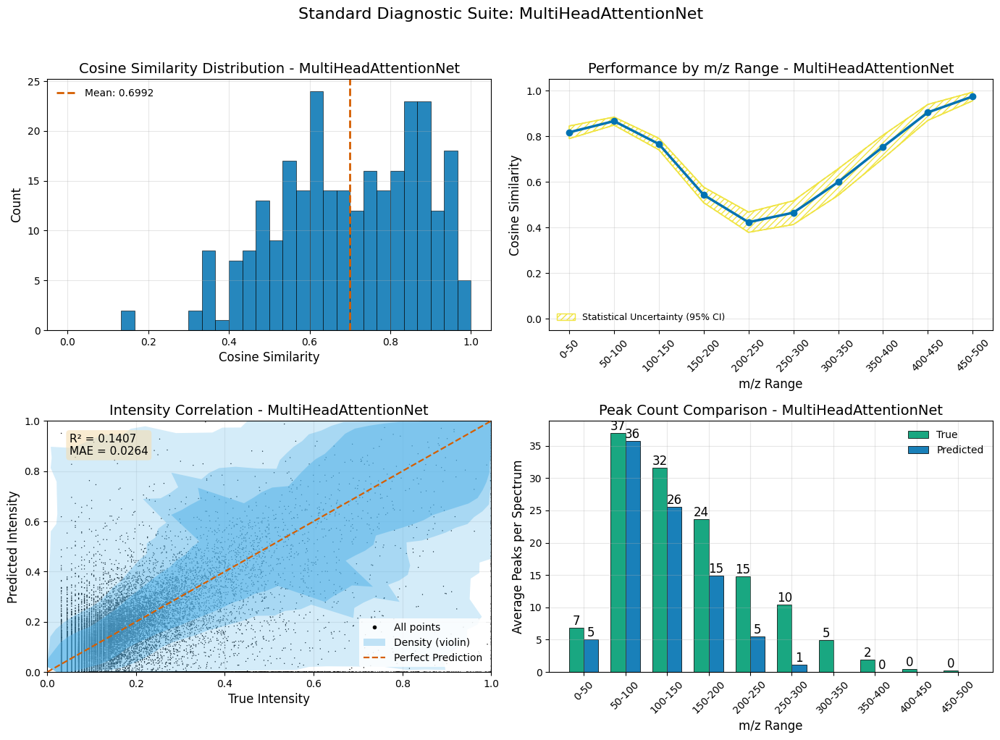


2. Random Spectrum Examples (2x2 Grid)

Selected random examples:
  1. Index 34: Cosine=0.9490, WDP=1.2418
  2. Index 47: Cosine=0.7219, WDP=0.3126
  3. Index 33: Cosine=0.8599, WDP=0.9166
  4. Index 166: Cosine=0.7769, WDP=0.6155


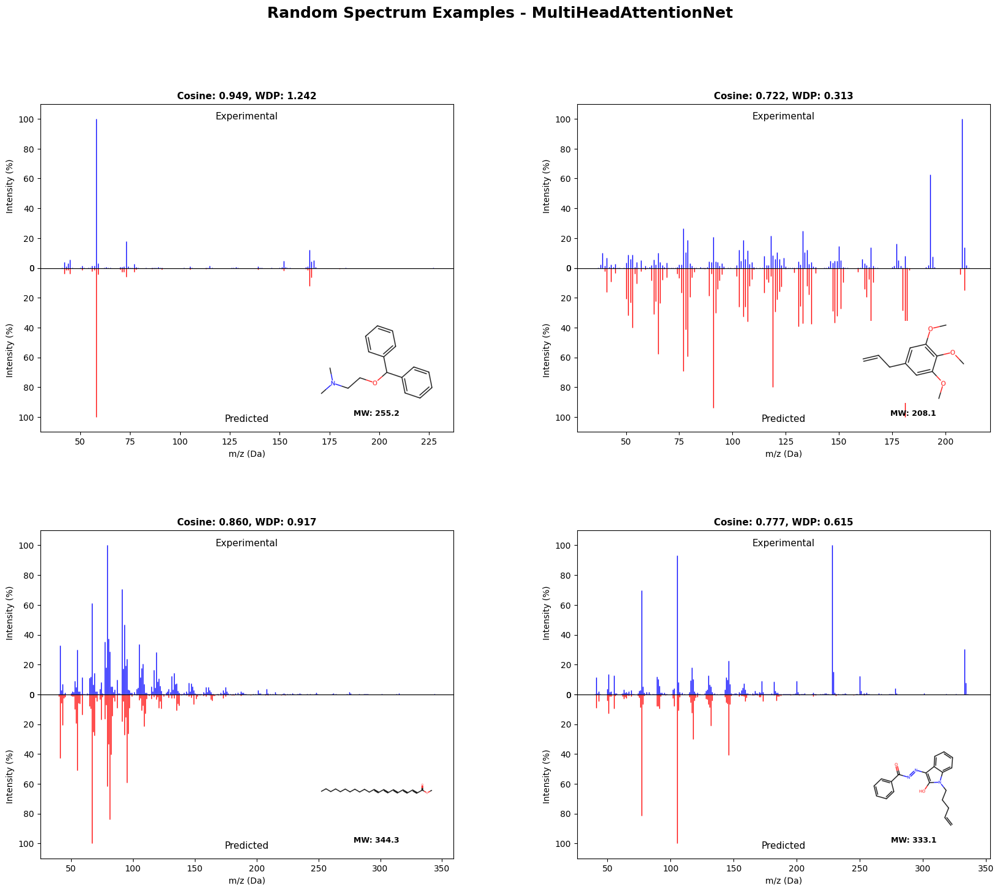


3. Deep Learning Training History


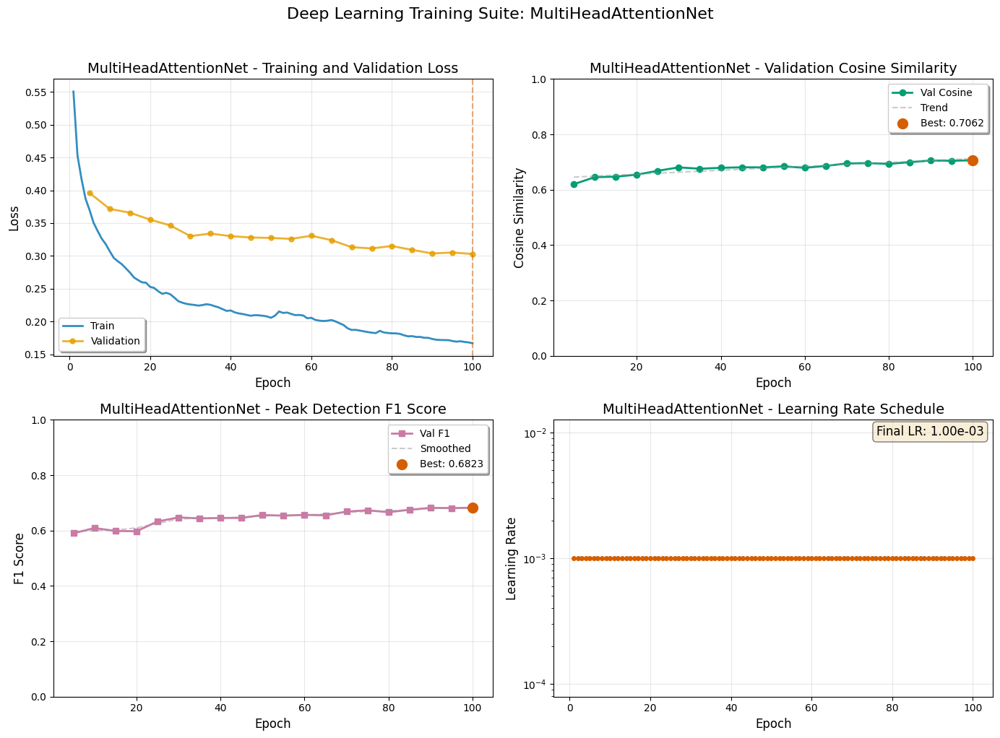


MultiHeadAttentionNet evaluation complete!


In [16]:
class MultiHeadAttentionNet(BaseModel):
    def __init__(self, input_dim: int, output_dim: int, config: Dict):
        super().__init__(input_dim, output_dim)
        
        hidden_dim = config['hidden_dim']
        num_heads = config['num_heads']
        num_layers = config['num_layers']
        
        # Initial projection
        self.input_proj = nn.Linear(input_dim, hidden_dim)
        self.input_bn = nn.BatchNorm1d(hidden_dim)
        
        # Multiple attention layers
        self.attention_layers = nn.ModuleList()
        self.norms = nn.ModuleList()
        self.ffns = nn.ModuleList()
        self.ffn_norms = nn.ModuleList()
        
        for _ in range(num_layers):
            self.attention_layers.append(
                nn.MultiheadAttention(hidden_dim, num_heads, dropout=0.1, batch_first=True)
            )
            self.norms.append(nn.LayerNorm(hidden_dim))
            
            self.ffns.append(
                nn.Sequential(
                    nn.Linear(hidden_dim, hidden_dim * 4),
                    nn.ReLU(),
                    nn.Dropout(0.1),
                    nn.Linear(hidden_dim * 4, hidden_dim)
                )
            )
            self.ffn_norms.append(nn.LayerNorm(hidden_dim))
        
        # Output projection
        self.output_proj = nn.Linear(hidden_dim, output_dim)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # Initial projection
        x = self.input_proj(x)
        x = self.input_bn(x)
        x = F.relu(x)
        
        x = x.unsqueeze(1)  # Add sequence dimension
        
        # Apply attention layers
        for attn, norm, ffn, ffn_norm in zip(self.attention_layers, self.norms, self.ffns, self.ffn_norms):
            # Attention
            attn_out, _ = attn(x, x, x)
            x = norm(x + attn_out)
            
            # FFN
            ffn_out = ffn(x)
            x = ffn_norm(x + ffn_out)
        
        x = x.squeeze(1)  # Remove sequence dimension
        
        # Output
        x = self.output_proj(x)
        x = F.relu(x)
        
        return x

# Train and evaluate MultiHeadAttentionNet with standard visualizations
if len(X_train) > 0:
    results_multihead = train_and_evaluate_model(MultiHeadAttentionNet, 'MultiHeadAttentionNet')

## 17. GatedNet Architecture

Parallel main and gate paths; gates modulate feature flow multiplicatively.

$$
\mathbf{m}=\mathrm{MainMLP}(\mathbf{x}),\quad
\mathbf{g}=\sigma(\mathbf{W}_g\phi(\mathbf{x})),\quad
\mathbf{h}=\mathbf{m}\odot \mathbf{g},\quad
\hat{\mathbf{y}}=\mathrm{ReLU}(\mathbf{W}_o\mathbf{h}).
$$

Interpretation: soft feature selection; helps with sparsity by suppressing spurious activations.

```mermaid
flowchart LR
  X["Input x"] --> M["Main MLP"]
  X --> G["Gate MLP → σ"]
  M --> Mul["⊙"]
  G --> Mul
  Mul --> O["Linear → ReLU → ŷ"]
```


TRAINING GATEDNET
Total parameters: 10,052,596

Training GatedNet...


Epoch 5/100: 100%|██████████| 34/34 [00:00<00:00, 190.57it/s, loss=0.2466, cos=0.2412]



GatedNet Performance:
  Cosine Similarity: 0.7251
  MSE: 0.0080, R²: 0.1635
  Peak Detection - Precision: 0.8092, Recall: 0.6881, F1: 0.7438
  Sparsity - True: 0.740, Pred: 0.781
  New best model saved! (Cosine: 0.7251)


Epoch 10/100: 100%|██████████| 34/34 [00:00<00:00, 179.13it/s, loss=0.1491, cos=0.1447]



GatedNet Performance:
  Cosine Similarity: 0.7455
  MSE: 0.0075, R²: 0.1932
  Peak Detection - Precision: 0.8321, Recall: 0.6734, F1: 0.7444
  Sparsity - True: 0.740, Pred: 0.792
  New best model saved! (Cosine: 0.7455)


Epoch 15/100: 100%|██████████| 34/34 [00:00<00:00, 88.09it/s, loss=0.1386, cos=0.1346]



GatedNet Performance:
  Cosine Similarity: 0.7484
  MSE: 0.0075, R²: 0.2020
  Peak Detection - Precision: 0.8413, Recall: 0.6652, F1: 0.7429
  Sparsity - True: 0.740, Pred: 0.796
  New best model saved! (Cosine: 0.7484)


Epoch 20/100: 100%|██████████| 34/34 [00:00<00:00, 90.87it/s, loss=0.1120, cos=0.1088]



GatedNet Performance:
  Cosine Similarity: 0.7541
  MSE: 0.0073, R²: 0.2105
  Peak Detection - Precision: 0.8436, Recall: 0.6653, F1: 0.7440
  Sparsity - True: 0.740, Pred: 0.797
  New best model saved! (Cosine: 0.7541)


Epoch 25/100: 100%|██████████| 34/34 [00:00<00:00, 92.83it/s, loss=0.1117, cos=0.1087]



GatedNet Performance:
  Cosine Similarity: 0.7565
  MSE: 0.0072, R²: 0.2149
  Peak Detection - Precision: 0.8455, Recall: 0.6696, F1: 0.7474
  Sparsity - True: 0.740, Pred: 0.796
  New best model saved! (Cosine: 0.7565)


Epoch 30/100: 100%|██████████| 34/34 [00:00<00:00, 88.50it/s, loss=0.0856, cos=0.0831]



GatedNet Performance:
  Cosine Similarity: 0.7564
  MSE: 0.0072, R²: 0.2203
  Peak Detection - Precision: 0.8479, Recall: 0.6653, F1: 0.7456
  Sparsity - True: 0.740, Pred: 0.798


Epoch 35/100: 100%|██████████| 34/34 [00:00<00:00, 91.69it/s, loss=0.0701, cos=0.0679]



GatedNet Performance:
  Cosine Similarity: 0.7560
  MSE: 0.0072, R²: 0.2139
  Peak Detection - Precision: 0.8432, Recall: 0.6741, F1: 0.7492
  Sparsity - True: 0.740, Pred: 0.794


Epoch 40/100: 100%|██████████| 34/34 [00:00<00:00, 95.38it/s, loss=0.0771, cos=0.0747]



GatedNet Performance:
  Cosine Similarity: 0.7626
  MSE: 0.0071, R²: 0.2214
  Peak Detection - Precision: 0.8457, Recall: 0.6779, F1: 0.7525
  Sparsity - True: 0.740, Pred: 0.793
  New best model saved! (Cosine: 0.7626)


Epoch 45/100: 100%|██████████| 34/34 [00:00<00:00, 92.43it/s, loss=0.0749, cos=0.0728]



GatedNet Performance:
  Cosine Similarity: 0.7609
  MSE: 0.0071, R²: 0.2206
  Peak Detection - Precision: 0.8496, Recall: 0.6737, F1: 0.7515
  Sparsity - True: 0.740, Pred: 0.796


Epoch 50/100: 100%|██████████| 34/34 [00:00<00:00, 92.14it/s, loss=0.0829, cos=0.0806]



GatedNet Performance:
  Cosine Similarity: 0.7643
  MSE: 0.0070, R²: 0.2241
  Peak Detection - Precision: 0.8456, Recall: 0.6817, F1: 0.7549
  Sparsity - True: 0.740, Pred: 0.792
  New best model saved! (Cosine: 0.7643)


Epoch 55/100: 100%|██████████| 34/34 [00:00<00:00, 98.74it/s, loss=0.0669, cos=0.0648] 



GatedNet Performance:
  Cosine Similarity: 0.7647
  MSE: 0.0072, R²: 0.2166
  Peak Detection - Precision: 0.8436, Recall: 0.6902, F1: 0.7592
  Sparsity - True: 0.740, Pred: 0.789
  New best model saved! (Cosine: 0.7647)


Epoch 60/100: 100%|██████████| 34/34 [00:00<00:00, 92.77it/s, loss=0.0895, cos=0.0872]



GatedNet Performance:
  Cosine Similarity: 0.7634
  MSE: 0.0071, R²: 0.2196
  Peak Detection - Precision: 0.8503, Recall: 0.6757, F1: 0.7530
  Sparsity - True: 0.740, Pred: 0.795


Epoch 65/100: 100%|██████████| 34/34 [00:00<00:00, 92.20it/s, loss=0.0628, cos=0.0609]



GatedNet Performance:
  Cosine Similarity: 0.7623
  MSE: 0.0070, R²: 0.2233
  Peak Detection - Precision: 0.8496, Recall: 0.6808, F1: 0.7559
  Sparsity - True: 0.740, Pred: 0.794


Epoch 70/100: 100%|██████████| 34/34 [00:00<00:00, 92.73it/s, loss=0.0613, cos=0.0594]



GatedNet Performance:
  Cosine Similarity: 0.7647
  MSE: 0.0070, R²: 0.2236
  Peak Detection - Precision: 0.8502, Recall: 0.6821, F1: 0.7569
  Sparsity - True: 0.740, Pred: 0.794
  New best model saved! (Cosine: 0.7647)


Epoch 75/100: 100%|██████████| 34/34 [00:00<00:00, 92.32it/s, loss=0.0626, cos=0.0603]



GatedNet Performance:
  Cosine Similarity: 0.7641
  MSE: 0.0071, R²: 0.2195
  Peak Detection - Precision: 0.8491, Recall: 0.6759, F1: 0.7527
  Sparsity - True: 0.740, Pred: 0.795


Epoch 80/100: 100%|██████████| 34/34 [00:00<00:00, 91.13it/s, loss=0.0602, cos=0.0584]



GatedNet Performance:
  Cosine Similarity: 0.7606
  MSE: 0.0071, R²: 0.2170
  Peak Detection - Precision: 0.8427, Recall: 0.6816, F1: 0.7536
  Sparsity - True: 0.740, Pred: 0.792


Epoch 85/100: 100%|██████████| 34/34 [00:00<00:00, 90.66it/s, loss=0.0796, cos=0.0774]



GatedNet Performance:
  Cosine Similarity: 0.7632
  MSE: 0.0071, R²: 0.2159
  Peak Detection - Precision: 0.8461, Recall: 0.6808, F1: 0.7545
  Sparsity - True: 0.740, Pred: 0.793


Epoch 90/100: 100%|██████████| 34/34 [00:00<00:00, 92.32it/s, loss=0.0546, cos=0.0528]



GatedNet Performance:
  Cosine Similarity: 0.7671
  MSE: 0.0069, R²: 0.2304
  Peak Detection - Precision: 0.8480, Recall: 0.6902, F1: 0.7610
  Sparsity - True: 0.740, Pred: 0.791
  New best model saved! (Cosine: 0.7671)


Epoch 95/100: 100%|██████████| 34/34 [00:00<00:00, 89.76it/s, loss=0.0584, cos=0.0567]



GatedNet Performance:
  Cosine Similarity: 0.7673
  MSE: 0.0069, R²: 0.2276
  Peak Detection - Precision: 0.8478, Recall: 0.6882, F1: 0.7597
  Sparsity - True: 0.740, Pred: 0.792
  New best model saved! (Cosine: 0.7673)


Epoch 100/100: 100%|██████████| 34/34 [00:00<00:00, 93.24it/s, loss=0.0527, cos=0.0510]



GatedNet Performance:
  Cosine Similarity: 0.7668
  MSE: 0.0070, R²: 0.2271
  Peak Detection - Precision: 0.8442, Recall: 0.6939, F1: 0.7617
  Sparsity - True: 0.740, Pred: 0.789

Training complete. Best validation cosine: 0.7673

GatedNet Performance:
  Cosine Similarity: 0.7587
  MSE: 0.0051, R²: 0.2522
  Peak Detection - Precision: 0.8611, Recall: 0.6943, F1: 0.7687
  Sparsity - True: 0.736, Pred: 0.791

------------------------------------------------------------
GENERATING STANDARD VISUALIZATIONS
------------------------------------------------------------

1. Standard 2x2 Diagnostic Plots


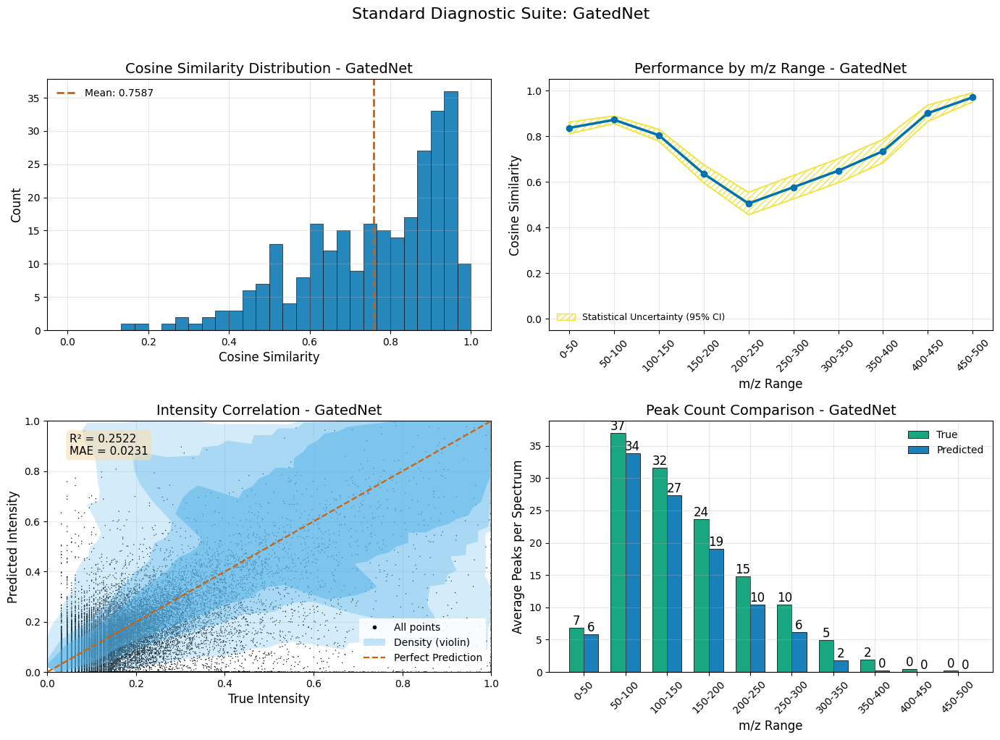


2. Random Spectrum Examples (2x2 Grid)

Selected random examples:
  1. Index 23: Cosine=0.9602, WDP=1.1695
  2. Index 178: Cosine=0.6092, WDP=0.2439
  3. Index 195: Cosine=0.7127, WDP=0.2084
  4. Index 226: Cosine=0.4087, WDP=0.1713


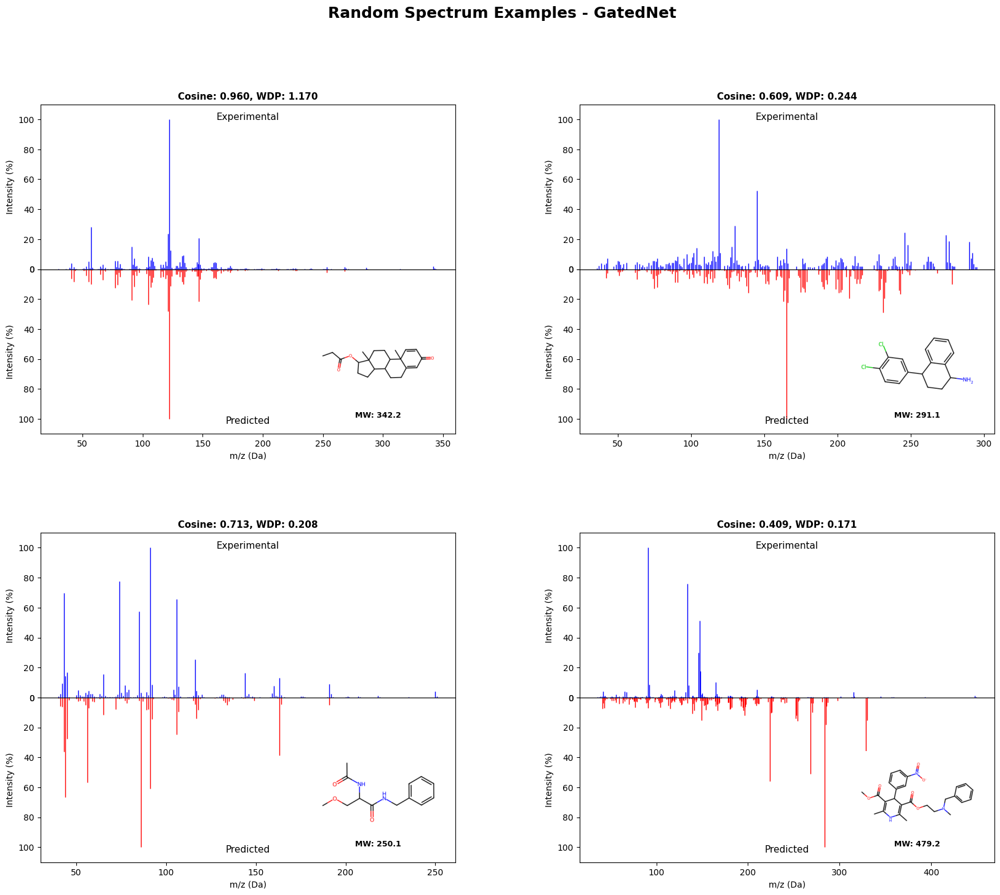


3. Deep Learning Training History


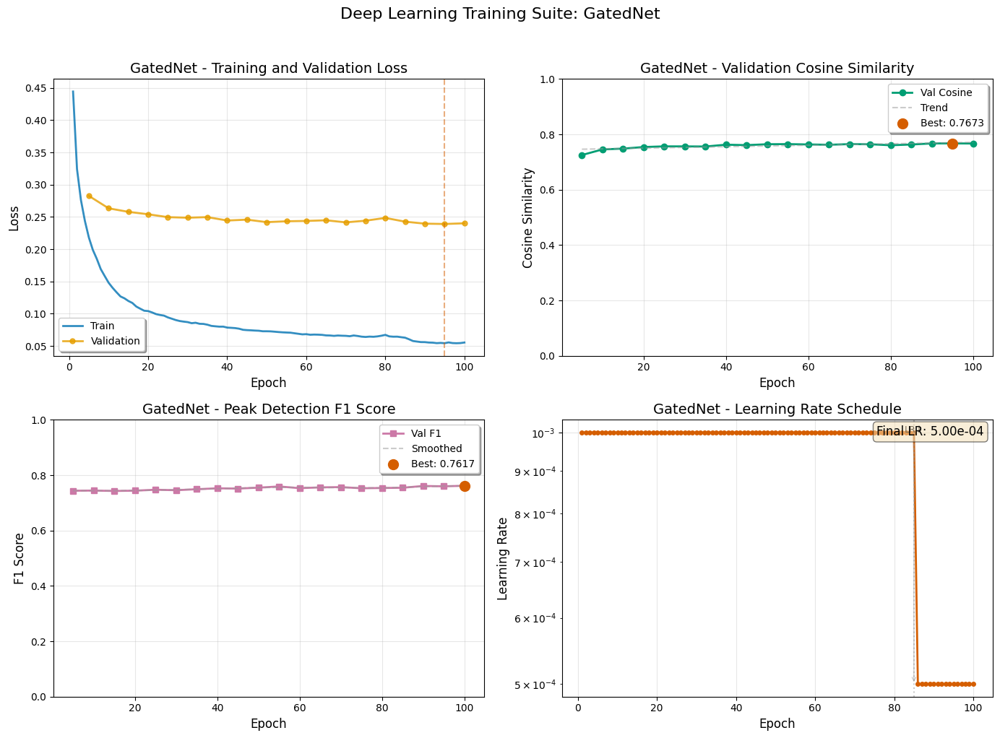


GatedNet evaluation complete!


In [17]:
class GatedNet(BaseModel):
    def __init__(self, input_dim: int, output_dim: int, config: Dict):
        super().__init__(input_dim, output_dim)
        
        hidden_dims = config['hidden_dims']
        gate_hidden = config['gate_hidden']
        
        # Main pathway
        main_layers = []
        dims = [input_dim] + hidden_dims
        for i in range(len(hidden_dims)):
            main_layers.extend([
                nn.Linear(dims[i], dims[i+1]),
                nn.BatchNorm1d(dims[i+1]),
                nn.ReLU(),
                nn.Dropout(0.1)
            ])
        self.main_path = nn.Sequential(*main_layers)
        
        # Gating pathway
        self.gate_path = nn.Sequential(
            nn.Linear(input_dim, gate_hidden),
            nn.ReLU(),
            nn.Linear(gate_hidden, hidden_dims[-1]),
            nn.Sigmoid()
        )
        
        # Output layers
        self.output_proj = nn.Linear(hidden_dims[-1], output_dim)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # Main processing
        main_features = self.main_path(x)
        
        # Gating
        gates = self.gate_path(x)
        
        # Apply gates
        gated_features = main_features * gates
        
        # Output
        output = self.output_proj(gated_features)
        output = F.relu(output)
        
        return output

# Train and evaluate GatedNet with standard visualizations
if len(X_train) > 0:
    results_gated = train_and_evaluate_model(GatedNet, 'GatedNet')

## 18. EnsembleNet Architecture

A learned mixture of MLPs with soft aggregation weights.

Members $f_j$ produce $\hat{\mathbf{y}}^{(j)}$. Trainable weights $\alpha_j$ (softmax-normalized) yield:
$$
\hat{\mathbf{y}}=\sum_{j=1}^M \pi_j\,\hat{\mathbf{y}}^{(j)},\quad
\pi_j=\frac{e^{\alpha_j}}{\sum_k e^{\alpha_k}}.
$$

Diversity loss: penalize pairwise cosine similarity among heads,
$$
\mathcal{L}_{\mathrm{div}}=\frac{2}{M(M-1)}\sum_{i<j}\mathrm{cos}\big(\hat{\mathbf{y}}^{(i)},\hat{\mathbf{y}}^{(j)}\big).
$$

```mermaid
flowchart LR
  X["Input x"] --> M1["MLP 1"]
  X --> M2["MLP 2"]
  X --> M3["MLP M"]
  M1 --> Sum
  M2 --> Sum
  M3 --> Sum
  X --> Wts["Learned weights → softmax"]
  Wts --> Sum
  Sum --> O["Weighted sum → ŷ"]
```


TRAINING ENSEMBLENET
Total parameters: 11,748,063

Training EnsembleNet...


Epoch 5/100: 100%|██████████| 34/34 [00:00<00:00, 60.23it/s, loss=0.2215, cos=0.2070]



EnsembleNet Performance:
  Cosine Similarity: 0.7295
  MSE: 0.0096, R²: 0.0716
  Peak Detection - Precision: 0.7608, Recall: 0.7274, F1: 0.7437
  Sparsity - True: 0.740, Pred: 0.752
  New best model saved! (Cosine: 0.7295)


Epoch 10/100: 100%|██████████| 34/34 [00:00<00:00, 38.70it/s, loss=0.2024, cos=0.1916]



EnsembleNet Performance:
  Cosine Similarity: 0.7418
  MSE: 0.0084, R²: 0.1454
  Peak Detection - Precision: 0.7935, Recall: 0.7057, F1: 0.7470
  Sparsity - True: 0.740, Pred: 0.769
  New best model saved! (Cosine: 0.7418)


Epoch 15/100: 100%|██████████| 34/34 [00:00<00:00, 38.57it/s, loss=0.1493, cos=0.1391]



EnsembleNet Performance:
  Cosine Similarity: 0.7464
  MSE: 0.0080, R²: 0.1661
  Peak Detection - Precision: 0.8128, Recall: 0.6923, F1: 0.7477
  Sparsity - True: 0.740, Pred: 0.779
  New best model saved! (Cosine: 0.7464)


Epoch 20/100: 100%|██████████| 34/34 [00:00<00:00, 38.95it/s, loss=0.1246, cos=0.1165]



EnsembleNet Performance:
  Cosine Similarity: 0.7577
  MSE: 0.0076, R²: 0.1932
  Peak Detection - Precision: 0.8192, Recall: 0.6874, F1: 0.7476
  Sparsity - True: 0.740, Pred: 0.783
  New best model saved! (Cosine: 0.7577)


Epoch 25/100: 100%|██████████| 34/34 [00:00<00:00, 98.05it/s, loss=0.1254, cos=0.1170] 



EnsembleNet Performance:
  Cosine Similarity: 0.7578
  MSE: 0.0076, R²: 0.1982
  Peak Detection - Precision: 0.8186, Recall: 0.6953, F1: 0.7520
  Sparsity - True: 0.740, Pred: 0.780
  New best model saved! (Cosine: 0.7578)


Epoch 30/100: 100%|██████████| 34/34 [00:00<00:00, 38.53it/s, loss=0.1128, cos=0.1052]



EnsembleNet Performance:
  Cosine Similarity: 0.7621
  MSE: 0.0074, R²: 0.2097
  Peak Detection - Precision: 0.8255, Recall: 0.6872, F1: 0.7500
  Sparsity - True: 0.740, Pred: 0.784
  New best model saved! (Cosine: 0.7621)


Epoch 35/100: 100%|██████████| 34/34 [00:00<00:00, 39.19it/s, loss=0.1232, cos=0.1161]



EnsembleNet Performance:
  Cosine Similarity: 0.7622
  MSE: 0.0074, R²: 0.2080
  Peak Detection - Precision: 0.8244, Recall: 0.6951, F1: 0.7543
  Sparsity - True: 0.740, Pred: 0.782
  New best model saved! (Cosine: 0.7622)


Epoch 40/100: 100%|██████████| 34/34 [00:00<00:00, 39.35it/s, loss=0.0996, cos=0.0934]



EnsembleNet Performance:
  Cosine Similarity: 0.7650
  MSE: 0.0073, R²: 0.2057
  Peak Detection - Precision: 0.8332, Recall: 0.6866, F1: 0.7528
  Sparsity - True: 0.740, Pred: 0.787
  New best model saved! (Cosine: 0.7650)


Epoch 45/100: 100%|██████████| 34/34 [00:00<00:00, 39.00it/s, loss=0.1002, cos=0.0938]



EnsembleNet Performance:
  Cosine Similarity: 0.7654
  MSE: 0.0072, R²: 0.2108
  Peak Detection - Precision: 0.8259, Recall: 0.7031, F1: 0.7596
  Sparsity - True: 0.740, Pred: 0.780
  New best model saved! (Cosine: 0.7654)


Epoch 50/100: 100%|██████████| 34/34 [00:00<00:00, 39.19it/s, loss=0.0879, cos=0.0825]



EnsembleNet Performance:
  Cosine Similarity: 0.7688
  MSE: 0.0072, R²: 0.2177
  Peak Detection - Precision: 0.8275, Recall: 0.7047, F1: 0.7612
  Sparsity - True: 0.740, Pred: 0.779
  New best model saved! (Cosine: 0.7688)


Epoch 55/100: 100%|██████████| 34/34 [00:00<00:00, 38.47it/s, loss=0.1074, cos=0.1012]



EnsembleNet Performance:
  Cosine Similarity: 0.7681
  MSE: 0.0072, R²: 0.2225
  Peak Detection - Precision: 0.8387, Recall: 0.6853, F1: 0.7542
  Sparsity - True: 0.740, Pred: 0.789


Epoch 60/100: 100%|██████████| 34/34 [00:00<00:00, 39.33it/s, loss=0.0823, cos=0.0764]



EnsembleNet Performance:
  Cosine Similarity: 0.7690
  MSE: 0.0072, R²: 0.2162
  Peak Detection - Precision: 0.8280, Recall: 0.7018, F1: 0.7597
  Sparsity - True: 0.740, Pred: 0.781
  New best model saved! (Cosine: 0.7690)


Epoch 65/100: 100%|██████████| 34/34 [00:00<00:00, 39.21it/s, loss=0.0908, cos=0.0853]



EnsembleNet Performance:
  Cosine Similarity: 0.7705
  MSE: 0.0071, R²: 0.2199
  Peak Detection - Precision: 0.8307, Recall: 0.7012, F1: 0.7605
  Sparsity - True: 0.740, Pred: 0.782
  New best model saved! (Cosine: 0.7705)


Epoch 70/100: 100%|██████████| 34/34 [00:00<00:00, 86.16it/s, loss=0.0936, cos=0.0887]



EnsembleNet Performance:
  Cosine Similarity: 0.7718
  MSE: 0.0071, R²: 0.2255
  Peak Detection - Precision: 0.8321, Recall: 0.7025, F1: 0.7618
  Sparsity - True: 0.740, Pred: 0.782
  New best model saved! (Cosine: 0.7718)


Epoch 75/100: 100%|██████████| 34/34 [00:00<00:00, 38.88it/s, loss=0.0800, cos=0.0751]



EnsembleNet Performance:
  Cosine Similarity: 0.7695
  MSE: 0.0071, R²: 0.2189
  Peak Detection - Precision: 0.8292, Recall: 0.7038, F1: 0.7614
  Sparsity - True: 0.740, Pred: 0.781


Epoch 80/100: 100%|██████████| 34/34 [00:00<00:00, 38.86it/s, loss=0.0936, cos=0.0880]



EnsembleNet Performance:
  Cosine Similarity: 0.7702
  MSE: 0.0071, R²: 0.2245
  Peak Detection - Precision: 0.8305, Recall: 0.7085, F1: 0.7647
  Sparsity - True: 0.740, Pred: 0.779


Epoch 85/100: 100%|██████████| 34/34 [00:00<00:00, 38.78it/s, loss=0.0734, cos=0.0691]



EnsembleNet Performance:
  Cosine Similarity: 0.7692
  MSE: 0.0071, R²: 0.2171
  Peak Detection - Precision: 0.8268, Recall: 0.7108, F1: 0.7644
  Sparsity - True: 0.740, Pred: 0.778


Epoch 90/100: 100%|██████████| 34/34 [00:00<00:00, 39.32it/s, loss=0.0723, cos=0.0672]



EnsembleNet Performance:
  Cosine Similarity: 0.7738
  MSE: 0.0070, R²: 0.2299
  Peak Detection - Precision: 0.8281, Recall: 0.7104, F1: 0.7648
  Sparsity - True: 0.740, Pred: 0.778
  New best model saved! (Cosine: 0.7738)


Epoch 95/100: 100%|██████████| 34/34 [00:00<00:00, 39.14it/s, loss=0.0674, cos=0.0629]



EnsembleNet Performance:
  Cosine Similarity: 0.7717
  MSE: 0.0071, R²: 0.2273
  Peak Detection - Precision: 0.8282, Recall: 0.7105, F1: 0.7648
  Sparsity - True: 0.740, Pred: 0.778


Epoch 100/100: 100%|██████████| 34/34 [00:00<00:00, 39.61it/s, loss=0.0787, cos=0.0744]



EnsembleNet Performance:
  Cosine Similarity: 0.7718
  MSE: 0.0070, R²: 0.2276
  Peak Detection - Precision: 0.8271, Recall: 0.7132, F1: 0.7660
  Sparsity - True: 0.740, Pred: 0.777

Training complete. Best validation cosine: 0.7738

EnsembleNet Performance:
  Cosine Similarity: 0.7627
  MSE: 0.0052, R²: 0.2117
  Peak Detection - Precision: 0.8349, Recall: 0.7212, F1: 0.7739
  Sparsity - True: 0.736, Pred: 0.774

------------------------------------------------------------
GENERATING STANDARD VISUALIZATIONS
------------------------------------------------------------

1. Standard 2x2 Diagnostic Plots


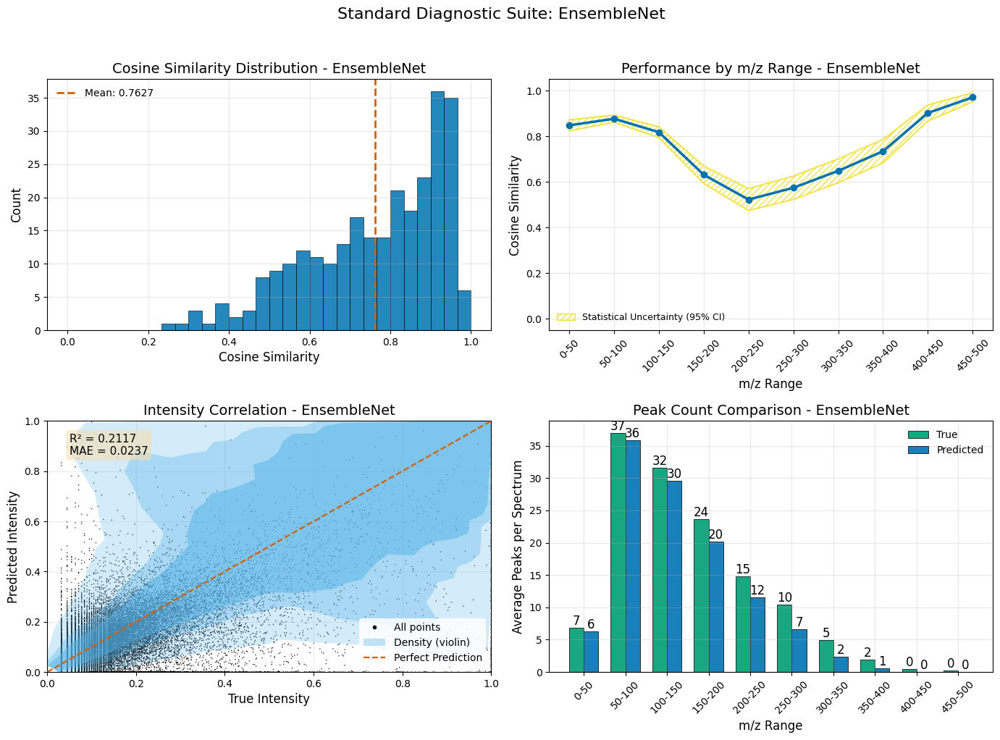


2. Random Spectrum Examples (2x2 Grid)

Selected random examples:
  1. Index 267: Cosine=0.7347, WDP=0.4081
  2. Index 28: Cosine=0.5893, WDP=0.2998
  3. Index 52: Cosine=0.6647, WDP=0.2990
  4. Index 93: Cosine=0.9564, WDP=1.1557


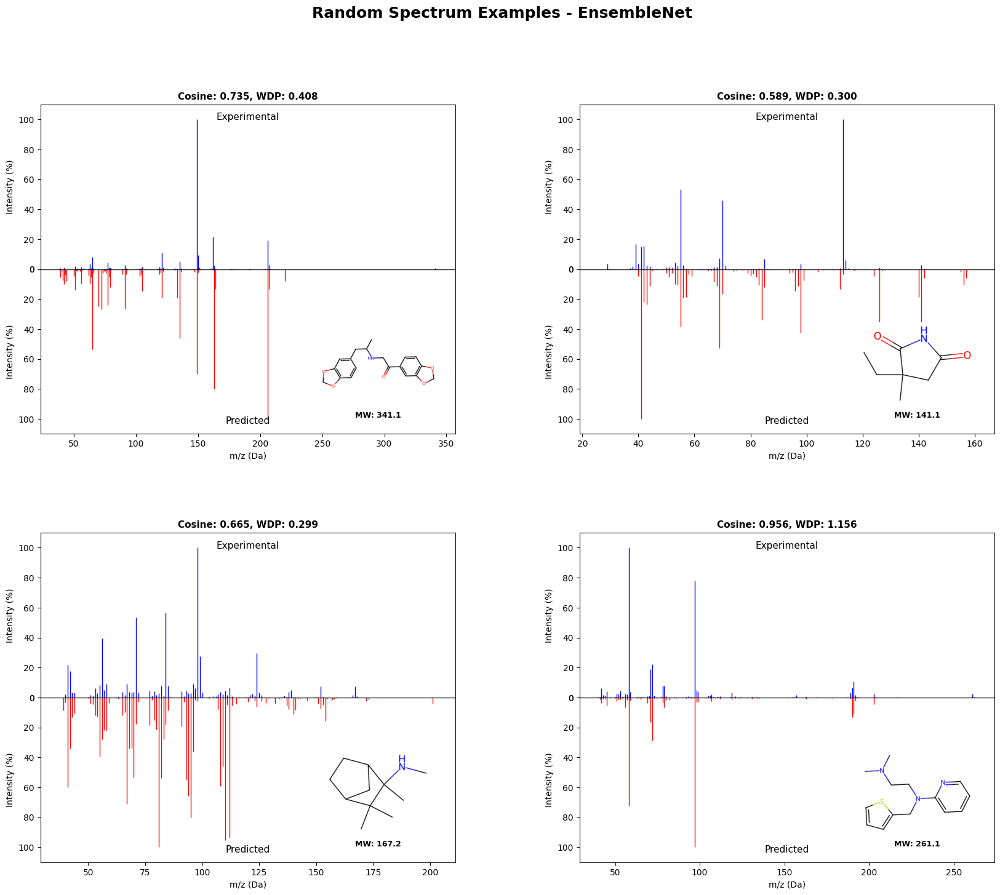


3. Deep Learning Training History


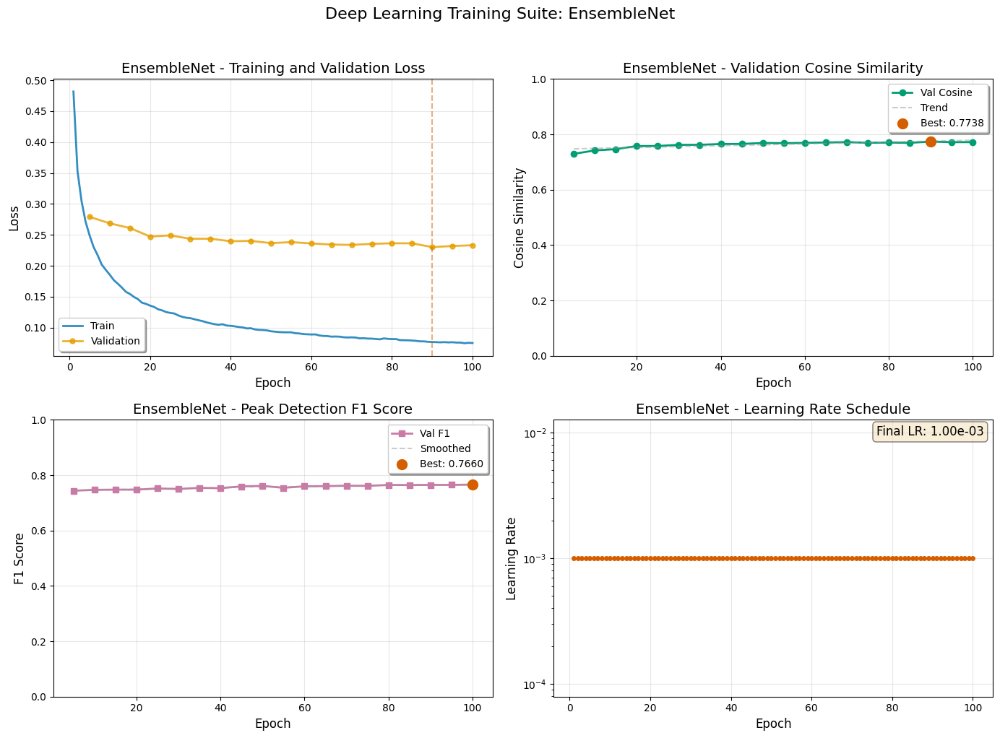


EnsembleNet evaluation complete!


In [18]:
class EnsembleNet(BaseModel):
    def __init__(self, input_dim: int, output_dim: int, config: Dict):
        super().__init__(input_dim, output_dim)
        
        num_models = config['num_models']
        hidden_dims = config['hidden_dims']
        self.diversity_weight = config['diversity_weight']
        
        # Create multiple sub-models
        self.models = nn.ModuleList()
        for _ in range(num_models):
            layers = []
            dims = [input_dim] + hidden_dims
            
            for i in range(len(hidden_dims)):
                layers.extend([
                    nn.Linear(dims[i], dims[i+1]),
                    nn.BatchNorm1d(dims[i+1]),
                    nn.ReLU(),
                    nn.Dropout(0.2)
                ])
            
            layers.append(nn.Linear(hidden_dims[-1], output_dim))
            layers.append(nn.ReLU())
            
            self.models.append(nn.Sequential(*layers))
        
        # Aggregation weights
        self.aggregation_weights = nn.Parameter(torch.ones(num_models) / num_models)
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # Get predictions from all models
        predictions = []
        for model in self.models:
            pred = model(x)
            predictions.append(pred)
        
        # Stack predictions
        predictions_stack = torch.stack(predictions, dim=1)
        
        # Weighted average
        weights = F.softmax(self.aggregation_weights, dim=0)
        weights = weights.view(1, -1, 1)
        
        output = (predictions_stack * weights).sum(dim=1)
        
        return output
    
    def diversity_loss(self, x: torch.Tensor) -> torch.Tensor:
        """Calculate diversity loss to encourage different predictions"""
        predictions = []
        for model in self.models:
            pred = model(x)
            predictions.append(pred)
        
        # Calculate pairwise cosine similarity
        diversity_loss = 0
        num_pairs = 0
        
        for i in range(len(predictions)):
            for j in range(i + 1, len(predictions)):
                cos_sim = F.cosine_similarity(predictions[i], predictions[j], dim=1).mean()
                diversity_loss += cos_sim
                num_pairs += 1
        
        if num_pairs > 0:
            diversity_loss /= num_pairs
        
        return diversity_loss

# Train and evaluate EnsembleNet with standard visualizations
if len(X_train) > 0:
    results_ensemble = train_and_evaluate_model(EnsembleNet, 'EnsembleNet')

## 19. ModularNet Architecture

Multiple specialized modules process the same features; a fusion mechanism (attention or learned weights) combines their outputs.

$$
\mathbf{g}=\mathrm{GlobalEnc}(\mathbf{x}),\quad
\hat{\mathbf{y}}^{(m)}=\mathrm{Mod}_m(\mathbf{x}),\quad
\mathbf{w}=\mathrm{Softmax}(\mathbf{W}\mathbf{g}),\quad
\hat{\mathbf{y}}=\sum_m w_m\,\hat{\mathbf{y}}^{(m)}.
$$

Motivation: emulate experts trained for different fragmentation motifs without explicit regional partitioning.

```mermaid
flowchart TD
  X["Input x"] --> G["Global Encoder"]
  X --> M1["Module 1"]
  X --> M2["Module 2"]
  X --> Mk["Module m"]
  G --> W["Fusion weights (softmax)"]
  M1 --> Fuse
  M2 --> Fuse
  Mk --> Fuse
  W --> Fuse
  Fuse --> O["ŷ"]
```


TRAINING MODULARNET
Total parameters: 9,530,836

Training ModularNet...


Epoch 5/100: 100%|██████████| 34/34 [00:00<00:00, 120.85it/s, loss=0.2246, cos=0.2193]



ModularNet Performance:
  Cosine Similarity: 0.7342
  MSE: 0.0078, R²: 0.1497
  Peak Detection - Precision: 0.6802, Recall: 0.8145, F1: 0.7413
  Sparsity - True: 0.740, Pred: 0.693
  New best model saved! (Cosine: 0.7342)


Epoch 10/100: 100%|██████████| 34/34 [00:00<00:00, 62.94it/s, loss=0.1672, cos=0.1627]



ModularNet Performance:
  Cosine Similarity: 0.7464
  MSE: 0.0073, R²: 0.2114
  Peak Detection - Precision: 0.7196, Recall: 0.7966, F1: 0.7561
  Sparsity - True: 0.740, Pred: 0.717
  New best model saved! (Cosine: 0.7464)


Epoch 15/100: 100%|██████████| 34/34 [00:00<00:00, 63.70it/s, loss=0.1308, cos=0.1277]



ModularNet Performance:
  Cosine Similarity: 0.7571
  MSE: 0.0071, R²: 0.2250
  Peak Detection - Precision: 0.7438, Recall: 0.7869, F1: 0.7647
  Sparsity - True: 0.740, Pred: 0.730
  New best model saved! (Cosine: 0.7571)


Epoch 20/100: 100%|██████████| 34/34 [00:00<00:00, 62.99it/s, loss=0.1151, cos=0.1119]



ModularNet Performance:
  Cosine Similarity: 0.7694
  MSE: 0.0069, R²: 0.2316
  Peak Detection - Precision: 0.7481, Recall: 0.7960, F1: 0.7713
  Sparsity - True: 0.740, Pred: 0.728
  New best model saved! (Cosine: 0.7694)


Epoch 25/100: 100%|██████████| 34/34 [00:00<00:00, 63.56it/s, loss=0.0907, cos=0.0876]



ModularNet Performance:
  Cosine Similarity: 0.7692
  MSE: 0.0069, R²: 0.2365
  Peak Detection - Precision: 0.7636, Recall: 0.7872, F1: 0.7752
  Sparsity - True: 0.740, Pred: 0.737


Epoch 30/100: 100%|██████████| 34/34 [00:00<00:00, 65.80it/s, loss=0.0990, cos=0.0964]



ModularNet Performance:
  Cosine Similarity: 0.7768
  MSE: 0.0068, R²: 0.2466
  Peak Detection - Precision: 0.7640, Recall: 0.7947, F1: 0.7791
  Sparsity - True: 0.740, Pred: 0.734
  New best model saved! (Cosine: 0.7768)


Epoch 35/100: 100%|██████████| 34/34 [00:00<00:00, 130.82it/s, loss=0.0877, cos=0.0853]



ModularNet Performance:
  Cosine Similarity: 0.7740
  MSE: 0.0069, R²: 0.2311
  Peak Detection - Precision: 0.7699, Recall: 0.7862, F1: 0.7779
  Sparsity - True: 0.740, Pred: 0.739


Epoch 40/100: 100%|██████████| 34/34 [00:00<00:00, 139.15it/s, loss=0.0692, cos=0.0671]



ModularNet Performance:
  Cosine Similarity: 0.7752
  MSE: 0.0069, R²: 0.2379
  Peak Detection - Precision: 0.7682, Recall: 0.7968, F1: 0.7822
  Sparsity - True: 0.740, Pred: 0.733


Epoch 45/100: 100%|██████████| 34/34 [00:00<00:00, 67.03it/s, loss=0.0721, cos=0.0699]



ModularNet Performance:
  Cosine Similarity: 0.7797
  MSE: 0.0068, R²: 0.2426
  Peak Detection - Precision: 0.7723, Recall: 0.7917, F1: 0.7819
  Sparsity - True: 0.740, Pred: 0.738
  New best model saved! (Cosine: 0.7797)


Epoch 50/100: 100%|██████████| 34/34 [00:00<00:00, 65.60it/s, loss=0.0736, cos=0.0715]



ModularNet Performance:
  Cosine Similarity: 0.7783
  MSE: 0.0068, R²: 0.2421
  Peak Detection - Precision: 0.7772, Recall: 0.7925, F1: 0.7848
  Sparsity - True: 0.740, Pred: 0.739


Epoch 55/100: 100%|██████████| 34/34 [00:00<00:00, 65.80it/s, loss=0.0669, cos=0.0647]



ModularNet Performance:
  Cosine Similarity: 0.7779
  MSE: 0.0068, R²: 0.2426
  Peak Detection - Precision: 0.7759, Recall: 0.7934, F1: 0.7845
  Sparsity - True: 0.740, Pred: 0.739


Epoch 60/100: 100%|██████████| 34/34 [00:00<00:00, 64.51it/s, loss=0.0691, cos=0.0673]



ModularNet Performance:
  Cosine Similarity: 0.7775
  MSE: 0.0068, R²: 0.2433
  Peak Detection - Precision: 0.7777, Recall: 0.7929, F1: 0.7853
  Sparsity - True: 0.740, Pred: 0.740


Epoch 65/100: 100%|██████████| 34/34 [00:00<00:00, 67.04it/s, loss=0.0623, cos=0.0604]



ModularNet Performance:
  Cosine Similarity: 0.7790
  MSE: 0.0068, R²: 0.2444
  Peak Detection - Precision: 0.7702, Recall: 0.7961, F1: 0.7829
  Sparsity - True: 0.740, Pred: 0.736


Epoch 70/100: 100%|██████████| 34/34 [00:00<00:00, 65.86it/s, loss=0.0611, cos=0.0592]



ModularNet Performance:
  Cosine Similarity: 0.7813
  MSE: 0.0067, R²: 0.2440
  Peak Detection - Precision: 0.7733, Recall: 0.7980, F1: 0.7855
  Sparsity - True: 0.740, Pred: 0.736
  New best model saved! (Cosine: 0.7813)


Epoch 75/100: 100%|██████████| 34/34 [00:00<00:00, 65.83it/s, loss=0.0624, cos=0.0604]



ModularNet Performance:
  Cosine Similarity: 0.7808
  MSE: 0.0068, R²: 0.2348
  Peak Detection - Precision: 0.7755, Recall: 0.7977, F1: 0.7864
  Sparsity - True: 0.740, Pred: 0.737


Epoch 80/100: 100%|██████████| 34/34 [00:00<00:00, 67.05it/s, loss=0.0512, cos=0.0493]



ModularNet Performance:
  Cosine Similarity: 0.7801
  MSE: 0.0068, R²: 0.2369
  Peak Detection - Precision: 0.7749, Recall: 0.8020, F1: 0.7882
  Sparsity - True: 0.740, Pred: 0.735


Epoch 85/100: 100%|██████████| 34/34 [00:00<00:00, 67.19it/s, loss=0.0567, cos=0.0549]



ModularNet Performance:
  Cosine Similarity: 0.7806
  MSE: 0.0068, R²: 0.2416
  Peak Detection - Precision: 0.7722, Recall: 0.8004, F1: 0.7861
  Sparsity - True: 0.740, Pred: 0.735


Epoch 90/100: 100%|██████████| 34/34 [00:00<00:00, 63.91it/s, loss=0.0534, cos=0.0516]



ModularNet Performance:
  Cosine Similarity: 0.7815
  MSE: 0.0067, R²: 0.2451
  Peak Detection - Precision: 0.7706, Recall: 0.8010, F1: 0.7855
  Sparsity - True: 0.740, Pred: 0.734
  New best model saved! (Cosine: 0.7815)


Epoch 95/100: 100%|██████████| 34/34 [00:00<00:00, 67.49it/s, loss=0.0461, cos=0.0447]



ModularNet Performance:
  Cosine Similarity: 0.7852
  MSE: 0.0067, R²: 0.2438
  Peak Detection - Precision: 0.7724, Recall: 0.8041, F1: 0.7879
  Sparsity - True: 0.740, Pred: 0.733
  New best model saved! (Cosine: 0.7852)


Epoch 100/100: 100%|██████████| 34/34 [00:00<00:00, 64.64it/s, loss=0.0489, cos=0.0473]



ModularNet Performance:
  Cosine Similarity: 0.7807
  MSE: 0.0068, R²: 0.2400
  Peak Detection - Precision: 0.7784, Recall: 0.7988, F1: 0.7885
  Sparsity - True: 0.740, Pred: 0.737

Training complete. Best validation cosine: 0.7852

ModularNet Performance:
  Cosine Similarity: 0.7751
  MSE: 0.0048, R²: 0.1255
  Peak Detection - Precision: 0.7858, Recall: 0.8134, F1: 0.7993
  Sparsity - True: 0.736, Pred: 0.732

------------------------------------------------------------
GENERATING STANDARD VISUALIZATIONS
------------------------------------------------------------

1. Standard 2x2 Diagnostic Plots


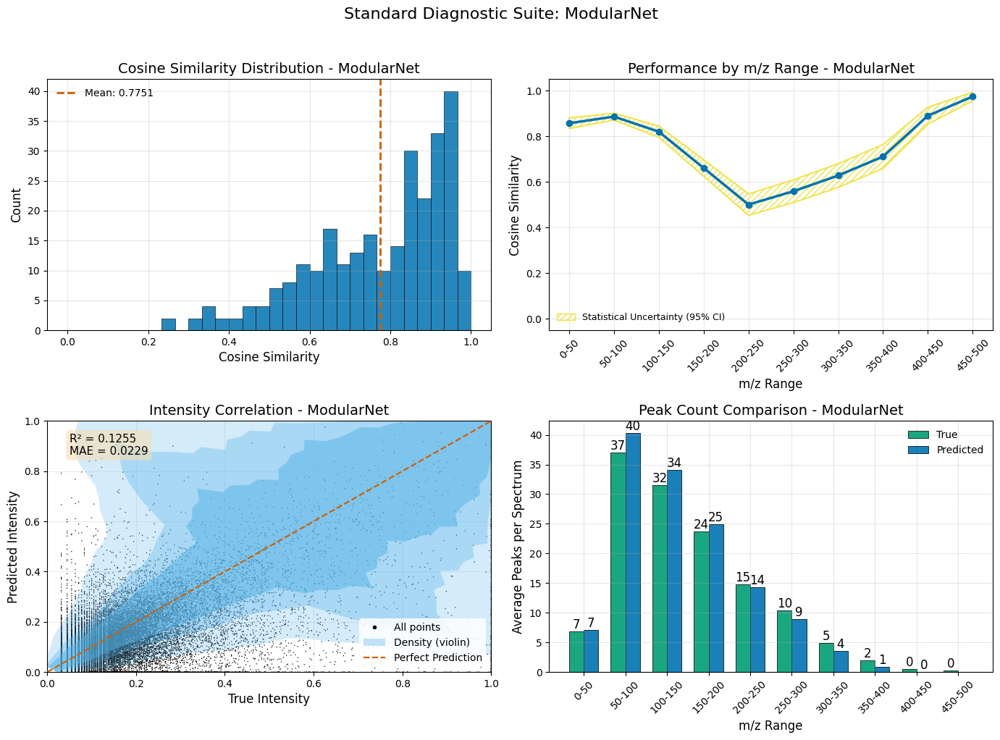


2. Random Spectrum Examples (2x2 Grid)

Selected random examples:
  1. Index 127: Cosine=0.7904, WDP=0.5225
  2. Index 173: Cosine=0.9702, WDP=1.3823
  3. Index 99: Cosine=0.8023, WDP=0.4988
  4. Index 271: Cosine=0.9751, WDP=1.0277


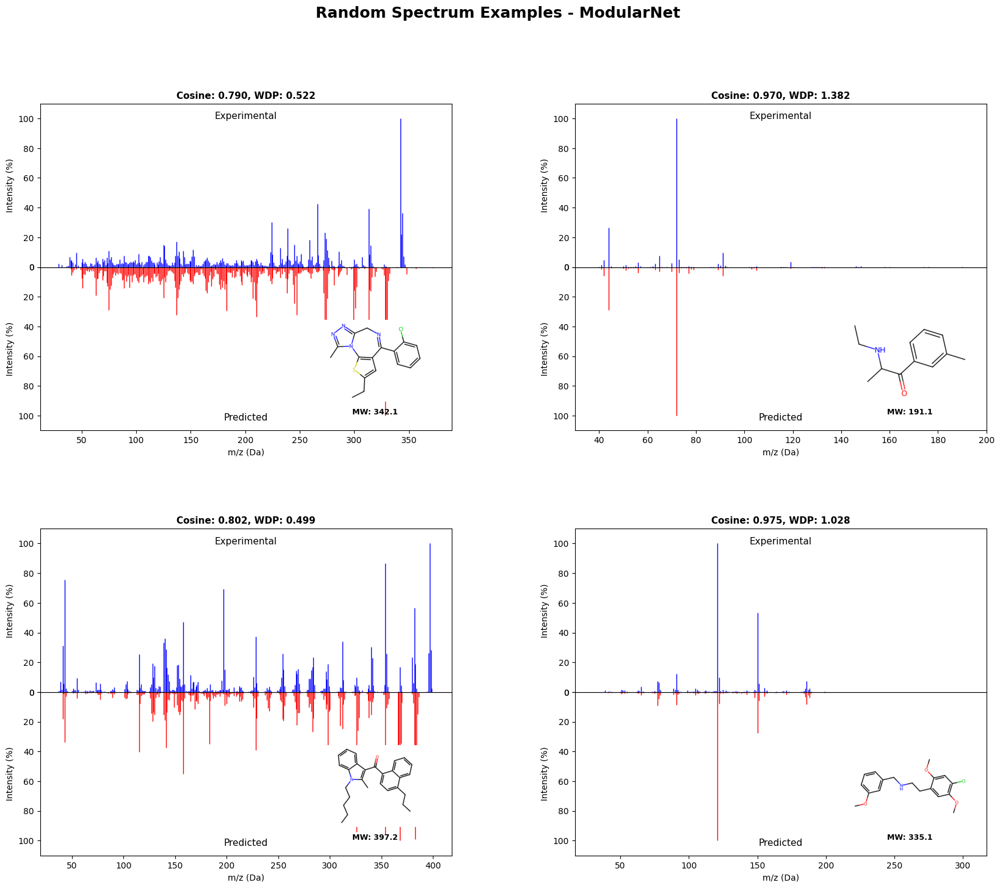


3. Deep Learning Training History


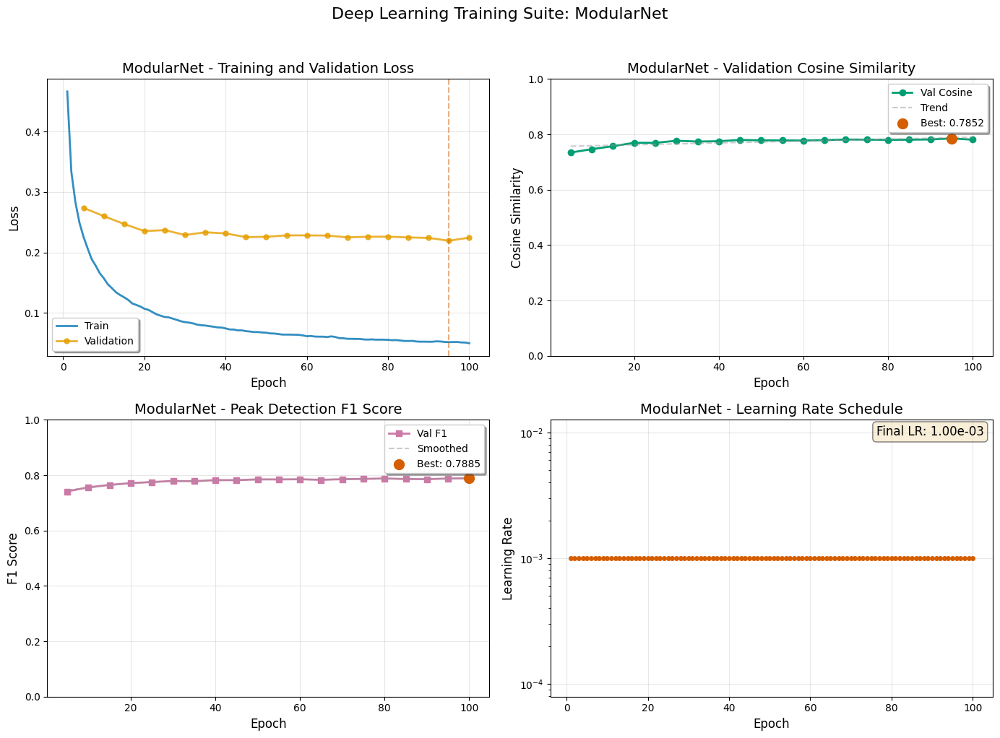


ModularNet evaluation complete!


In [19]:
class ModularNet(BaseModel):
    def __init__(self, input_dim: int, output_dim: int, config: Dict):
        super().__init__(input_dim, output_dim)
        
        num_modules = config['num_modules']
        module_dims = config['module_dims']
        fusion_method = config['fusion_method']
        
        # Global feature extractor
        self.global_encoder = nn.Sequential(
            nn.Linear(input_dim, module_dims[0]),
            nn.BatchNorm1d(module_dims[0]),
            nn.ReLU(),
            nn.Dropout(0.1)
        )
        
        # Specialized modules
        self.specialized_modules = nn.ModuleList()
        
        for i in range(num_modules):
            module_layers = []
            dims = [input_dim] + module_dims
            
            for j in range(len(module_dims)):
                module_layers.extend([
                    nn.Linear(dims[j], dims[j+1]),
                    nn.BatchNorm1d(dims[j+1]),
                    nn.ReLU(),
                    nn.Dropout(0.1)
                ])
            
            module_layers.append(nn.Linear(module_dims[-1], output_dim))
            module_layers.append(nn.ReLU())
            
            self.specialized_modules.append(nn.Sequential(*module_layers))
        
        # Fusion mechanism
        if fusion_method == 'attention':
            self.fusion_attention = nn.Sequential(
                nn.Linear(module_dims[0], num_modules),
                nn.Softmax(dim=1)
            )
        else:
            self.fusion_weights = nn.Parameter(torch.ones(num_modules) / num_modules)
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        global_features = self.global_encoder(x)
        
        module_outputs = []
        for module in self.specialized_modules:
            output = module(x)
            module_outputs.append(output)
        
        module_outputs = torch.stack(module_outputs, dim=1)
        
        if hasattr(self, 'fusion_attention'):
            attention_weights = self.fusion_attention(global_features)
            attention_weights = attention_weights.unsqueeze(2)
            fused_output = (module_outputs * attention_weights).sum(dim=1)
        else:
            weights = F.softmax(self.fusion_weights, dim=0)
            weights = weights.view(1, -1, 1)
            fused_output = (module_outputs * weights).sum(dim=1)
        
        return fused_output

# Train and evaluate ModularNet with standard visualizations
if len(X_train) > 0:
    results_modular = train_and_evaluate_model(ModularNet, 'ModularNet')

## 20. SparseGatedNet Architecture

Explicitly models sparse vs dense emission regimes with gates at hidden and output levels.

Hidden sparse gating layer
$$
\mathbf{g}=\sigma(\mathrm{GateMLP}(\mathbf{h}))/T,\quad
\mathbf{o}=\mathbf{g}\odot \mathrm{DensePath}(\mathbf{h}) + (1-\mathbf{g})\odot \mathrm{SparsePath}(\mathbf{h}),
$$
with temperature $T$ controlling gate softness.

Output mixture
$$
\hat{\mathbf{y}}=\sigma(\mathbf{W}_g\mathbf{h})\odot \hat{\mathbf{y}}^{\text{dense}}
+ \big(1-\sigma(\mathbf{W}_g\mathbf{h})\big)\odot (0.1\,\hat{\mathbf{y}}^{\text{sparse}}).
$$

Bias toward sparse behavior unless gates strongly support a dense region.

```mermaid
flowchart LR
  H["Hidden h"] --> Gate["GateMLP → σ / T"]
  H --> Dense["DensePath"]
  H --> Sparse["SparsePath"]
  Gate --> MixH["g ⊙ Dense + (1−g) ⊙ Sparse"]
  MixH --> OutGate["Output gate σ(W_g h)"]
  MixH --> Yd["ŷ_dense"]
  MixH --> Ys["ŷ_sparse"]
  OutGate --> MixY["gate ⊙ ŷ_dense + (1−gate) ⊙ 0.1·ŷ_sparse"]
  MixY --> O["ŷ"]
```


TRAINING SPARSEGATEDNET
Total parameters: 11,378,652

Training SparseGatedNet...


Epoch 5/100: 100%|██████████| 34/34 [00:00<00:00, 56.27it/s, loss=0.2969, cos=0.2909]



SparseGatedNet Performance:
  Cosine Similarity: 0.7231
  MSE: 0.0080, R²: 0.1710
  Peak Detection - Precision: 0.5744, Recall: 0.9174, F1: 0.7065
  Sparsity - True: 0.740, Pred: 0.596
  New best model saved! (Cosine: 0.7231)


Epoch 10/100: 100%|██████████| 34/34 [00:00<00:00, 61.49it/s, loss=0.2226, cos=0.2179]



SparseGatedNet Performance:
  Cosine Similarity: 0.7401
  MSE: 0.0075, R²: 0.2025
  Peak Detection - Precision: 0.6205, Recall: 0.8943, F1: 0.7327
  Sparsity - True: 0.740, Pred: 0.635
  New best model saved! (Cosine: 0.7401)


Epoch 15/100: 100%|██████████| 34/34 [00:00<00:00, 56.83it/s, loss=0.1877, cos=0.1822]



SparseGatedNet Performance:
  Cosine Similarity: 0.7554
  MSE: 0.0073, R²: 0.2251
  Peak Detection - Precision: 0.6419, Recall: 0.8842, F1: 0.7438
  Sparsity - True: 0.740, Pred: 0.650
  New best model saved! (Cosine: 0.7554)


Epoch 20/100: 100%|██████████| 34/34 [00:00<00:00, 56.20it/s, loss=0.1427, cos=0.1390]



SparseGatedNet Performance:
  Cosine Similarity: 0.7633
  MSE: 0.0071, R²: 0.2317
  Peak Detection - Precision: 0.6693, Recall: 0.8723, F1: 0.7574
  Sparsity - True: 0.740, Pred: 0.669
  New best model saved! (Cosine: 0.7633)


Epoch 25/100: 100%|██████████| 34/34 [00:00<00:00, 58.30it/s, loss=0.1279, cos=0.1240]



SparseGatedNet Performance:
  Cosine Similarity: 0.7611
  MSE: 0.0072, R²: 0.2329
  Peak Detection - Precision: 0.6802, Recall: 0.8622, F1: 0.7605
  Sparsity - True: 0.740, Pred: 0.681


Epoch 30/100: 100%|██████████| 34/34 [00:00<00:00, 56.03it/s, loss=0.1240, cos=0.1204]



SparseGatedNet Performance:
  Cosine Similarity: 0.7651
  MSE: 0.0070, R²: 0.2362
  Peak Detection - Precision: 0.6950, Recall: 0.8569, F1: 0.7675
  Sparsity - True: 0.740, Pred: 0.688
  New best model saved! (Cosine: 0.7651)


Epoch 35/100: 100%|██████████| 34/34 [00:00<00:00, 126.14it/s, loss=0.1118, cos=0.1086]



SparseGatedNet Performance:
  Cosine Similarity: 0.7684
  MSE: 0.0071, R²: 0.2365
  Peak Detection - Precision: 0.7134, Recall: 0.8414, F1: 0.7721
  Sparsity - True: 0.740, Pred: 0.703
  New best model saved! (Cosine: 0.7684)


Epoch 40/100: 100%|██████████| 34/34 [00:00<00:00, 119.38it/s, loss=0.0976, cos=0.0945]



SparseGatedNet Performance:
  Cosine Similarity: 0.7693
  MSE: 0.0070, R²: 0.2407
  Peak Detection - Precision: 0.6985, Recall: 0.8510, F1: 0.7672
  Sparsity - True: 0.740, Pred: 0.693
  New best model saved! (Cosine: 0.7693)


Epoch 45/100: 100%|██████████| 34/34 [00:00<00:00, 66.64it/s, loss=0.0795, cos=0.0773]



SparseGatedNet Performance:
  Cosine Similarity: 0.7736
  MSE: 0.0069, R²: 0.2434
  Peak Detection - Precision: 0.7110, Recall: 0.8467, F1: 0.7729
  Sparsity - True: 0.740, Pred: 0.699
  New best model saved! (Cosine: 0.7736)


Epoch 50/100: 100%|██████████| 34/34 [00:00<00:00, 131.75it/s, loss=0.0801, cos=0.0774]



SparseGatedNet Performance:
  Cosine Similarity: 0.7763
  MSE: 0.0069, R²: 0.2450
  Peak Detection - Precision: 0.7087, Recall: 0.8455, F1: 0.7711
  Sparsity - True: 0.740, Pred: 0.701
  New best model saved! (Cosine: 0.7763)


Epoch 55/100: 100%|██████████| 34/34 [00:00<00:00, 135.92it/s, loss=0.0762, cos=0.0740]



SparseGatedNet Performance:
  Cosine Similarity: 0.7776
  MSE: 0.0069, R²: 0.2476
  Peak Detection - Precision: 0.7218, Recall: 0.8392, F1: 0.7761
  Sparsity - True: 0.740, Pred: 0.709
  New best model saved! (Cosine: 0.7776)


Epoch 60/100: 100%|██████████| 34/34 [00:00<00:00, 131.83it/s, loss=0.0678, cos=0.0652]



SparseGatedNet Performance:
  Cosine Similarity: 0.7733
  MSE: 0.0068, R²: 0.2463
  Peak Detection - Precision: 0.7211, Recall: 0.8362, F1: 0.7744
  Sparsity - True: 0.740, Pred: 0.708


Epoch 65/100: 100%|██████████| 34/34 [00:00<00:00, 132.14it/s, loss=0.0710, cos=0.0686]



SparseGatedNet Performance:
  Cosine Similarity: 0.7713
  MSE: 0.0069, R²: 0.2382
  Peak Detection - Precision: 0.7315, Recall: 0.8295, F1: 0.7774
  Sparsity - True: 0.740, Pred: 0.716


Epoch 70/100: 100%|██████████| 34/34 [00:00<00:00, 135.73it/s, loss=0.0730, cos=0.0702]



SparseGatedNet Performance:
  Cosine Similarity: 0.7726
  MSE: 0.0069, R²: 0.2377
  Peak Detection - Precision: 0.7188, Recall: 0.8344, F1: 0.7723
  Sparsity - True: 0.740, Pred: 0.708


Epoch 75/100: 100%|██████████| 34/34 [00:00<00:00, 137.68it/s, loss=0.0642, cos=0.0617]



SparseGatedNet Performance:
  Cosine Similarity: 0.7740
  MSE: 0.0068, R²: 0.2431
  Peak Detection - Precision: 0.7191, Recall: 0.8436, F1: 0.7764
  Sparsity - True: 0.740, Pred: 0.704


Epoch 80/100: 100%|██████████| 34/34 [00:00<00:00, 132.74it/s, loss=0.0699, cos=0.0671]



SparseGatedNet Performance:
  Cosine Similarity: 0.7760
  MSE: 0.0068, R²: 0.2390
  Peak Detection - Precision: 0.7228, Recall: 0.8416, F1: 0.7777
  Sparsity - True: 0.740, Pred: 0.706


Epoch 85/100: 100%|██████████| 34/34 [00:00<00:00, 143.20it/s, loss=0.0532, cos=0.0516]



SparseGatedNet Performance:
  Cosine Similarity: 0.7754
  MSE: 0.0069, R²: 0.2387
  Peak Detection - Precision: 0.7312, Recall: 0.8286, F1: 0.7768
  Sparsity - True: 0.740, Pred: 0.715


Epoch 90/100: 100%|██████████| 34/34 [00:00<00:00, 143.38it/s, loss=0.0477, cos=0.0458]



SparseGatedNet Performance:
  Cosine Similarity: 0.7817
  MSE: 0.0067, R²: 0.2484
  Peak Detection - Precision: 0.7273, Recall: 0.8383, F1: 0.7789
  Sparsity - True: 0.740, Pred: 0.711
  New best model saved! (Cosine: 0.7817)


Epoch 95/100: 100%|██████████| 34/34 [00:00<00:00, 138.12it/s, loss=0.0430, cos=0.0414]



SparseGatedNet Performance:
  Cosine Similarity: 0.7808
  MSE: 0.0067, R²: 0.2473
  Peak Detection - Precision: 0.7253, Recall: 0.8423, F1: 0.7794
  Sparsity - True: 0.740, Pred: 0.709


Epoch 100/100: 100%|██████████| 34/34 [00:00<00:00, 143.88it/s, loss=0.0507, cos=0.0488]



SparseGatedNet Performance:
  Cosine Similarity: 0.7800
  MSE: 0.0067, R²: 0.2492
  Peak Detection - Precision: 0.7366, Recall: 0.8322, F1: 0.7815
  Sparsity - True: 0.740, Pred: 0.717

Training complete. Best validation cosine: 0.7817

SparseGatedNet Performance:
  Cosine Similarity: 0.7719
  MSE: 0.0049, R²: 0.2503
  Peak Detection - Precision: 0.7425, Recall: 0.8438, F1: 0.7899
  Sparsity - True: 0.736, Pred: 0.712

------------------------------------------------------------
GENERATING STANDARD VISUALIZATIONS
------------------------------------------------------------

1. Standard 2x2 Diagnostic Plots


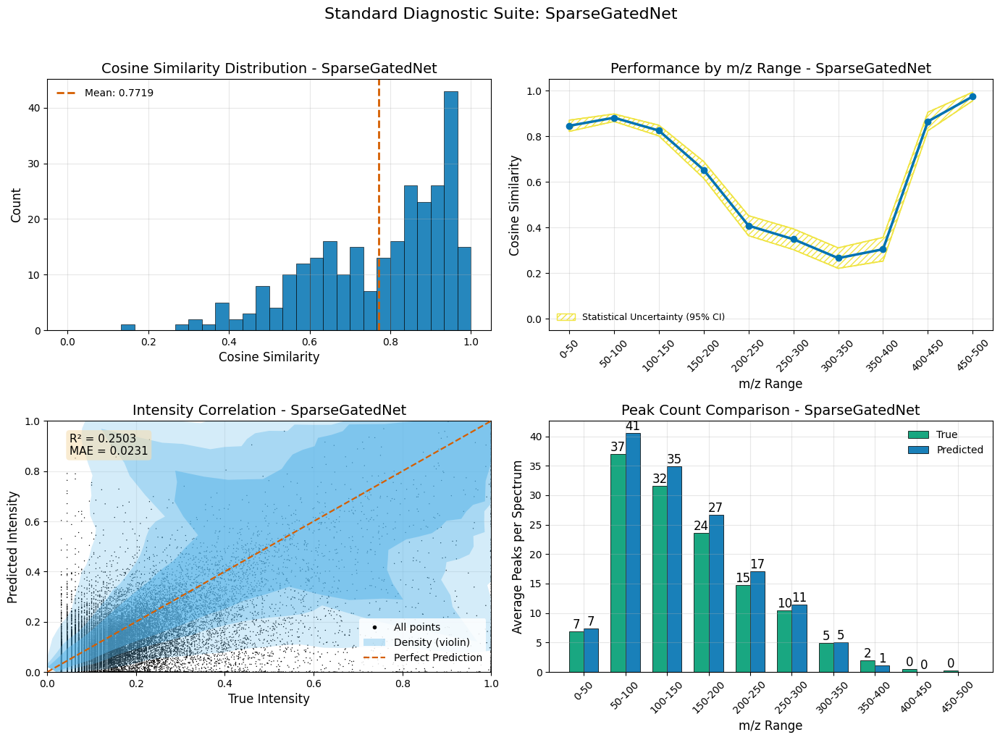


2. Random Spectrum Examples (2x2 Grid)

Selected random examples:
  1. Index 28: Cosine=0.6429, WDP=0.3204
  2. Index 252: Cosine=0.8445, WDP=0.5834
  3. Index 213: Cosine=0.8132, WDP=0.6913
  4. Index 12: Cosine=0.6182, WDP=0.1684


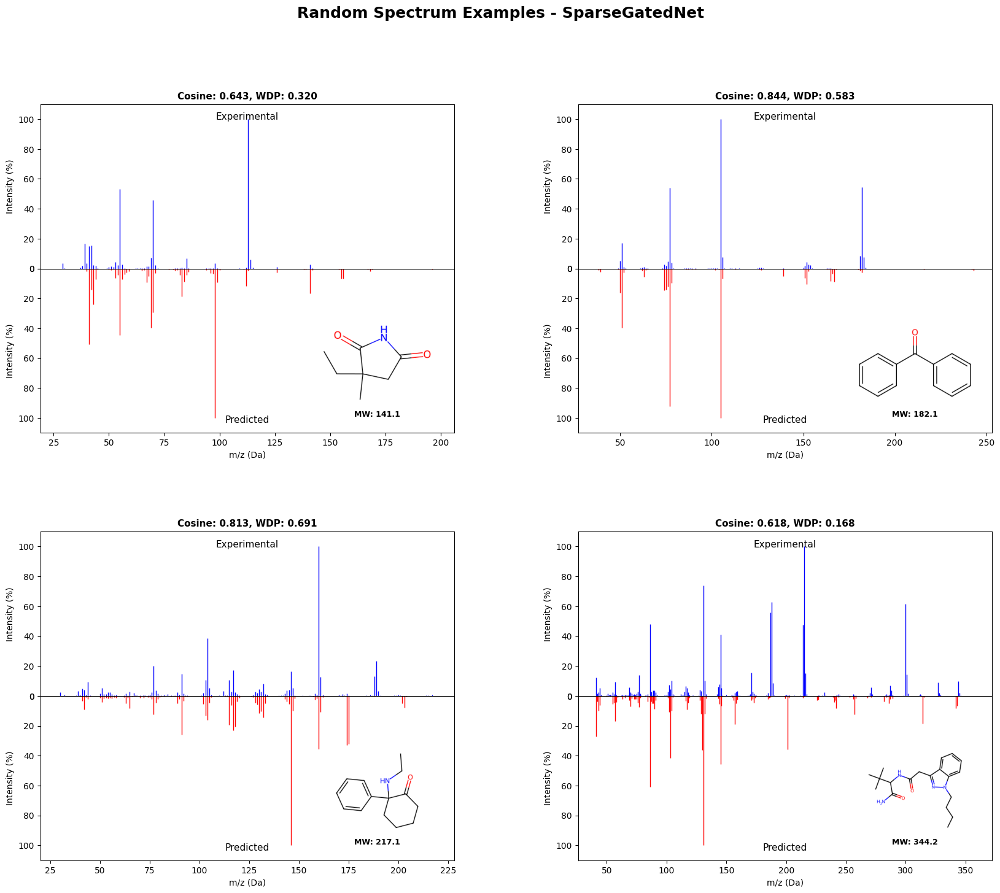


3. Deep Learning Training History


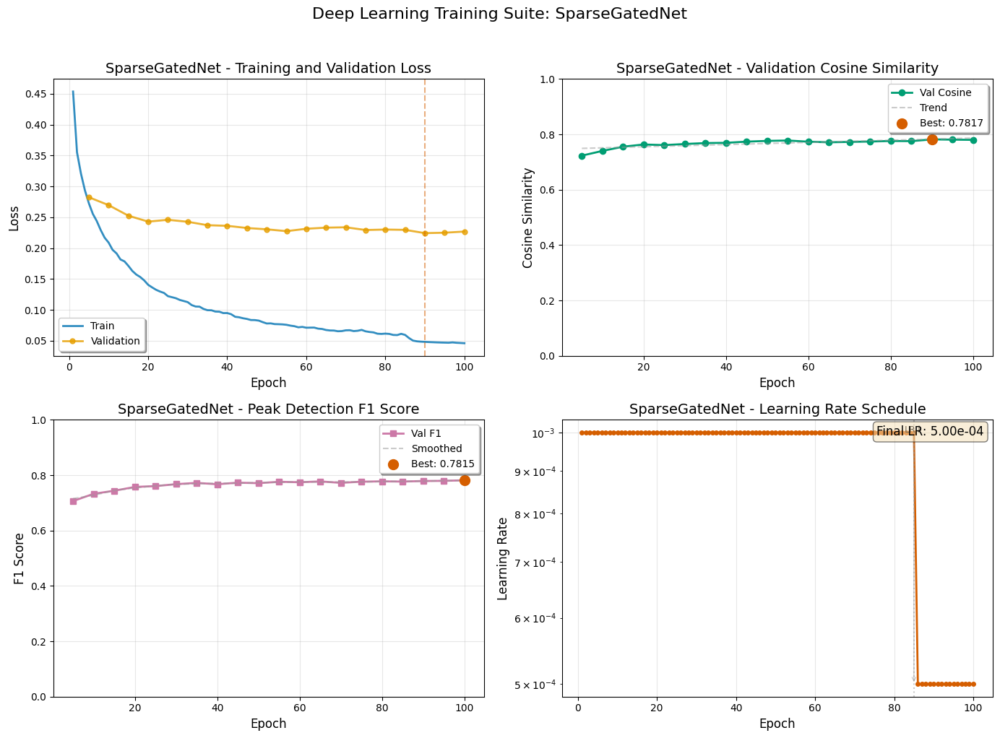


SparseGatedNet evaluation complete!


In [20]:
class SparseGatingLayer(nn.Module):
    """Gating layer for sparse predictions"""
    def __init__(self, input_dim: int, gate_hidden: int, temperature: float = 1.0):
        super().__init__()
        self.temperature = temperature
        
        self.gate_net = nn.Sequential(
            nn.Linear(input_dim, gate_hidden),
            nn.ReLU(),
            nn.Linear(gate_hidden, input_dim),
            nn.Sigmoid()
        )
        
        self.sparse_path = nn.Sequential(
            nn.Linear(input_dim, input_dim),
            nn.BatchNorm1d(input_dim),
            nn.ReLU(),
            nn.Dropout(0.1)
        )
        
        self.dense_path = nn.Sequential(
            nn.Linear(input_dim, input_dim),
            nn.BatchNorm1d(input_dim),
            nn.ReLU(),
            nn.Dropout(0.1)
        )
    
    def forward(self, x: torch.Tensor) -> Tuple[torch.Tensor, torch.Tensor]:
        gates = self.gate_net(x) / self.temperature
        sparse_out = self.sparse_path(x)
        dense_out = self.dense_path(x)
        output = gates * dense_out + (1 - gates) * sparse_out
        return output, gates

class SparseGatedNet(BaseModel):
    def __init__(self, input_dim: int, output_dim: int, config: Dict):
        super().__init__(input_dim, output_dim)
        
        hidden_dims = config['hidden_dims']
        gate_hidden = config['gate_hidden']
        temperature = config['gate_temperature']
        
        self.input_proj = nn.Linear(input_dim, hidden_dims[0])
        self.input_bn = nn.BatchNorm1d(hidden_dims[0])
        
        self.gated_layers = nn.ModuleList()
        for i in range(len(hidden_dims) - 1):
            self.gated_layers.append(
                SparseGatingLayer(hidden_dims[i], gate_hidden, temperature)
            )
        
        self.transitions = nn.ModuleList()
        for i in range(len(hidden_dims) - 1):
            self.transitions.append(
                nn.Linear(hidden_dims[i], hidden_dims[i+1])
            )
        
        self.output_sparse = nn.Linear(hidden_dims[-1], output_dim)
        self.output_dense = nn.Linear(hidden_dims[-1], output_dim)
        self.output_gate = nn.Sequential(
            nn.Linear(hidden_dims[-1], output_dim),
            nn.Sigmoid()
        )
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.input_proj(x)
        x = self.input_bn(x)
        x = F.relu(x)
        
        for gated_layer, transition in zip(self.gated_layers, self.transitions):
            x, _ = gated_layer(x)
            x = transition(x)
            x = F.relu(x)
        
        sparse_pred = F.relu(self.output_sparse(x))
        dense_pred = F.relu(self.output_dense(x))
        output_gates = self.output_gate(x)
        
        output = output_gates * dense_pred + (1 - output_gates) * sparse_pred * 0.1
        
        return output

# Train and evaluate SparseGatedNet with standard visualizations
if len(X_train) > 0:
    results_sparse_gated = train_and_evaluate_model(SparseGatedNet, 'SparseGatedNet')

## 21. RegionalExpertNet Architecture

A Mixture-of-Experts over m/z regions. Each expert predicts only a local slice (with small overlaps), and a router assigns soft weights.

- Regions: $\{[s_r,e_r)\}$ with overlap $\delta$.
- Router: $\,\boldsymbol{\pi}=\mathrm{Softmax}(\mathrm{Router}(\mathbf{x}))\in\mathbb{R}^{R}$.
- Expert $r$ outputs $\hat{\mathbf{y}}^{(r)}\in\mathbb{R}^{(e_r-s_r+2\delta)}$.

Reconstruction
$$
\hat y_b = \sum_{r: b\in[s_r-\delta,e_r+\delta)} \pi_r\; \hat y^{(r)}_{\text{aligned}(b)}.
$$

Motivation: fragmentation patterns differ across m/z; specialist experts capture regional inductive biases.

```mermaid
flowchart TD
  X["Input x"] --> R["Router → π"]
  X --> E1["Expert 1 (region)"]
  X --> E2["Expert 2 (region)"]
  X --> Ek["Expert R (region)"]
  E1 --> Al1["Align slice"]
  E2 --> Al2["Align slice"]
  Ek --> Alk["Align slice"]
  Al1 --> Sum
  Al2 --> Sum
  Alk --> Sum
  R --> Sum
  Sum --> O["ŷ"]
```


TRAINING REGIONALEXPERTNET
Total parameters: 22,748,253

Training RegionalExpertNet...


Epoch 5/100: 100%|██████████| 34/34 [00:00<00:00, 85.03it/s, loss=0.3016, cos=0.2930]



RegionalExpertNet Performance:
  Cosine Similarity: 0.6892
  MSE: 0.0092, R²: 0.0951
  Peak Detection - Precision: 0.7766, Recall: 0.6488, F1: 0.7070
  Sparsity - True: 0.740, Pred: 0.790
  New best model saved! (Cosine: 0.6892)


Epoch 10/100: 100%|██████████| 34/34 [00:00<00:00, 87.30it/s, loss=0.1939, cos=0.1883]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7172
  MSE: 0.0086, R²: 0.1456
  Peak Detection - Precision: 0.7704, Recall: 0.6958, F1: 0.7312
  Sparsity - True: 0.740, Pred: 0.772
  New best model saved! (Cosine: 0.7172)


Epoch 15/100: 100%|██████████| 34/34 [00:00<00:00, 88.72it/s, loss=0.1825, cos=0.1779]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7480
  MSE: 0.0075, R²: 0.2000
  Peak Detection - Precision: 0.7971, Recall: 0.7087, F1: 0.7503
  Sparsity - True: 0.740, Pred: 0.774
  New best model saved! (Cosine: 0.7480)


Epoch 20/100: 100%|██████████| 34/34 [00:00<00:00, 86.36it/s, loss=0.1304, cos=0.1265]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7587
  MSE: 0.0071, R²: 0.2279
  Peak Detection - Precision: 0.7849, Recall: 0.7260, F1: 0.7543
  Sparsity - True: 0.740, Pred: 0.763
  New best model saved! (Cosine: 0.7587)


Epoch 25/100: 100%|██████████| 34/34 [00:00<00:00, 86.86it/s, loss=0.1214, cos=0.1183]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7578
  MSE: 0.0070, R²: 0.2306
  Peak Detection - Precision: 0.7991, Recall: 0.7222, F1: 0.7588
  Sparsity - True: 0.740, Pred: 0.770


Epoch 30/100: 100%|██████████| 34/34 [00:00<00:00, 87.90it/s, loss=0.0915, cos=0.0889]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7687
  MSE: 0.0069, R²: 0.2363
  Peak Detection - Precision: 0.7952, Recall: 0.7319, F1: 0.7622
  Sparsity - True: 0.740, Pred: 0.765
  New best model saved! (Cosine: 0.7687)


Epoch 35/100: 100%|██████████| 34/34 [00:00<00:00, 88.77it/s, loss=0.0818, cos=0.0798]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7719
  MSE: 0.0069, R²: 0.2330
  Peak Detection - Precision: 0.8021, Recall: 0.7319, F1: 0.7654
  Sparsity - True: 0.740, Pred: 0.768
  New best model saved! (Cosine: 0.7719)


Epoch 40/100: 100%|██████████| 34/34 [00:00<00:00, 90.06it/s, loss=0.0810, cos=0.0790]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7747
  MSE: 0.0068, R²: 0.2348
  Peak Detection - Precision: 0.8011, Recall: 0.7347, F1: 0.7664
  Sparsity - True: 0.740, Pred: 0.765
  New best model saved! (Cosine: 0.7747)


Epoch 45/100: 100%|██████████| 34/34 [00:00<00:00, 88.73it/s, loss=0.0671, cos=0.0654]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7737
  MSE: 0.0068, R²: 0.2305
  Peak Detection - Precision: 0.7988, Recall: 0.7366, F1: 0.7664
  Sparsity - True: 0.740, Pred: 0.765


Epoch 50/100: 100%|██████████| 34/34 [00:00<00:00, 82.96it/s, loss=0.0611, cos=0.0592]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7788
  MSE: 0.0067, R²: 0.2374
  Peak Detection - Precision: 0.8012, Recall: 0.7421, F1: 0.7706
  Sparsity - True: 0.740, Pred: 0.763
  New best model saved! (Cosine: 0.7788)


Epoch 55/100: 100%|██████████| 34/34 [00:00<00:00, 88.69it/s, loss=0.0764, cos=0.0744]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7760
  MSE: 0.0067, R²: 0.2285
  Peak Detection - Precision: 0.8078, Recall: 0.7344, F1: 0.7694
  Sparsity - True: 0.740, Pred: 0.767


Epoch 60/100: 100%|██████████| 34/34 [00:00<00:00, 85.03it/s, loss=0.0625, cos=0.0607]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7759
  MSE: 0.0068, R²: 0.2239
  Peak Detection - Precision: 0.8074, Recall: 0.7357, F1: 0.7699
  Sparsity - True: 0.740, Pred: 0.767


Epoch 65/100: 100%|██████████| 34/34 [00:00<00:00, 86.38it/s, loss=0.0603, cos=0.0588]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7762
  MSE: 0.0067, R²: 0.2382
  Peak Detection - Precision: 0.7984, Recall: 0.7440, F1: 0.7702
  Sparsity - True: 0.740, Pred: 0.763


Epoch 70/100: 100%|██████████| 34/34 [00:00<00:00, 88.76it/s, loss=0.0711, cos=0.0693]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7788
  MSE: 0.0067, R²: 0.2276
  Peak Detection - Precision: 0.8071, Recall: 0.7391, F1: 0.7716
  Sparsity - True: 0.740, Pred: 0.767
  New best model saved! (Cosine: 0.7788)


Epoch 75/100: 100%|██████████| 34/34 [00:00<00:00, 83.11it/s, loss=0.0607, cos=0.0585]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7799
  MSE: 0.0070, R²: 0.2089
  Peak Detection - Precision: 0.8053, Recall: 0.7422, F1: 0.7724
  Sparsity - True: 0.740, Pred: 0.766
  New best model saved! (Cosine: 0.7799)


Epoch 80/100: 100%|██████████| 34/34 [00:00<00:00, 85.00it/s, loss=0.0560, cos=0.0545]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7764
  MSE: 0.0069, R²: 0.2163
  Peak Detection - Precision: 0.8118, Recall: 0.7386, F1: 0.7735
  Sparsity - True: 0.740, Pred: 0.767


Epoch 85/100: 100%|██████████| 34/34 [00:00<00:00, 82.64it/s, loss=0.0522, cos=0.0504]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7803
  MSE: 0.0067, R²: 0.2386
  Peak Detection - Precision: 0.8088, Recall: 0.7459, F1: 0.7761
  Sparsity - True: 0.740, Pred: 0.765
  New best model saved! (Cosine: 0.7803)


Epoch 90/100: 100%|██████████| 34/34 [00:00<00:00, 86.35it/s, loss=0.0479, cos=0.0467]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7814
  MSE: 0.0068, R²: 0.2362
  Peak Detection - Precision: 0.8045, Recall: 0.7512, F1: 0.7770
  Sparsity - True: 0.740, Pred: 0.762
  New best model saved! (Cosine: 0.7814)


Epoch 95/100: 100%|██████████| 34/34 [00:00<00:00, 87.24it/s, loss=0.0586, cos=0.0568]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7820
  MSE: 0.0067, R²: 0.2390
  Peak Detection - Precision: 0.8075, Recall: 0.7444, F1: 0.7746
  Sparsity - True: 0.740, Pred: 0.764
  New best model saved! (Cosine: 0.7820)


Epoch 100/100: 100%|██████████| 34/34 [00:00<00:00, 86.93it/s, loss=0.0485, cos=0.0472]



RegionalExpertNet Performance:
  Cosine Similarity: 0.7835
  MSE: 0.0067, R²: 0.2371
  Peak Detection - Precision: 0.8016, Recall: 0.7512, F1: 0.7756
  Sparsity - True: 0.740, Pred: 0.760
  New best model saved! (Cosine: 0.7835)

Training complete. Best validation cosine: 0.7835

RegionalExpertNet Performance:
  Cosine Similarity: 0.7662
  MSE: 0.0050, R²: 0.2275
  Peak Detection - Precision: 0.8164, Recall: 0.7569, F1: 0.7855
  Sparsity - True: 0.736, Pred: 0.760

------------------------------------------------------------
GENERATING STANDARD VISUALIZATIONS
------------------------------------------------------------

1. Standard 2x2 Diagnostic Plots


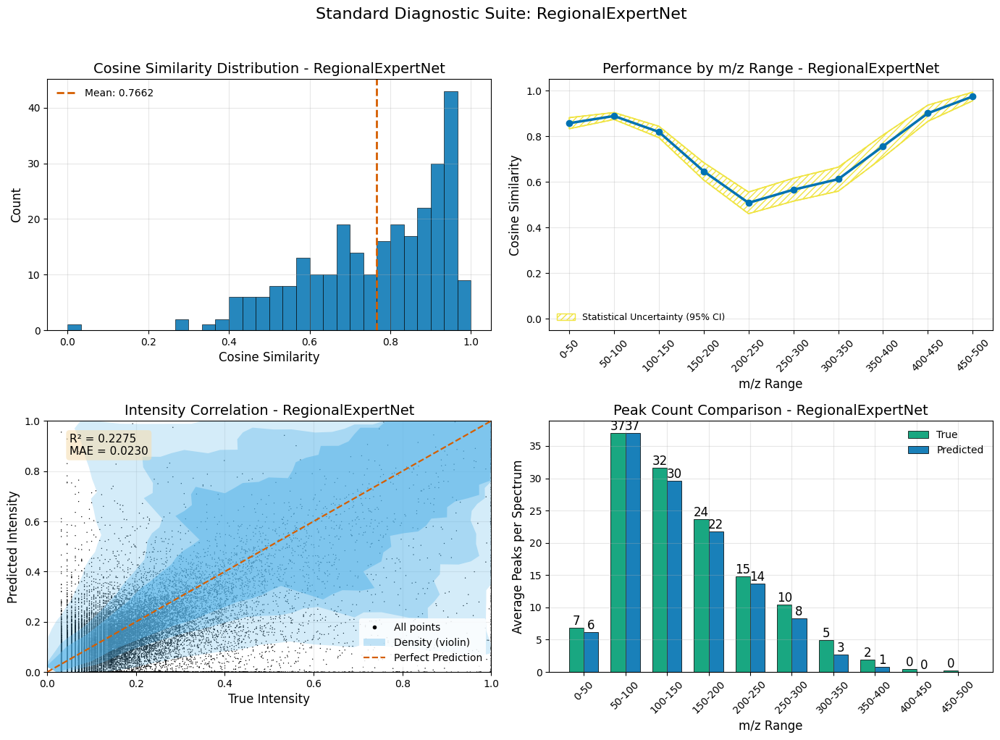


2. Random Spectrum Examples (2x2 Grid)

Selected random examples:
  1. Index 198: Cosine=0.9468, WDP=1.0611
  2. Index 207: Cosine=0.7804, WDP=0.4707
  3. Index 42: Cosine=0.7859, WDP=0.5187
  4. Index 156: Cosine=0.9426, WDP=0.8932


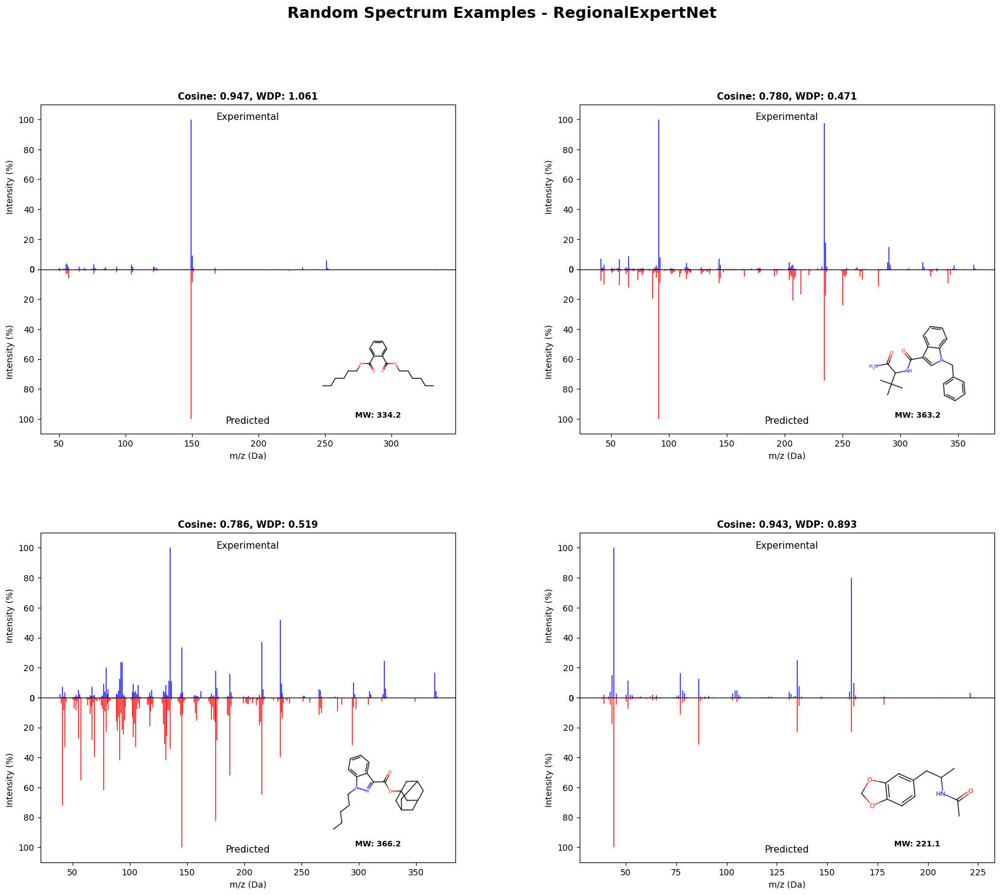


3. Deep Learning Training History


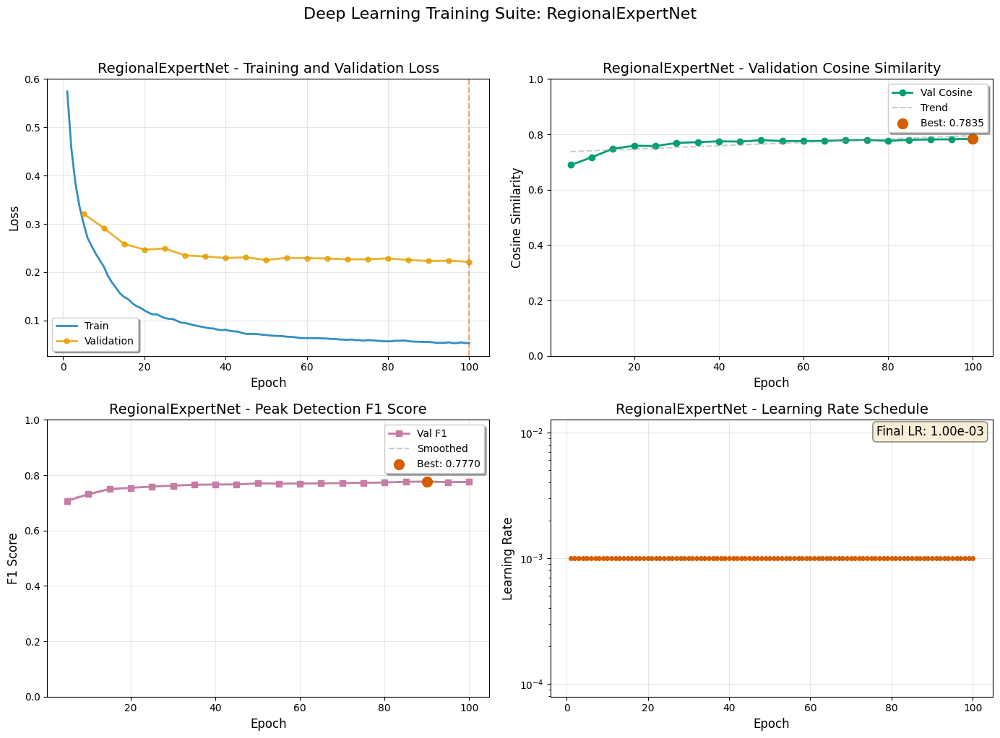


RegionalExpertNet evaluation complete!


In [21]:
class RegionalExpert(nn.Module):
    """Expert network for a specific m/z region"""
    def __init__(self, input_dim: int, output_dim: int, hidden_dims: List[int]):
        super().__init__()
        
        layers = []
        dims = [input_dim] + hidden_dims
        
        for i in range(len(hidden_dims)):
            layers.extend([
                nn.Linear(dims[i], dims[i+1]),
                nn.BatchNorm1d(dims[i+1]),
                nn.ReLU(),
                nn.Dropout(0.1)
            ])
        
        layers.append(nn.Linear(hidden_dims[-1], output_dim))
        layers.append(nn.ReLU())
        
        self.network = nn.Sequential(*layers)
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        return self.network(x)

class RegionalExpertNet(BaseModel):
    def __init__(self, input_dim: int, output_dim: int, config: Dict):
        super().__init__(input_dim, output_dim)
        
        self.expert_regions = config['expert_regions']
        expert_hidden = config['expert_hidden']
        router_hidden = config['router_hidden']
        self.overlap_bins = config['overlap_bins']
        
        # Create experts
        self.experts = nn.ModuleList()
        for start, end in self.expert_regions:
            expert_output_dim = end - start + 2 * self.overlap_bins
            self.experts.append(
                RegionalExpert(input_dim, expert_output_dim, expert_hidden)
            )
        
        # Router network
        self.router = nn.Sequential(
            nn.Linear(input_dim, router_hidden),
            nn.ReLU(),
            nn.Linear(router_hidden, len(self.expert_regions)),
            nn.Softmax(dim=1)
        )
        
        # Global features
        self.global_features = nn.Sequential(
            nn.Linear(input_dim, router_hidden),
            nn.BatchNorm1d(router_hidden),
            nn.ReLU()
        )
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        routing_weights = self.router(x)
        global_feat = self.global_features(x)
        
        output = torch.zeros(x.shape[0], self.output_dim).to(x.device)
        
        for i, ((start, end), expert) in enumerate(zip(self.expert_regions, self.experts)):
            expert_pred = expert(x)
            
            actual_start = max(0, start - self.overlap_bins)
            actual_end = min(self.output_dim, end + self.overlap_bins)
            
            region_size = actual_end - actual_start
            if expert_pred.shape[1] >= region_size:
                weighted_pred = expert_pred[:, :region_size] * routing_weights[:, i:i+1]
                output[:, actual_start:actual_end] += weighted_pred
        
        return output

# Train and evaluate RegionalExpertNet with standard visualizations
if len(X_train) > 0:
    results_regional = train_and_evaluate_model(RegionalExpertNet, 'RegionalExpertNet')

## 22. HierarchicalPredictionNet Architecture

Two-stage prediction: presence then intensity (conditional).

1. Presence (logits) $\mathbf{z}=\mathrm{MLP}_{\mathrm{pres}}(\mathbf{x})$, $\mathbf{p}=\sigma(\mathbf{z})$.
2. Conditional intensity given presence: concatenate $[\mathbf{x};\mathbf{p}]$ into intensity MLP.
3. Calibration: a sigmoid head rescales intensities.

$$
\hat{\mathbf{y}}=\mathrm{ReLU}(\mathrm{MLP}_{\mathrm{int}}([\mathbf{x};\mathbf{p}]))\odot \mathbf{p}\odot \mathrm{Calib}(\cdot).
$$

Training losses
$$
\mathcal{L}=\lambda_{\mathrm{mse}}\mathcal{L}_{\mathrm{mse}}+\lambda_{\mathrm{cos}}\mathcal{L}_{\mathrm{cos}}+\lambda_{\mathrm{sp}}\mathcal{L}_{\mathrm{sp}}+\lambda_{\mathrm{pres}}\mathcal{L}_{\mathrm{pres}}(\mathbf{z},\mathbb{1}[y>\tau]).
$$

Benefits: aligns with the binary nature of many bins (peak/no-peak) and reduces regression burden on absent peaks.

```mermaid
flowchart TD
  X["Input x"] --> PNet["Presence MLP → logits z → σ → p"]
  X -->|concat with p| Cat["[x; p]"]
  Cat --> INet["Intensity MLP → ReLU"]
  INet --> Cal["Calibration σ"]
  PNet --> Gate
  Cal --> Mult1
  INet --> Mult1
  PNet --> Mult1
  Mult1["elementwise ⊙ with p and calib"] --> O["ŷ"]
```


TRAINING HIERARCHICALPREDICTIONNET
Total parameters: 8,307,692

Training HierarchicalPredictionNet...


Epoch 5/100: 100%|██████████| 34/34 [00:00<00:00, 188.19it/s, loss=0.3698, cos=0.2560]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7373
  MSE: 0.0079, R²: 0.1441
  Peak Detection - Precision: 0.5695, Recall: 0.9299, F1: 0.7064
  Sparsity - True: 0.740, Pred: 0.591
  New best model saved! (Cosine: 0.7373)


Epoch 10/100: 100%|██████████| 34/34 [00:00<00:00, 178.59it/s, loss=0.3329, cos=0.2118]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7526
  MSE: 0.0075, R²: 0.1608
  Peak Detection - Precision: 0.5938, Recall: 0.9311, F1: 0.7251
  Sparsity - True: 0.740, Pred: 0.607
  New best model saved! (Cosine: 0.7526)


Epoch 15/100: 100%|██████████| 34/34 [00:00<00:00, 169.96it/s, loss=0.2681, cos=0.1669]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7633
  MSE: 0.0075, R²: 0.1433
  Peak Detection - Precision: 0.6155, Recall: 0.9235, F1: 0.7387
  Sparsity - True: 0.740, Pred: 0.624
  New best model saved! (Cosine: 0.7633)


Epoch 20/100: 100%|██████████| 34/34 [00:00<00:00, 169.72it/s, loss=0.2365, cos=0.1438]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7733
  MSE: 0.0073, R²: 0.1608
  Peak Detection - Precision: 0.6236, Recall: 0.9233, F1: 0.7444
  Sparsity - True: 0.740, Pred: 0.632
  New best model saved! (Cosine: 0.7733)


Epoch 25/100: 100%|██████████| 34/34 [00:00<00:00, 169.77it/s, loss=0.2259, cos=0.1336]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7745
  MSE: 0.0072, R²: 0.1537
  Peak Detection - Precision: 0.6310, Recall: 0.9220, F1: 0.7493
  Sparsity - True: 0.740, Pred: 0.637
  New best model saved! (Cosine: 0.7745)


Epoch 30/100: 100%|██████████| 34/34 [00:00<00:00, 170.01it/s, loss=0.2260, cos=0.1327]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7755
  MSE: 0.0071, R²: 0.1686
  Peak Detection - Precision: 0.6427, Recall: 0.9200, F1: 0.7567
  Sparsity - True: 0.740, Pred: 0.644
  New best model saved! (Cosine: 0.7755)


Epoch 35/100: 100%|██████████| 34/34 [00:00<00:00, 169.91it/s, loss=0.2126, cos=0.1183]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7753
  MSE: 0.0071, R²: 0.1603
  Peak Detection - Precision: 0.6383, Recall: 0.9197, F1: 0.7536
  Sparsity - True: 0.740, Pred: 0.643


Epoch 40/100: 100%|██████████| 34/34 [00:00<00:00, 185.44it/s, loss=0.1736, cos=0.1011]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7808
  MSE: 0.0070, R²: 0.1694
  Peak Detection - Precision: 0.6504, Recall: 0.9164, F1: 0.7608
  Sparsity - True: 0.740, Pred: 0.650
  New best model saved! (Cosine: 0.7808)


Epoch 45/100: 100%|██████████| 34/34 [00:00<00:00, 165.22it/s, loss=0.1668, cos=0.0927]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7819
  MSE: 0.0069, R²: 0.1662
  Peak Detection - Precision: 0.6606, Recall: 0.9106, F1: 0.7657
  Sparsity - True: 0.740, Pred: 0.660
  New best model saved! (Cosine: 0.7819)


Epoch 50/100: 100%|██████████| 34/34 [00:00<00:00, 169.73it/s, loss=0.1748, cos=0.1010]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7780
  MSE: 0.0070, R²: 0.1548
  Peak Detection - Precision: 0.6631, Recall: 0.9141, F1: 0.7687
  Sparsity - True: 0.740, Pred: 0.657


Epoch 55/100: 100%|██████████| 34/34 [00:00<00:00, 180.59it/s, loss=0.1580, cos=0.0908]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7803
  MSE: 0.0069, R²: 0.1609
  Peak Detection - Precision: 0.6759, Recall: 0.9062, F1: 0.7743
  Sparsity - True: 0.740, Pred: 0.665


Epoch 60/100: 100%|██████████| 34/34 [00:00<00:00, 182.23it/s, loss=0.1497, cos=0.0895]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7807
  MSE: 0.0069, R²: 0.1642
  Peak Detection - Precision: 0.6685, Recall: 0.9115, F1: 0.7713
  Sparsity - True: 0.740, Pred: 0.662


Epoch 65/100: 100%|██████████| 34/34 [00:00<00:00, 188.88it/s, loss=0.1676, cos=0.0884]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7842
  MSE: 0.0068, R²: 0.1646
  Peak Detection - Precision: 0.6801, Recall: 0.9040, F1: 0.7762
  Sparsity - True: 0.740, Pred: 0.671
  New best model saved! (Cosine: 0.7842)


Epoch 70/100: 100%|██████████| 34/34 [00:00<00:00, 176.05it/s, loss=0.1427, cos=0.0753]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7792
  MSE: 0.0068, R²: 0.1613
  Peak Detection - Precision: 0.6788, Recall: 0.9030, F1: 0.7750
  Sparsity - True: 0.740, Pred: 0.669


Epoch 75/100: 100%|██████████| 34/34 [00:00<00:00, 191.87it/s, loss=0.1477, cos=0.0772]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7829
  MSE: 0.0068, R²: 0.1714
  Peak Detection - Precision: 0.6890, Recall: 0.8997, F1: 0.7804
  Sparsity - True: 0.740, Pred: 0.676


Epoch 80/100: 100%|██████████| 34/34 [00:00<00:00, 185.15it/s, loss=0.1316, cos=0.0739]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7829
  MSE: 0.0068, R²: 0.1700
  Peak Detection - Precision: 0.6830, Recall: 0.9053, F1: 0.7786
  Sparsity - True: 0.740, Pred: 0.671


Epoch 85/100: 100%|██████████| 34/34 [00:00<00:00, 185.37it/s, loss=0.1355, cos=0.0702]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7821
  MSE: 0.0068, R²: 0.1678
  Peak Detection - Precision: 0.6888, Recall: 0.9010, F1: 0.7807
  Sparsity - True: 0.740, Pred: 0.676


Epoch 90/100: 100%|██████████| 34/34 [00:00<00:00, 180.59it/s, loss=0.1341, cos=0.0751]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7828
  MSE: 0.0068, R²: 0.1686
  Peak Detection - Precision: 0.6980, Recall: 0.8959, F1: 0.7846
  Sparsity - True: 0.740, Pred: 0.680


Epoch 95/100: 100%|██████████| 34/34 [00:00<00:00, 185.50it/s, loss=0.1355, cos=0.0757]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7828
  MSE: 0.0068, R²: 0.1743
  Peak Detection - Precision: 0.6969, Recall: 0.8941, F1: 0.7833
  Sparsity - True: 0.740, Pred: 0.680


Epoch 100/100: 100%|██████████| 34/34 [00:00<00:00, 185.56it/s, loss=0.1117, cos=0.0605]



HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7868
  MSE: 0.0067, R²: 0.1799
  Peak Detection - Precision: 0.6990, Recall: 0.8973, F1: 0.7859
  Sparsity - True: 0.740, Pred: 0.682
  New best model saved! (Cosine: 0.7868)

Training complete. Best validation cosine: 0.7868

HierarchicalPredictionNet Performance:
  Cosine Similarity: 0.7768
  MSE: 0.0049, R²: -0.3517
  Peak Detection - Precision: 0.7047, Recall: 0.9053, F1: 0.7925
  Sparsity - True: 0.736, Pred: 0.679

------------------------------------------------------------
GENERATING STANDARD VISUALIZATIONS
------------------------------------------------------------

1. Standard 2x2 Diagnostic Plots


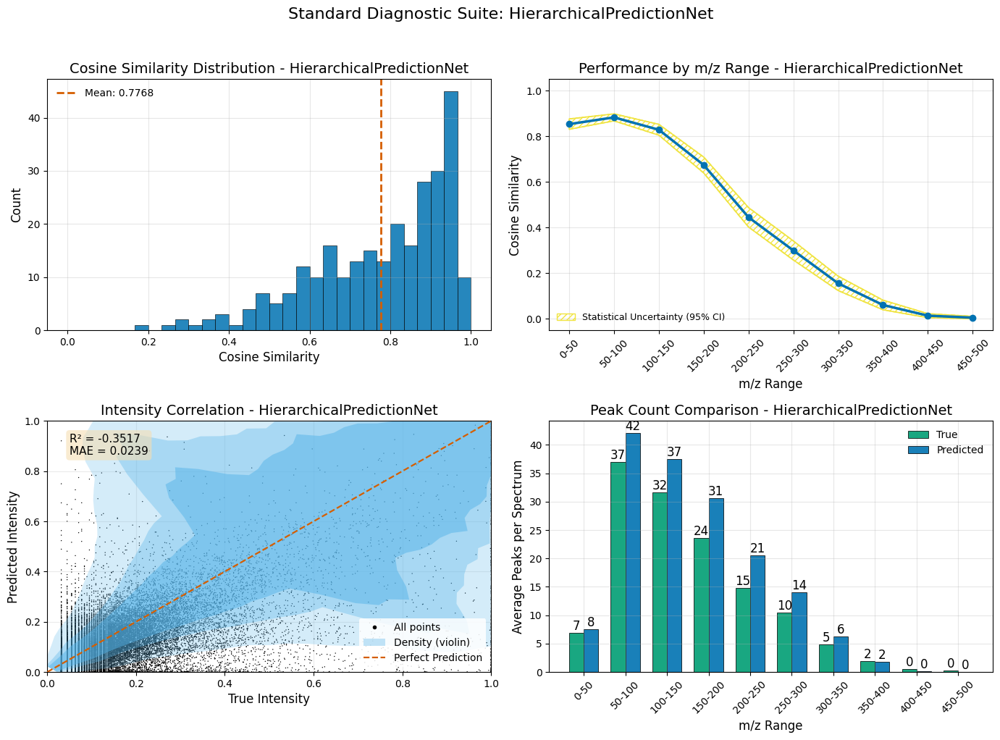


2. Random Spectrum Examples (2x2 Grid)

Selected random examples:
  1. Index 53: Cosine=0.8779, WDP=0.5791
  2. Index 225: Cosine=0.9841, WDP=0.9381
  3. Index 170: Cosine=0.7431, WDP=0.2492
  4. Index 15: Cosine=0.9464, WDP=1.0174


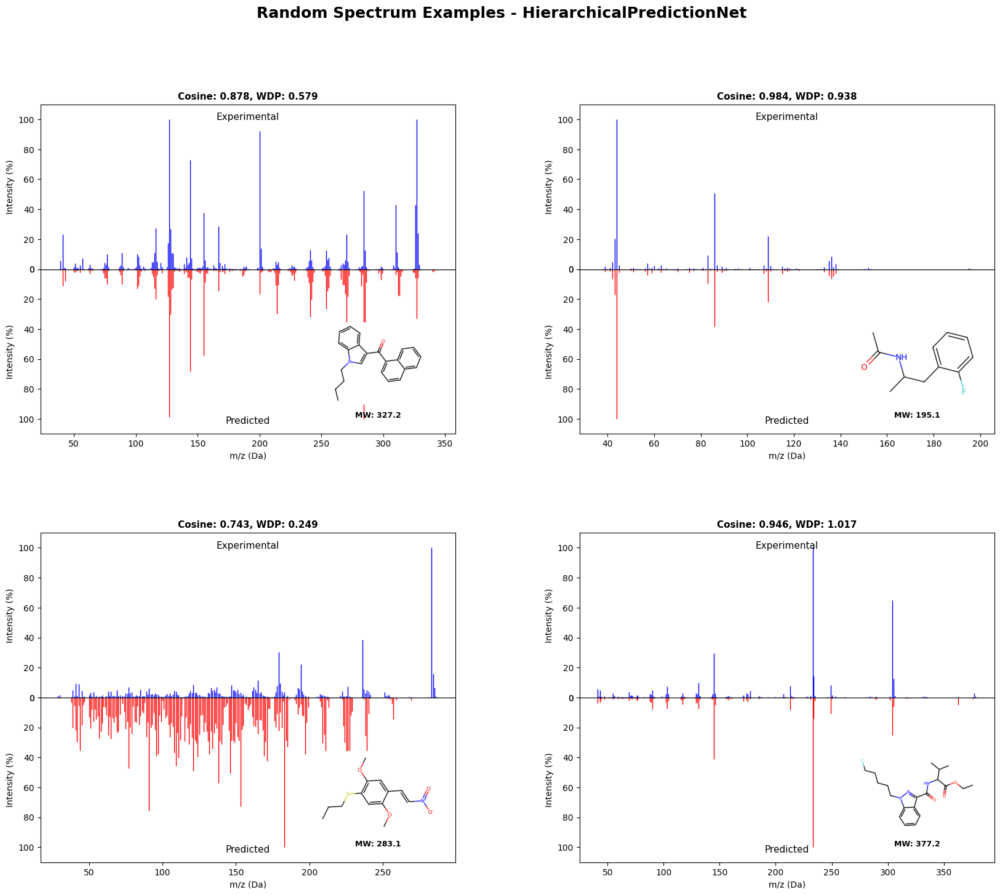


3. Deep Learning Training History


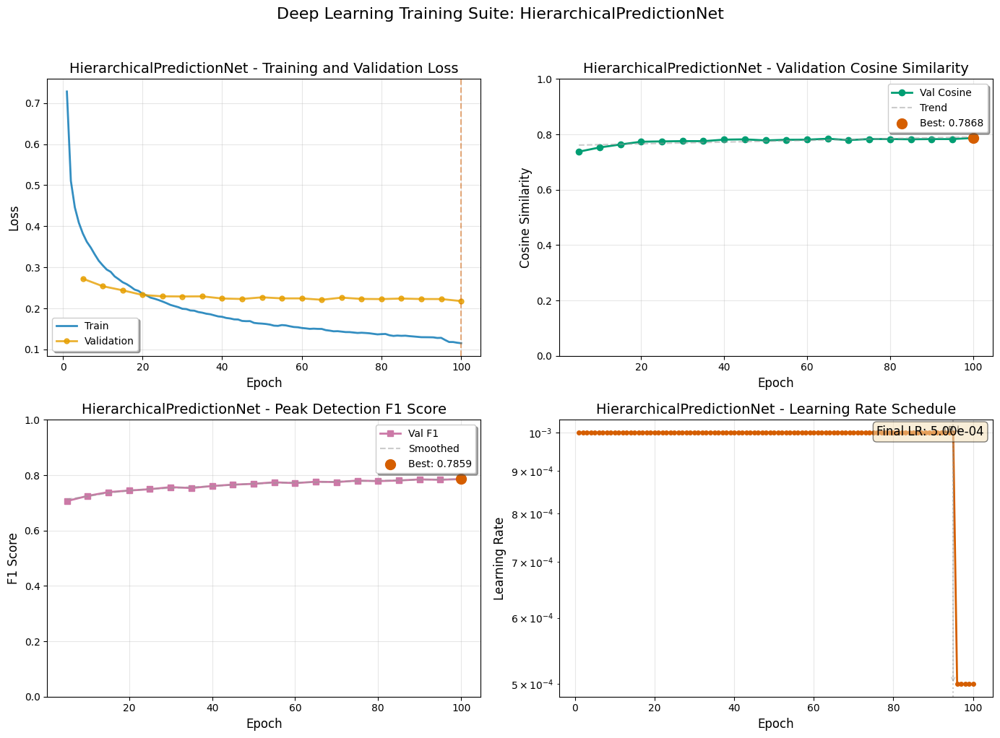


HierarchicalPredictionNet evaluation complete!


In [22]:
class HierarchicalPredictionNet(BaseModel):
    def __init__(self, input_dim: int, output_dim: int, config: Dict):
        super().__init__(input_dim, output_dim)
        
        presence_hidden = config['presence_hidden']
        intensity_hidden = config['intensity_hidden']
        self.presence_threshold = config['presence_threshold']
        conditional_dropout = config['conditional_dropout']
        
        # Stage 1: Presence prediction
        presence_layers = []
        dims = [input_dim] + presence_hidden
        
        for i in range(len(presence_hidden)):
            presence_layers.extend([
                nn.Linear(dims[i], dims[i+1]),
                nn.BatchNorm1d(dims[i+1]),
                nn.ReLU(),
                nn.Dropout(0.1)
            ])
        
        presence_layers.append(nn.Linear(presence_hidden[-1], output_dim))
        self.presence_net = nn.Sequential(*presence_layers)
        
        # Stage 2: Intensity prediction (conditioned on presence)
        intensity_input_dim = input_dim + output_dim
        
        intensity_layers = []
        dims = [intensity_input_dim] + intensity_hidden
        
        for i in range(len(intensity_hidden)):
            intensity_layers.extend([
                nn.Linear(dims[i], dims[i+1]),
                nn.BatchNorm1d(dims[i+1]),
                nn.ReLU(),
                nn.Dropout(conditional_dropout)
            ])
        
        intensity_layers.append(nn.Linear(intensity_hidden[-1], output_dim))
        intensity_layers.append(nn.ReLU())
        self.intensity_net = nn.Sequential(*intensity_layers)
        
        # Calibration layer
        self.calibration = nn.Sequential(
            nn.Linear(output_dim, output_dim),
            nn.Sigmoid()
        )
    
    def forward(self, x: torch.Tensor, return_presence: bool = False) -> Union[torch.Tensor, Tuple]:
        # Stage 1: Predict presence
        presence_logits = self.presence_net(x)
        presence_probs = torch.sigmoid(presence_logits)
        
        # Stage 2: Predict intensities conditioned on presence
        conditional_input = torch.cat([x, presence_probs], dim=1)
        intensities = self.intensity_net(conditional_input)
        
        # Calibrate final output
        calibration_weights = self.calibration(intensities)
        
        # Combine
        output = intensities * presence_probs * calibration_weights
        
        if return_presence:
            return output, presence_logits
        return output

# Train and evaluate HierarchicalPredictionNet with standard visualizations
if len(X_train) > 0:
    results_hierarchical = train_and_evaluate_model(HierarchicalPredictionNet, 'HierarchicalPredictionNet')

## 23. Optimized K-Model Ensemble Selection
This section:
1. Performs systematic K-model selection (K=2 to 9) using greedy forward selection with SLSQP weight optimization
2. Measures realistic end-to-end throughput (including model inference)
3. Generates standard visualizations for the optimal K=4 ensemble
4. Prepares the best ensemble for final comparison

The K=4 configuration (HierarchicalPredictionNet, SparseGatedNet, ModularNet, DenseNet) provides the best performance/speed tradeoff.

OPTIMIZED K-MODEL ENSEMBLE SELECTION

  Loading SimpleMLP...
  Loading ResidualNet...
  Loading AttentionNet...
  Loading DenseNet...
  Loading DeepSetNet...
  Loading HybridNet...
  Loading MultiHeadAttentionNet...
  Loading GatedNet...
  Loading EnsembleNet...
  Loading ModularNet...
  Loading SparseGatedNet...
  Loading RegionalExpertNet...
  Loading HierarchicalPredictionNet...
Loaded 13 models: ['SimpleMLP', 'ResidualNet', 'AttentionNet', 'DenseNet', 'DeepSetNet', 'HybridNet', 'MultiHeadAttentionNet', 'GatedNet', 'EnsembleNet', 'ModularNet', 'SparseGatedNet', 'RegionalExpertNet', 'HierarchicalPredictionNet']

Getting predictions on validation and test sets...

K-MODEL ENSEMBLE SELECTION (Greedy + SLSQP)
Selecting best 2 models...
K= 2 | Val: 0.799192 | Test: 0.785470 | Models: ['HierarchicalPredictionNet', 'RegionalExpertNet']
Selecting best 3 models...
K= 3 | Val: 0.804270 | Test: 0.791554 | Models: ['HierarchicalPredictionNet', 'RegionalExpertNet', 'SparseGatedNet']
Selecting be

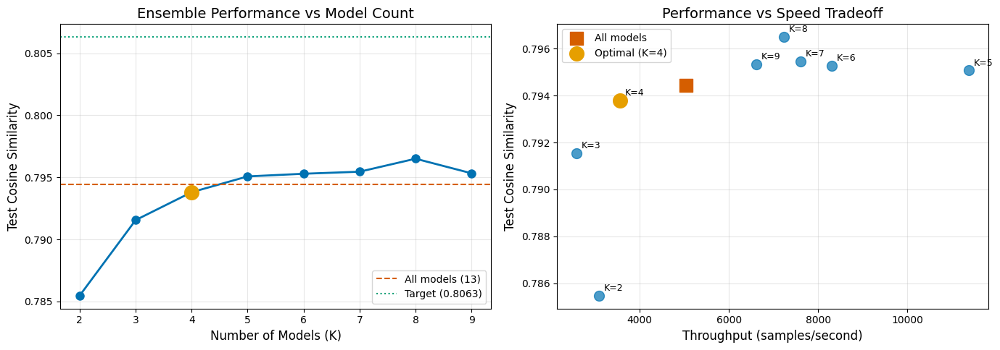


OPTIMAL ENSEMBLE (K=4) DETAILED ANALYSIS
Models: ['HierarchicalPredictionNet', 'RegionalExpertNet', 'SparseGatedNet', 'ModularNet']
Weights:
  HierarchicalPredictionNet     : 0.2500
  RegionalExpertNet             : 0.2500
  SparseGatedNet                : 0.2500
  ModularNet                    : 0.2500

Validation Cosine: 0.805865
Test Cosine:       0.793801
Throughput:        3553.5 samples/s
Gap to target:     0.0125

GENERATING STANDARD VISUALIZATIONS FOR OPTIMAL ENSEMBLE

Ensemble K=4 Performance:
  Cosine Similarity: 0.7938
  MSE: 0.0044, R²: -596506880.0000
  Peak Detection - Precision: 0.8956, Recall: 0.7247, F1: 0.8011
  Sparsity - True: 0.353, Pred: 0.736

1. Standard 2x2 Diagnostic Plots


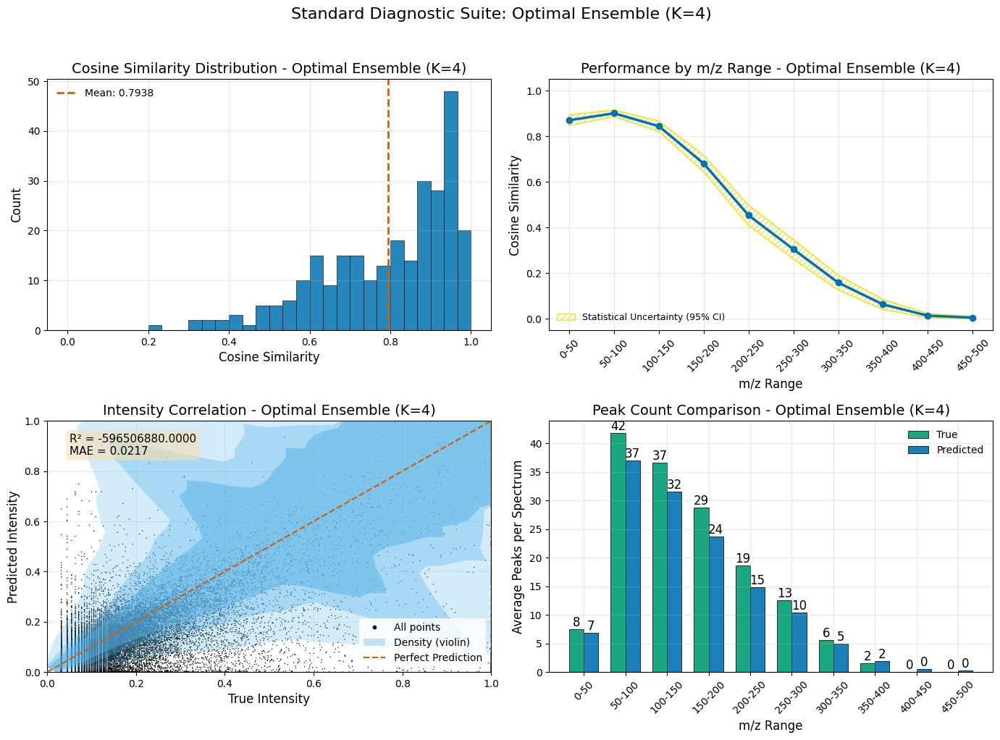


2. Random Spectrum Examples

Selected random examples:
  1. Index 227: Cosine=0.5791, WDP=0.1790
  2. Index 79: Cosine=0.9543, WDP=0.7926
  3. Index 220: Cosine=0.5956, WDP=0.3077
  4. Index 261: Cosine=0.9823, WDP=0.7417


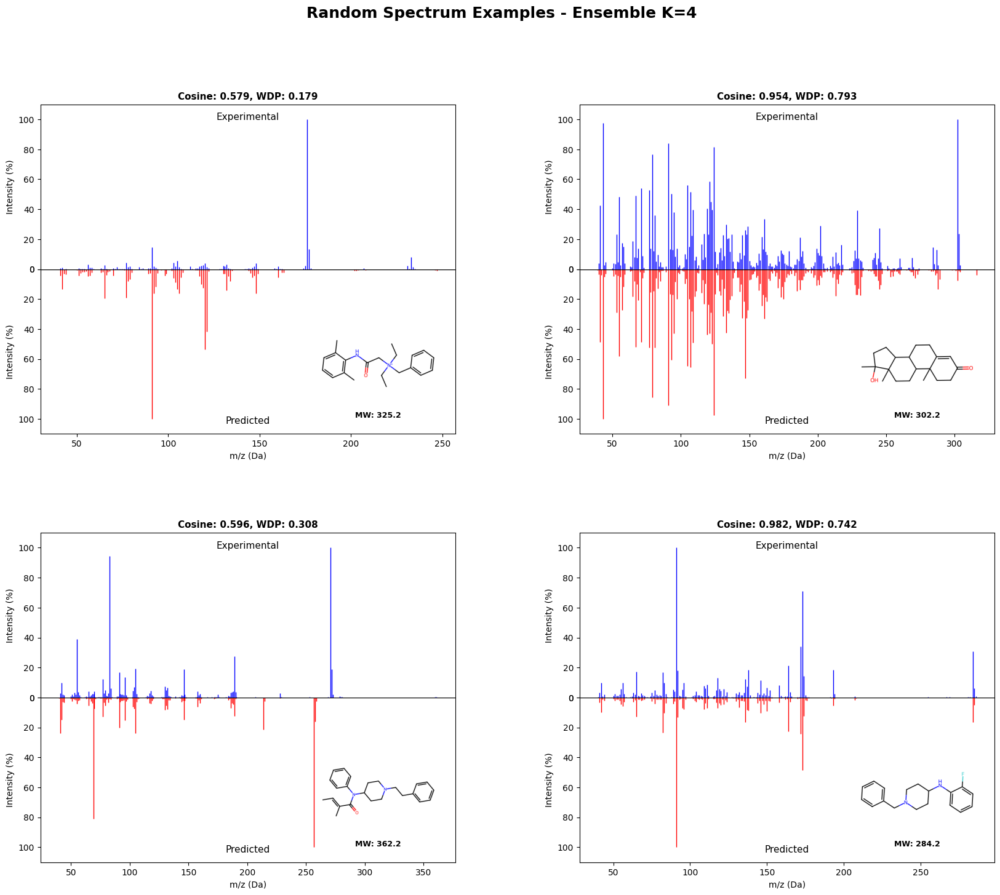


3. Ensemble Performance Summary


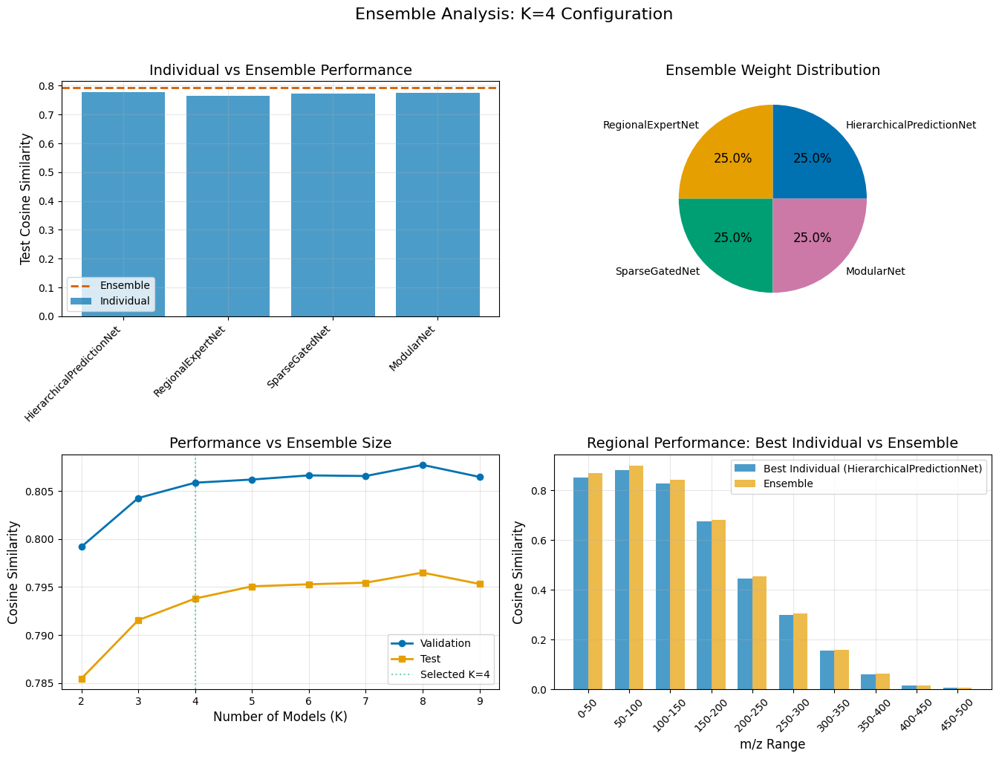


✓ Optimal ensemble configuration saved to ../models/unified_nn\optimal_ensemble_k4.pkl

ENSEMBLE OPTIMIZATION COMPLETE


In [23]:
# ================================================================================
# OPTIMIZED K-MODEL ENSEMBLE SELECTION WITH STANDARD VISUALIZATIONS
# ================================================================================

print("=" * 80)
print("OPTIMIZED K-MODEL ENSEMBLE SELECTION")
print("=" * 80)

import os, time, numpy as np, pandas as pd, torch
from scipy.optimize import minimize
from typing import Dict, List, Tuple

# --------------------------------------------------------------------------------
# Helper Functions
# --------------------------------------------------------------------------------

def collect_trained_models() -> Dict[str, torch.nn.Module]:
    """Load all trained models from disk."""
    print("\nCollecting trained models...")
    trained = {}
    
    model_mappings = [
        ('SimpleMLP', SimpleMLP, 'SimpleMLP'),
        ('ResidualNet', ResidualNet, 'ResidualNet'),
        ('AttentionNet', AttentionNet, 'AttentionNet'),
        ('DenseNet', DenseNet, 'DenseNet'),
        ('DeepSetNet', DeepSetNet, 'DeepSetNet'),
        ('HybridNet', HybridNet, 'HybridNet'),
        ('MultiHeadAttentionNet', MultiHeadAttentionNet, 'MultiHeadAttentionNet'),
        ('GatedNet', GatedNet, 'GatedNet'),
        ('EnsembleNet', EnsembleNet, 'EnsembleNet'),
        ('ModularNet', ModularNet, 'ModularNet'),
        ('SparseGatedNet', SparseGatedNet, 'SparseGatedNet'),
        ('RegionalExpertNet', RegionalExpertNet, 'RegionalExpertNet'),
        ('HierarchicalPredictionNet', HierarchicalPredictionNet, 'HierarchicalPredictionNet'),
    ]
    
    for name, model_class, cfg_key in model_mappings:
        model_path = os.path.join(CONFIG.paths.models_dir, f"{name}_best.pth")
        if os.path.exists(model_path):
            print(f"  Loading {name}...")
            model = model_class(input_dim, output_dim, CONFIG.architectures[cfg_key]).to(DEVICE)
            checkpoint = torch.load(model_path, weights_only=False, map_location=DEVICE)
            model.load_state_dict(checkpoint['model_state_dict'])
            model.eval()
            trained[name] = model
    
    print(f"Loaded {len(trained)} models: {list(trained.keys())}\n")
    return trained

def get_predictions(models: Dict, loader) -> Tuple[Dict[str, np.ndarray], np.ndarray]:
    """Get predictions from all models on a data loader."""
    all_preds = {name: [] for name in models.keys()}
    all_true = []
    
    with torch.no_grad():
        for X_batch, y_batch in loader:
            X_batch = X_batch.to(DEVICE)
            
            for name, model in models.items():
                if model.__class__.__name__ == 'HierarchicalPredictionNet':
                    pred = model(X_batch, return_presence=False)
                else:
                    pred = model(X_batch)
                all_preds[name].append(pred.cpu().numpy())
            
            all_true.append(y_batch.numpy())
    
    # Stack predictions
    for name in models.keys():
        all_preds[name] = np.vstack(all_preds[name])
        all_preds[name] = np.maximum(all_preds[name], 0)  # Ensure non-negative
    
    all_true = np.vstack(all_true)
    return all_preds, all_true

def optimize_weights(preds: Dict[str, np.ndarray], y_true: np.ndarray, 
                    model_names: List[str]) -> np.ndarray:
    """Optimize ensemble weights using SLSQP to maximize cosine similarity."""
    n = len(model_names)
    x0 = np.ones(n) / n
    
    def objective(w):
        w = np.clip(w, 0, None)
        w = w / (w.sum() + 1e-12)
        ensemble_pred = np.zeros_like(y_true)
        for i, name in enumerate(model_names):
            ensemble_pred += w[i] * preds[name]
        cos_sim, _ = metrics_calc.cosine_similarity_batch(y_true, ensemble_pred)
        return -cos_sim
    
    constraints = {'type': 'eq', 'fun': lambda w: np.sum(w) - 1.0}
    bounds = [(0, 1)] * n
    
    result = minimize(objective, x0, method='SLSQP', bounds=bounds, 
                     constraints=constraints, options={'maxiter': 200})
    
    weights = np.clip(result.x, 0, None)
    weights = weights / (weights.sum() + 1e-12)
    return weights

def apply_ensemble(preds: Dict[str, np.ndarray], model_names: List[str], 
                  weights: np.ndarray) -> np.ndarray:
    """Apply weighted ensemble to predictions."""
    ensemble_pred = np.zeros_like(next(iter(preds.values())))
    for i, name in enumerate(model_names):
        ensemble_pred += weights[i] * preds[name]
    return np.maximum(ensemble_pred, 0)

def greedy_k_selection(val_preds: Dict, y_val: np.ndarray, test_preds: Dict, 
                      y_test: np.ndarray, k: int) -> Dict:
    """Greedy forward selection of k models with weight optimization at each step."""
    all_models = list(val_preds.keys())
    selected = []
    remaining = all_models.copy()
    
    for step in range(k):
        best_score = -1
        best_model = None
        best_weights = None
        
        for candidate in remaining:
            trial_models = selected + [candidate]
            weights = optimize_weights(val_preds, y_val, trial_models)
            val_ensemble = apply_ensemble(val_preds, trial_models, weights)
            val_score, _ = metrics_calc.cosine_similarity_batch(y_val, val_ensemble)
            
            if val_score > best_score:
                best_score = val_score
                best_model = candidate
                best_weights = weights
        
        selected.append(best_model)
        remaining.remove(best_model)
    
    # Final optimization on selected k models
    final_weights = optimize_weights(val_preds, y_val, selected)
    val_ensemble = apply_ensemble(val_preds, selected, final_weights)
    test_ensemble = apply_ensemble(test_preds, selected, final_weights)
    
    val_score, _ = metrics_calc.cosine_similarity_batch(y_val, val_ensemble)
    test_score, _ = metrics_calc.cosine_similarity_batch(y_test, test_ensemble)
    
    return {
        'models': selected,
        'weights': final_weights,
        'val_cosine': val_score,
        'test_cosine': test_score,
        'val_pred': val_ensemble,
        'test_pred': test_ensemble
    }

def measure_ensemble_throughput(models: Dict, model_names: List[str], weights: np.ndarray,
                               test_loader, num_warmup: int = 2) -> float:
    """Measure end-to-end throughput including model inference and ensemble combination."""
    # Warmup
    with torch.no_grad():
        for i, (X_batch, _) in enumerate(test_loader):
            if i >= num_warmup:
                break
            X_batch = X_batch.to(DEVICE)
            for name in model_names:
                if models[name].__class__.__name__ == 'HierarchicalPredictionNet':
                    _ = models[name](X_batch, return_presence=False)
                else:
                    _ = models[name](X_batch)
    
    # Actual measurement
    total_samples = 0
    start_time = time.perf_counter()
    
    with torch.no_grad():
        for X_batch, _ in test_loader:
            batch_size = X_batch.shape[0]
            X_batch = X_batch.to(DEVICE)
            
            # Run inference and combine
            ensemble_pred = None
            for i, name in enumerate(model_names):
                if models[name].__class__.__name__ == 'HierarchicalPredictionNet':
                    pred = models[name](X_batch, return_presence=False)
                else:
                    pred = models[name](X_batch)
                
                if ensemble_pred is None:
                    ensemble_pred = weights[i] * pred
                else:
                    ensemble_pred += weights[i] * pred
            
            total_samples += batch_size
    
    if torch.cuda.is_available():
        torch.cuda.synchronize()
    
    elapsed = time.perf_counter() - start_time
    return total_samples / elapsed

# --------------------------------------------------------------------------------
# Main Ensemble Analysis
# --------------------------------------------------------------------------------

# Load models and get predictions
trained_models = collect_trained_models()
model_names = list(trained_models.keys())
n_models = len(model_names)

print("Getting predictions on validation and test sets...")
val_preds, y_val_true = get_predictions(trained_models, data_loaders['val'])
test_preds, y_test_true = get_predictions(trained_models, data_loaders['test'])

# K-model selection
k_min, k_max = 2, min(9, n_models)
k_results = {}

print("\n" + "="*60)
print("K-MODEL ENSEMBLE SELECTION (Greedy + SLSQP)")
print("="*60)

for k in range(k_min, k_max + 1):
    print(f"Selecting best {k} models...")
    k_results[k] = greedy_k_selection(val_preds, y_val_true, test_preds, y_test_true, k)
    print(f"K={k:2d} | Val: {k_results[k]['val_cosine']:.6f} | "
          f"Test: {k_results[k]['test_cosine']:.6f} | Models: {k_results[k]['models']}")

# All-model ensemble for comparison
print(f"\nOptimizing all {n_models} models...")
all_weights = optimize_weights(val_preds, y_val_true, model_names)
all_val_pred = apply_ensemble(val_preds, model_names, all_weights)
all_test_pred = apply_ensemble(test_preds, model_names, all_weights)
all_val_score, _ = metrics_calc.cosine_similarity_batch(y_val_true, all_val_pred)
all_test_score, _ = metrics_calc.cosine_similarity_batch(y_test_true, all_test_pred)

k_results['all'] = {
    'models': model_names,
    'weights': all_weights,
    'val_cosine': all_val_score,
    'test_cosine': all_test_score,
    'val_pred': all_val_pred,
    'test_pred': all_test_pred
}

print(f"K=ALL | Val: {all_val_score:.6f} | Test: {all_test_score:.6f}")

# Throughput analysis
print("\n" + "="*60)
print("THROUGHPUT ANALYSIS (samples/second)")
print("="*60)

throughput_results = []

for k in list(range(k_min, k_max + 1)) + ['all']:
    result = k_results[k]
    throughput = measure_ensemble_throughput(
        trained_models, result['models'], result['weights'], data_loaders['test']
    )
    
    throughput_results.append({
        'K': k if k != 'all' else n_models,
        'Method': f'K={k}' if k != 'all' else 'All models',
        'Val Cosine': result['val_cosine'],
        'Test Cosine': result['test_cosine'],
        'Samples/s': throughput,
        'Speedup': throughput / (throughput_results[0]['Samples/s'] if throughput_results else throughput)
    })

throughput_df = pd.DataFrame(throughput_results)
print(throughput_df.to_string(index=False, float_format=lambda x: f'{x:.4f}' if x < 10 else f'{x:.1f}'))

# Performance vs Speed visualization
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Performance vs K
k_vals = [r['K'] for r in throughput_results[:-1]]
test_scores = [r['Test Cosine'] for r in throughput_results[:-1]]
ax1.plot(k_vals, test_scores, 'o-', color=PALETTE['blue'], linewidth=2, markersize=8)
ax1.axhline(y=throughput_results[-1]['Test Cosine'], color=PALETTE['vermillion'], 
            linestyle='--', label=f'All models ({n_models})')
ax1.axhline(y=0.8063, color=PALETTE['green'], linestyle=':', label='Target (0.8063)')
ax1.set_xlabel('Number of Models (K)')
ax1.set_ylabel('Test Cosine Similarity')
ax1.set_title('Ensemble Performance vs Model Count')
ax1.grid(True, alpha=0.3)
ax1.legend()

# Highlight K=4 as optimal
ax1.scatter([4], [k_results[4]['test_cosine']], s=200, color=PALETTE['orange'], 
           zorder=5, label='Optimal (K=4)')

# Speed vs Performance tradeoff
speeds = [r['Samples/s'] for r in throughput_results]
ax2.scatter(speeds[:-1], test_scores, s=100, color=PALETTE['blue'], alpha=0.7)
ax2.scatter([speeds[-1]], [throughput_results[-1]['Test Cosine']], 
           s=150, color=PALETTE['vermillion'], marker='s', label='All models')
ax2.scatter([speeds[2]], [test_scores[2]], s=200, color=PALETTE['orange'], 
           zorder=5, label='Optimal (K=4)')

for i, k in enumerate(k_vals):
    ax2.annotate(f'K={k}', (speeds[i], test_scores[i]), 
                xytext=(5, 5), textcoords='offset points', fontsize=9)

ax2.set_xlabel('Throughput (samples/second)')
ax2.set_ylabel('Test Cosine Similarity')
ax2.set_title('Performance vs Speed Tradeoff')
ax2.grid(True, alpha=0.3)
ax2.legend()

plt.tight_layout()
plt.show()

# Select optimal K=4 ensemble for detailed analysis
optimal_k = 4
optimal_result = k_results[optimal_k]

print("\n" + "="*60)
print(f"OPTIMAL ENSEMBLE (K={optimal_k}) DETAILED ANALYSIS")
print("="*60)
print(f"Models: {optimal_result['models']}")
print(f"Weights:")
for model, weight in zip(optimal_result['models'], optimal_result['weights']):
    print(f"  {model:30s}: {weight:.4f}")
print(f"\nValidation Cosine: {optimal_result['val_cosine']:.6f}")
print(f"Test Cosine:       {optimal_result['test_cosine']:.6f}")
print(f"Throughput:        {throughput_results[optimal_k-2]['Samples/s']:.1f} samples/s")
print(f"Gap to target:     {0.8063 - optimal_result['test_cosine']:.4f}")

# Create ensemble model class for standard visualizations
class OptimalEnsemble(nn.Module):
    """Wrapper for the optimal K=4 ensemble."""
    def __init__(self, models: Dict, model_names: List[str], weights: np.ndarray):
        super().__init__()
        self.models = nn.ModuleDict(models)
        self.model_names = model_names
        self.weights = torch.tensor(weights, dtype=torch.float32)
    
    def forward(self, x):
        ensemble_pred = None
        for i, name in enumerate(self.model_names):
            model = self.models[name]
            if model.__class__.__name__ == 'HierarchicalPredictionNet':
                pred = model(x, return_presence=False)
            else:
                pred = model(x)
            
            if ensemble_pred is None:
                ensemble_pred = self.weights[i] * pred
            else:
                ensemble_pred += self.weights[i] * pred
        
        return ensemble_pred
    
    def count_parameters(self):
        return sum(m.count_parameters() for m in self.models.values())

# Create optimal ensemble model
optimal_models = {name: trained_models[name] for name in optimal_result['models']}
optimal_ensemble = OptimalEnsemble(optimal_models, optimal_result['models'], 
                                  optimal_result['weights']).to(DEVICE)

# Generate standard visualizations for the ensemble
print("\n" + "="*60)
print("GENERATING STANDARD VISUALIZATIONS FOR OPTIMAL ENSEMBLE")
print("="*60)

# Prepare results in the expected format
ensemble_eval_results = metrics_calc.comprehensive_evaluation(
    optimal_result['test_pred'], y_test_true, CONFIG, f"Ensemble K={optimal_k}"
)

# Add the raw predictions for visualization
ensemble_eval_results['y_true'] = y_test_true
ensemble_eval_results['y_pred'] = optimal_result['test_pred']

# Generate standard plots
print("\n1. Standard 2x2 Diagnostic Plots")
visualizer.plot_standard_2x2_diagnostic(ensemble_eval_results, f"Optimal Ensemble (K={optimal_k})")

print("\n2. Random Spectrum Examples")
visualizer.plot_random_spectrum_grid(ensemble_eval_results, test_smiles, n_examples=4, 
                                    model_name=f"Ensemble K={optimal_k}")

# Create mock training history for ensemble
ensemble_history = {
    'train_loss': [0.1],  # Mock values since ensemble wasn't trained
    'val_loss': [1 - optimal_result['val_cosine']],
    'val_cosine': [optimal_result['val_cosine']],
    'val_f1': [ensemble_eval_results['peak_metrics']['f1_score']],
    'lr': [0.001]
}

print("\n3. Ensemble Performance Summary")
# Instead of training plots, show a performance comparison
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Top-left: Individual model vs ensemble performance
ax = axes[0, 0]
individual_scores = []
for name in optimal_result['models']:
    ind_score, _ = metrics_calc.cosine_similarity_batch(y_test_true, test_preds[name])
    individual_scores.append(ind_score)

x = np.arange(len(optimal_result['models']))
bars = ax.bar(x, individual_scores, color=PALETTE['blue'], alpha=0.7, label='Individual')
ax.axhline(y=optimal_result['test_cosine'], color=PALETTE['vermillion'], 
          linestyle='--', linewidth=2, label='Ensemble')
ax.set_xticks(x)
ax.set_xticklabels(optimal_result['models'], rotation=45, ha='right')
ax.set_ylabel('Test Cosine Similarity')
ax.set_title('Individual vs Ensemble Performance')
ax.legend()
ax.grid(True, alpha=0.3)

# Top-right: Weight distribution
ax = axes[0, 1]
ax.pie(optimal_result['weights'], labels=optimal_result['models'], autopct='%1.1f%%',
       colors=[PALETTE[c] for c in ['blue', 'orange', 'green', 'purple']])
ax.set_title('Ensemble Weight Distribution')

# Bottom-left: Performance across K values
ax = axes[1, 0]
k_list = list(range(k_min, k_max + 1))
val_scores = [k_results[k]['val_cosine'] for k in k_list]
test_scores = [k_results[k]['test_cosine'] for k in k_list]
ax.plot(k_list, val_scores, 'o-', color=PALETTE['blue'], label='Validation', linewidth=2)
ax.plot(k_list, test_scores, 's-', color=PALETTE['orange'], label='Test', linewidth=2)
ax.axvline(x=optimal_k, color=PALETTE['green'], linestyle=':', alpha=0.5, label=f'Selected K={optimal_k}')
ax.set_xlabel('Number of Models (K)')
ax.set_ylabel('Cosine Similarity')
ax.set_title('Performance vs Ensemble Size')
ax.legend()
ax.grid(True, alpha=0.3)

# Bottom-right: Regional performance comparison
ax = axes[1, 1]
ranges = list(ensemble_eval_results['mz_range_sims'].keys())
best_individual = max(optimal_result['models'], 
                     key=lambda m: metrics_calc.cosine_similarity_batch(y_test_true, test_preds[m])[0])
ind_regional = metrics_calc.cosine_similarity_by_mz_range(y_test_true, test_preds[best_individual], CONFIG)

ens_scores = [ensemble_eval_results['mz_range_sims'][r]['mean_similarity'] for r in ranges]
ind_scores = [ind_regional[r]['mean_similarity'] for r in ranges]

x = np.arange(len(ranges))
width = 0.35
ax.bar(x - width/2, ind_scores, width, label=f'Best Individual ({best_individual})', 
       color=PALETTE['blue'], alpha=0.7)
ax.bar(x + width/2, ens_scores, width, label='Ensemble', color=PALETTE['orange'], alpha=0.7)
ax.set_xlabel('m/z Range')
ax.set_ylabel('Cosine Similarity')
ax.set_title('Regional Performance: Best Individual vs Ensemble')
ax.set_xticks(x)
ax.set_xticklabels(ranges, rotation=45)
ax.legend()
ax.grid(True, alpha=0.3)

plt.suptitle(f'Ensemble Analysis: K={optimal_k} Configuration', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()

# Save ensemble configuration
ensemble_config = {
    'k': optimal_k,
    'models': optimal_result['models'],
    'weights': optimal_result['weights'],
    'val_cosine': optimal_result['val_cosine'],
    'test_cosine': optimal_result['test_cosine'],
    'trained_models': {name: trained_models[name] for name in optimal_result['models']}
}

ensemble_path = os.path.join(CONFIG.paths.models_dir, 'optimal_ensemble_k4.pkl')
with open(ensemble_path, 'wb') as f:
    pickle.dump(ensemble_config, f)

print(f"\n✓ Optimal ensemble configuration saved to {ensemble_path}")
print("\n" + "="*80)
print("ENSEMBLE OPTIMIZATION COMPLETE")
print("="*80)

## 23. Overall Results Visualization and Comparison

Comprehensive visualizations comparing all trained neural network architectures and the optimal ensemble.

### Visualizations Include:
1. **Performance Distributions**: Violin plots showing cosine similarity and training time distributions by architecture type
2. **Performance vs Speed Tradeoff**: Scatter plot with Pareto frontier analysis
3. **Ranked Performance Chart**: Horizontal bar chart showing all models ranked by performance with training time overlay

The optimal K=4 ensemble combines:
- HierarchicalPredictionNet
- SparseGatedNet
- ModularNet
- RegionalExpertNet


COMPREHENSIVE RESULTS VISUALIZATION

NEURAL NETWORK ARCHITECTURES - PERFORMANCE SUMMARY

Total models evaluated: 14

Top 10 Models by Cosine Similarity:
----------------------------------------------------------------------------------------------------
                    Model    Category  Cosine Similarity  Val Cosine      MSE  Peak F1
   Ensemble K=4 (Optimal)    Ensemble           0.793801    0.805865 0.004434 0.801142
HierarchicalPredictionNet Specialized           0.776788    0.786828 0.004918 0.792517
               ModularNet Traditional           0.775103    0.785216 0.004840 0.799348
           SparseGatedNet Specialized           0.771937    0.781693 0.004876 0.789910
        RegionalExpertNet Specialized           0.766168    0.783537 0.004980 0.785516
              EnsembleNet Traditional           0.762664    0.773778 0.005177 0.773859
                 GatedNet Traditional           0.758743    0.767254 0.005081 0.768742
                SimpleMLP Traditional           0.

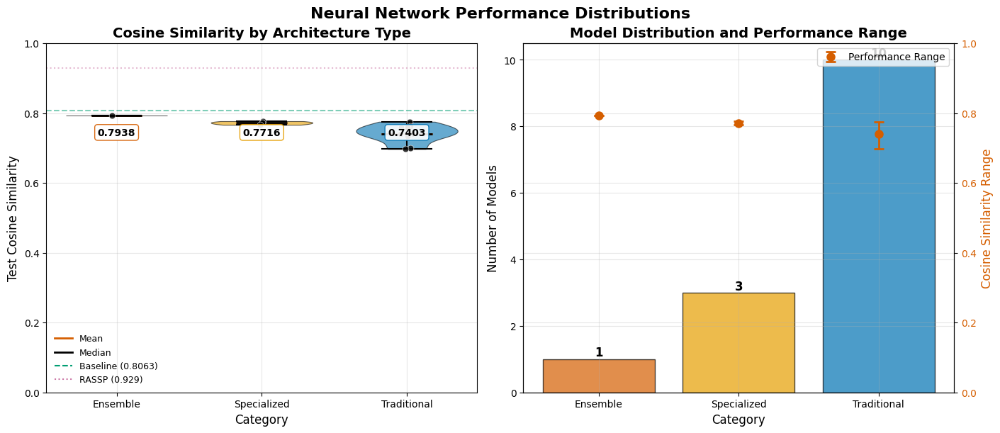

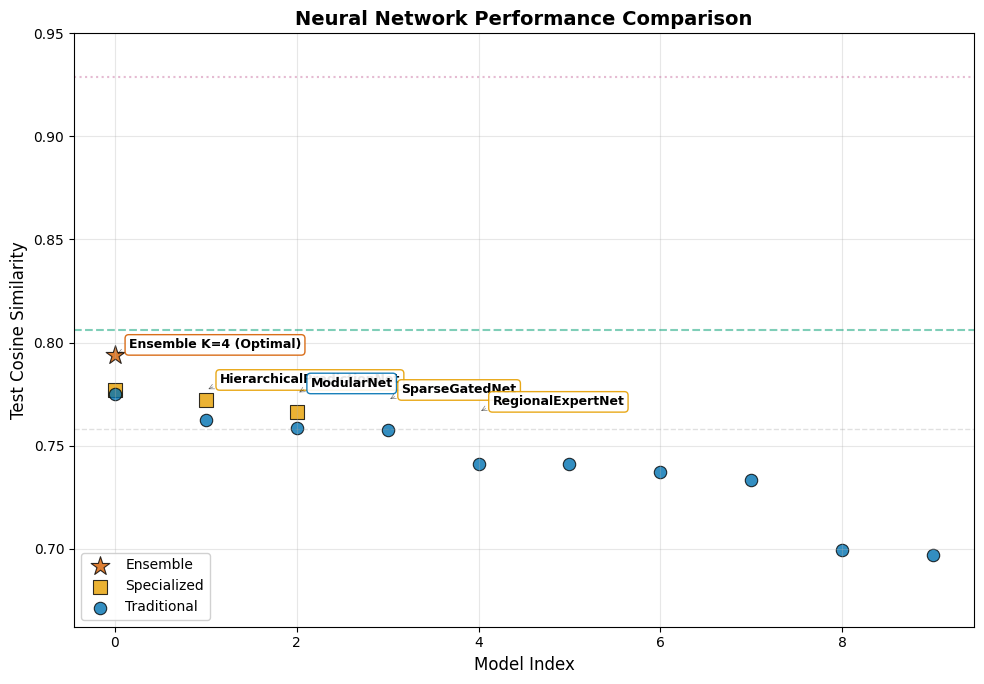

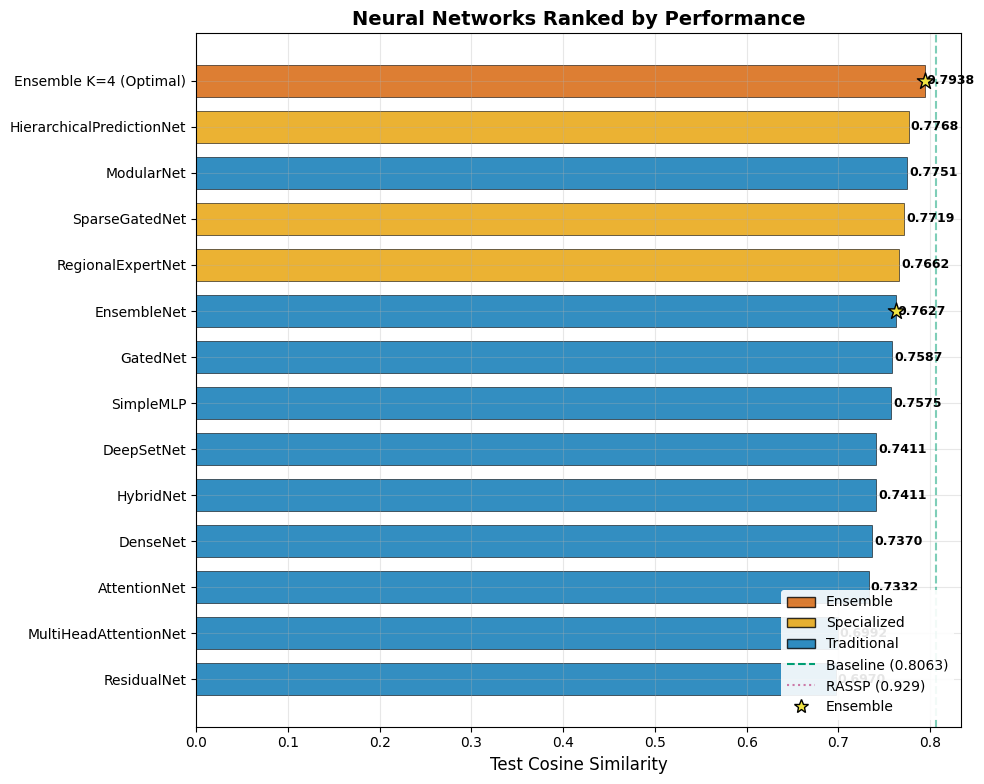


PERFORMANCE ANALYSIS

Best Overall Model: Ensemble K=4 (Optimal)
  Cosine Similarity: 0.793801
  Category: Ensemble
  Gap to baseline target (0.8063): +0.0125
  Gap to RASSP (0.929): +0.1352

Best Traditional Architecture: ModularNet
  Cosine Similarity: 0.775103

Best Specialized Architecture: HierarchicalPredictionNet
  Cosine Similarity: 0.776788

Ensemble Performance:
  Ensemble K=4 (Optimal): 0.793801

  Ensemble improvement over best individual: +2.19%

VISUALIZATIONS COMPLETE


In [24]:
# ================================================================================
# OVERALL RESULTS VISUALIZATION AND COMPARISON
# ================================================================================

print("=" * 80)
print("COMPREHENSIVE RESULTS VISUALIZATION")
print("=" * 80)

# Collect all individual model results
all_model_results = []

# Individual models with their categories
model_configs = [
    ('SimpleMLP', 'results_simple', 'Traditional'),
    ('ResidualNet', 'results_residual', 'Traditional'),
    ('AttentionNet', 'results_attention', 'Traditional'),
    ('DenseNet', 'results_dense', 'Traditional'),
    ('DeepSetNet', 'results_deepset', 'Traditional'),
    ('HybridNet', 'results_hybrid', 'Traditional'),
    ('MultiHeadAttentionNet', 'results_multihead', 'Traditional'),
    ('GatedNet', 'results_gated', 'Traditional'),
    ('EnsembleNet', 'results_ensemble', 'Traditional'),
    ('ModularNet', 'results_modular', 'Traditional'),
    ('SparseGatedNet', 'results_sparse_gated', 'Specialized'),
    ('RegionalExpertNet', 'results_regional', 'Specialized'),
    ('HierarchicalPredictionNet', 'results_hierarchical', 'Specialized'),
]

# Collect individual model results
for name, var_name, category in model_configs:
    if var_name in locals():
        result = locals()[var_name]
        all_model_results.append({
            'Model': name,
            'Category': category,
            'Cosine Similarity': result['test_cosine'],
            'Val Cosine': result['val_cosine'],
            'MSE': result['test_results']['mse'],
            'R²': result['test_results']['r2'],
            'Peak F1': result['test_results']['peak_metrics']['f1_score'],
            'Training Time (s)': result['history']['train_loss'][-1] if result['history']['train_loss'] else 0  # Placeholder
        })

# Add optimal ensemble
if 'k_results' in locals() and 4 in k_results:
    all_model_results.append({
        'Model': 'Ensemble K=4 (Optimal)',
        'Category': 'Ensemble',
        'Cosine Similarity': k_results[4]['test_cosine'],
        'Val Cosine': k_results[4]['val_cosine'],
        'MSE': ensemble_eval_results['mse'],
        'R²': ensemble_eval_results['r2'],
        'Peak F1': ensemble_eval_results['peak_metrics']['f1_score'],
        'Training Time (s)': 0  # Ensemble doesn't have direct training time
    })

# Create DataFrame
summary_df = pd.DataFrame(all_model_results)
summary_df = summary_df.sort_values('Cosine Similarity', ascending=False)

# Print summary table
print("\n" + "=" * 100)
print("NEURAL NETWORK ARCHITECTURES - PERFORMANCE SUMMARY")
print("=" * 100)
print(f"\nTotal models evaluated: {len(summary_df)}")
print("\nTop 10 Models by Cosine Similarity:")
print("-" * 100)
display_cols = ['Model', 'Category', 'Cosine Similarity', 'Val Cosine', 'MSE', 'Peak F1']
print(summary_df[display_cols].head(10).to_string(index=False))

# Performance statistics by category
print("\n\nPerformance by Category:")
print("-" * 60)
category_stats = summary_df.groupby('Category').agg({
    'Cosine Similarity': ['mean', 'std', 'max'],
    'Peak F1': 'mean'
}).round(4)
print(category_stats)

# ================================================================================
# VISUALIZATION 1: Performance Distributions (Violin Plots)
# ================================================================================

# Prepare data
df = summary_df.copy()
df = df.replace([np.inf, -np.inf], np.nan).dropna(subset=['Cosine Similarity'])

# Order categories by performance
cat_order = df.groupby('Category')['Cosine Similarity'].median().sort_values(ascending=False).index.tolist()
df['Category'] = pd.Categorical(df['Category'], categories=cat_order, ordered=True)

# Color mapping
cat_colors = {
    'Ensemble': PALETTE["vermillion"],
    'Specialized': PALETTE["orange"],
    'Traditional': PALETTE["blue"]
}

fig, axes = plt.subplots(1, 2, figsize=(14, 6), constrained_layout=True)

# --- Left: Cosine Similarity by Category ---
ax = axes[0]
data_for_plot = []
positions = []
colors_list = []

for i, cat in enumerate(cat_order):
    cat_data = df[df['Category'] == cat]['Cosine Similarity'].values
    if len(cat_data) > 0:
        data_for_plot.append(cat_data)
        positions.append(i)
        colors_list.append(cat_colors.get(cat, PALETTE["black"]))

if data_for_plot:
    parts = ax.violinplot(data_for_plot, positions=positions, 
                          showmeans=True, showmedians=True, widths=0.7)
    
    # Style violin plots
    for pc, color in zip(parts['bodies'], colors_list):
        pc.set_facecolor(color)
        pc.set_alpha(0.6)
        pc.set_edgecolor(PALETTE["black"])
        pc.set_linewidth(0.8)
    
    parts['cmeans'].set_color(PALETTE["vermillion"])
    parts['cmeans'].set_linewidth(2)
    parts['cmedians'].set_color(PALETTE["black"])
    parts['cmedians'].set_linewidth(2)
    parts['cbars'].set_color(PALETTE["black"])
    parts['cmaxes'].set_color(PALETTE["black"])
    parts['cmins'].set_color(PALETTE["black"])
    
    # Add individual points
    for i, cat in enumerate(cat_order):
        cat_data = df[df['Category'] == cat]['Cosine Similarity'].values
        if len(cat_data) > 0:
            x_jitter = np.random.normal(i, 0.04, size=len(cat_data))
            ax.scatter(x_jitter, cat_data, alpha=0.8, s=40, 
                      color=PALETTE["black"], edgecolor='white', linewidth=0.5, zorder=3)
    
    # Add mean annotations
    for i, cat in enumerate(cat_order):
        cat_data = df[df['Category'] == cat]['Cosine Similarity'].values
        if len(cat_data) > 0:
            mean_val = np.mean(cat_data)
            ax.text(i, ax.get_ylim()[1] * 0.95, f'{mean_val:.4f}', 
                   ha='center', va='top', fontweight='bold', fontsize=10,
                   bbox=dict(boxstyle='round,pad=0.3', facecolor='white', 
                            edgecolor=cat_colors.get(cat, PALETTE["black"]), alpha=0.9))

ax.set_xticks(positions)
ax.set_xticklabels(cat_order)
ax.set_title('Cosine Similarity by Architecture Type', fontsize=14, fontweight='bold')
ax.set_xlabel('Category', fontsize=12)
ax.set_ylabel('Test Cosine Similarity', fontsize=12)
ax.set_ylim(0, 1)
ax.grid(True, alpha=0.3, axis='y')

# Add target lines
ax.axhline(y=0.8063, color=PALETTE["green"], linestyle='--', alpha=0.5, linewidth=1.5, label='Baseline Target')
ax.axhline(y=0.929, color=PALETTE["purple"], linestyle=':', alpha=0.5, linewidth=1.5, label='RASSP Target')

legend_elements = [
    Line2D([0], [0], color=PALETTE["vermillion"], linewidth=2, label='Mean'),
    Line2D([0], [0], color=PALETTE["black"], linewidth=2, label='Median'),
    Line2D([0], [0], color=PALETTE["green"], linestyle='--', linewidth=1.5, label='Baseline (0.8063)'),
    Line2D([0], [0], color=PALETTE["purple"], linestyle=':', linewidth=1.5, label='RASSP (0.929)')
]
ax.legend(handles=legend_elements, loc='lower left', frameon=False, fontsize=9)

# --- Right: Model Count and Performance Range ---
ax = axes[1]
cat_stats = []
for cat in cat_order:
    cat_data = df[df['Category'] == cat]['Cosine Similarity'].values
    if len(cat_data) > 0:
        cat_stats.append({
            'Category': cat,
            'Count': len(cat_data),
            'Min': np.min(cat_data),
            'Max': np.max(cat_data),
            'Mean': np.mean(cat_data)
        })

if cat_stats:
    cat_df = pd.DataFrame(cat_stats)
    x_pos = np.arange(len(cat_df))
    
    # Bar plot for model count
    bars = ax.bar(x_pos, cat_df['Count'], color=[cat_colors.get(c, PALETTE["black"]) for c in cat_df['Category']],
                  alpha=0.7, edgecolor=PALETTE["black"], linewidth=1)
    
    # Add count labels
    for bar, count in zip(bars, cat_df['Count']):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
               f'{int(count)}', ha='center', va='bottom', fontweight='bold')
    
    ax.set_xlabel('Category', fontsize=12)
    ax.set_ylabel('Number of Models', fontsize=12)
    ax.set_title('Model Distribution and Performance Range', fontsize=14, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels(cat_df['Category'])
    
    # Add performance range as error bars on secondary axis
    ax2 = ax.twinx()
    ax2.errorbar(x_pos, cat_df['Mean'], 
                yerr=[cat_df['Mean'] - cat_df['Min'], cat_df['Max'] - cat_df['Mean']], 
                fmt='o', color=PALETTE["vermillion"], markersize=8,
                ecolor=PALETTE["vermillion"], elinewidth=2, capsize=5, capthick=2,
                label='Performance Range')
    ax2.set_ylabel('Cosine Similarity Range', fontsize=12, color=PALETTE["vermillion"])
    ax2.tick_params(axis='y', labelcolor=PALETTE["vermillion"])
    ax2.set_ylim(0, 1)
    ax2.legend(loc='upper right')
    
ax.grid(True, alpha=0.3, axis='y')

plt.suptitle('Neural Network Performance Distributions', fontsize=16, fontweight='bold')
plt.show()

# ================================================================================
# VISUALIZATION 2: Performance vs Complexity Scatter
# ================================================================================

fig, ax = plt.subplots(figsize=(10, 7))

# Define marker styles for categories
markers = {'Traditional': 'o', 'Specialized': 's', 'Ensemble': '*'}
sizes = {'Traditional': 80, 'Specialized': 100, 'Ensemble': 200}

# Plot each category
for cat in cat_order:
    cat_df = df[df['Category'] == cat]
    if len(cat_df) > 0:
        ax.scatter(range(len(cat_df)), cat_df['Cosine Similarity'].values,
                  label=cat, s=sizes.get(cat, 80), alpha=0.8,
                  marker=markers.get(cat, 'o'),
                  color=cat_colors.get(cat, PALETTE["black"]),
                  edgecolor=PALETTE["black"], linewidths=0.8)

# Add horizontal reference lines
ax.axhline(y=0.8063, color=PALETTE["green"], linestyle='--', alpha=0.5, linewidth=1.5)
ax.axhline(y=0.929, color=PALETTE["purple"], linestyle=':', alpha=0.5, linewidth=1.5)
ax.axhline(y=df['Cosine Similarity'].median(), color=PALETTE["grey"], 
          linestyle='--', alpha=0.3, linewidth=1)

# Annotate top performers
top_models = df.nlargest(5, 'Cosine Similarity')
for idx, (_, row) in enumerate(top_models.iterrows()):
    ax.annotate(row['Model'], 
               xy=(df.index.get_loc(row.name), row['Cosine Similarity']),
               xytext=(10, 5), textcoords='offset points',
               fontsize=9, fontweight='bold',
               bbox=dict(boxstyle='round,pad=0.3', facecolor='white',
                        alpha=0.9, edgecolor=cat_colors.get(row['Category'], PALETTE["black"])),
               arrowprops=dict(arrowstyle='->', connectionstyle='arc3,rad=0.2',
                             color=PALETTE["black"], alpha=0.5, linewidth=0.5))

ax.set_xlabel('Model Index', fontsize=12)
ax.set_ylabel('Test Cosine Similarity', fontsize=12)
ax.set_title('Neural Network Performance Comparison', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)
ax.legend(loc='lower left', frameon=True, facecolor='white', framealpha=0.9)
ax.set_ylim(df['Cosine Similarity'].min() * 0.95, 0.95)

plt.tight_layout()
plt.show()

# ================================================================================
# VISUALIZATION 3: Ranked Performance Bar Chart
# ================================================================================

# Sort by performance
df_ranked = df.sort_values('Cosine Similarity', ascending=True)
fig, ax = plt.subplots(figsize=(10, max(8, len(df_ranked) * 0.4)))

y_pos = np.arange(len(df_ranked))

# Create horizontal bars
bars = ax.barh(y_pos, df_ranked['Cosine Similarity'], height=0.7,
              edgecolor=PALETTE["black"], linewidth=0.5)

# Color by category
for bar, cat in zip(bars, df_ranked['Category']):
    bar.set_facecolor(cat_colors.get(cat, PALETTE["black"]))
    bar.set_alpha(0.8)

# Add value labels
for i, (idx, row) in enumerate(df_ranked.iterrows()):
    # Value at end of bar
    ax.text(row['Cosine Similarity'] + 0.002, i, f"{row['Cosine Similarity']:.4f}",
           va='center', fontsize=9, fontweight='bold')
    
    # Highlight ensemble
    if 'Ensemble' in row['Model']:
        ax.scatter(row['Cosine Similarity'], i, s=150, marker='*',
                  color=PALETTE["yellow"], edgecolor=PALETTE["black"],
                  linewidth=1, zorder=5)

# Add vertical target lines
ax.axvline(x=0.8063, color=PALETTE["green"], linestyle='--', alpha=0.5, linewidth=1.5)
ax.axvline(x=0.929, color=PALETTE["purple"], linestyle=':', alpha=0.5, linewidth=1.5)

ax.set_yticks(y_pos)
ax.set_yticklabels(df_ranked['Model'], fontsize=10)
ax.set_xlabel('Test Cosine Similarity', fontsize=12)
ax.set_title('Neural Networks Ranked by Performance', fontsize=14, fontweight='bold')
ax.grid(axis='x', alpha=0.3)
ax.set_xlim(0, min(1.0, df_ranked['Cosine Similarity'].max() * 1.05))

# Create legend
from matplotlib.patches import Patch
cat_handles = [Patch(facecolor=cat_colors.get(c, PALETTE["black"]),
                    edgecolor=PALETTE["black"], label=c, alpha=0.8)
              for c in cat_order]
target_handles = [
    Line2D([0], [0], color=PALETTE["green"], linestyle='--', linewidth=1.5, label='Baseline (0.8063)'),
    Line2D([0], [0], color=PALETTE["purple"], linestyle=':', linewidth=1.5, label='RASSP (0.929)'),
    Line2D([0], [0], marker='*', color=PALETTE["yellow"], linestyle='None',
          markersize=10, label='Ensemble', markeredgecolor=PALETTE["black"], markeredgewidth=1)
]
ax.legend(handles=cat_handles + target_handles, loc='lower right',
         frameon=True, facecolor='white', framealpha=0.9, edgecolor='none')

plt.tight_layout()
plt.show()

# ================================================================================
# Performance Summary Statistics
# ================================================================================

print("\n" + "=" * 80)
print("PERFORMANCE ANALYSIS")
print("=" * 80)

# Best performers
best_overall = df.iloc[0]
traditional_df = df[df['Category'] == 'Traditional']
specialized_df = df[df['Category'] == 'Specialized']

print(f"\nBest Overall Model: {best_overall['Model']}")
print(f"  Cosine Similarity: {best_overall['Cosine Similarity']:.6f}")
print(f"  Category: {best_overall['Category']}")
print(f"  Gap to baseline target (0.8063): {0.8063 - best_overall['Cosine Similarity']:+.4f}")
print(f"  Gap to RASSP (0.929): {0.929 - best_overall['Cosine Similarity']:+.4f}")

if len(traditional_df) > 0:
    best_traditional = traditional_df.iloc[0]
    print(f"\nBest Traditional Architecture: {best_traditional['Model']}")
    print(f"  Cosine Similarity: {best_traditional['Cosine Similarity']:.6f}")

if len(specialized_df) > 0:
    best_specialized = specialized_df.iloc[0]
    print(f"\nBest Specialized Architecture: {best_specialized['Model']}")
    print(f"  Cosine Similarity: {best_specialized['Cosine Similarity']:.6f}")

# Ensemble analysis
ensemble_models = df[df['Category'] == 'Ensemble']
if len(ensemble_models) > 0:
    print(f"\nEnsemble Performance:")
    for _, row in ensemble_models.iterrows():
        print(f"  {row['Model']}: {row['Cosine Similarity']:.6f}")
    
    # Compare to best individual
    individual_df = df[df['Category'] != 'Ensemble']
    if len(individual_df) > 0:
        best_individual = individual_df.iloc[0]
        improvement = (ensemble_models.iloc[0]['Cosine Similarity'] - best_individual['Cosine Similarity']) / best_individual['Cosine Similarity'] * 100
        print(f"\n  Ensemble improvement over best individual: {improvement:+.2f}%")

print("\n" + "=" * 80)
print("VISUALIZATIONS COMPLETE")
print("=" * 80)

## 23. Final Comparison and Analysis

Compare all models and create comprehensive analysis.

In [25]:
# Collect all results including the optimal ensemble
all_results = []

# List of individual model results
result_vars = [
    ('SimpleMLP', 'results_simple'),
    ('ResidualNet', 'results_residual'),
    ('AttentionNet', 'results_attention'),
    ('DenseNet', 'results_dense'),
    ('DeepSetNet', 'results_deepset'),
    ('HybridNet', 'results_hybrid'),
    ('MultiHeadAttentionNet', 'results_multihead'),
    ('GatedNet', 'results_gated'),
    ('EnsembleNet', 'results_ensemble'),
    ('ModularNet', 'results_modular'),
    ('SparseGatedNet', 'results_sparse_gated'),
    ('RegionalExpertNet', 'results_regional'),
    ('HierarchicalPredictionNet', 'results_hierarchical')
]

# Add individual models
for name, var_name in result_vars:
    if var_name in locals():
        result = locals()[var_name]
        all_results.append({
            'Architecture': name,
            'Type': 'Individual',
            'Val Cosine': result['val_cosine'],
            'Test Cosine': result['test_cosine'],
            'Test MSE': result['test_results']['mse'],
            'Peak Precision': result['test_results']['peak_metrics']['precision'],
            'Peak Recall': result['test_results']['peak_metrics']['recall'],
            'Peak F1': result['test_results']['peak_metrics']['f1_score']
        })

# Add ensemble results
if 'k_results' in locals():
    # Add K=4 optimal ensemble
    all_results.append({
        'Architecture': 'Ensemble K=4 (Optimal)',
        'Type': 'Ensemble',
        'Val Cosine': k_results[4]['val_cosine'],
        'Test Cosine': k_results[4]['test_cosine'],
        'Test MSE': ensemble_eval_results['mse'],
        'Peak Precision': ensemble_eval_results['peak_metrics']['precision'],
        'Peak Recall': ensemble_eval_results['peak_metrics']['recall'],
        'Peak F1': ensemble_eval_results['peak_metrics']['f1_score']
    })
    
    # Add all-model ensemble for comparison
    all_results.append({
        'Architecture': f'Ensemble All ({n_models} models)',
        'Type': 'Ensemble',
        'Val Cosine': k_results['all']['val_cosine'],
        'Test Cosine': k_results['all']['test_cosine'],
        'Test MSE': mean_squared_error(y_test_true, k_results['all']['test_pred']),
        'Peak Precision': np.nan,  # Would need to calculate
        'Peak Recall': np.nan,
        'Peak F1': np.nan
    })

if all_results:
    # Create comparison dataframe
    results_df = pd.DataFrame(all_results)
    results_df = results_df.sort_values('Test Cosine', ascending=False)
    
    print("\n" + "="*80)
    print("FINAL PERFORMANCE COMPARISON (INCLUDING ENSEMBLES)")
    print("="*80)
    
    pd.set_option('display.float_format', '{:.4f}'.format)
    print(results_df.to_string(index=False))
    
    # Best model analysis
    best_model = results_df.iloc[0]
    print(f"\nBEST MODEL: {best_model['Architecture']}")
    print(f"Test Cosine Similarity: {best_model['Test Cosine']:.4f}")
    if not np.isnan(best_model['Peak F1']):
        print(f"Peak Detection F1: {best_model['Peak F1']:.4f}")
    
    # Progress tracking
    baseline_target = 0.8063
    rassp_target = 0.929
    
    print(f"\nTarget Analysis:")
    print(f"  Current best: {best_model['Test Cosine']:.4f}")
    print(f"  Baseline target: {baseline_target:.4f}")
    print(f"  Gap to baseline: {baseline_target - best_model['Test Cosine']:+.4f}")
    print(f"  Progress: {(best_model['Test Cosine'] - 0.7) / (baseline_target - 0.7) * 100:.1f}%")
    print(f"  Gap to RASSP ({rassp_target}): {rassp_target - best_model['Test Cosine']:.4f}")
    
    # Compare ensemble vs best individual
    best_individual = results_df[results_df['Type'] == 'Individual'].iloc[0]
    best_ensemble = results_df[results_df['Type'] == 'Ensemble'].iloc[0]
    
    print(f"\nEnsemble Improvement:")
    print(f"  Best Individual: {best_individual['Architecture']} ({best_individual['Test Cosine']:.4f})")
    print(f"  Best Ensemble: {best_ensemble['Architecture']} ({best_ensemble['Test Cosine']:.4f})")
    print(f"  Improvement: {(best_ensemble['Test Cosine'] - best_individual['Test Cosine']) / best_individual['Test Cosine'] * 100:+.2f}%")
    
    # Save final results
    results_path = os.path.join(CONFIG.paths.models_dir, 'final_comparison_with_ensembles.pkl')
    with open(results_path, 'wb') as f:
        pickle.dump({
            'results_df': results_df,
            'all_results': all_results,
            'best_model': best_model.to_dict(),
            'config': CONFIG,
            'ensemble_config': ensemble_config if 'ensemble_config' in locals() else None
        }, f)
    print(f"\n✓ Final results saved to {results_path}")
else:
    print("No trained models found for comparison.")

print("\n" + "="*80)
print("NOTEBOOK COMPLETE")
print("="*80)


FINAL PERFORMANCE COMPARISON (INCLUDING ENSEMBLES)
             Architecture       Type  Val Cosine  Test Cosine  Test MSE  Peak Precision  Peak Recall  Peak F1
 Ensemble All (13 models)   Ensemble      0.8050       0.7944    0.0045             NaN          NaN      NaN
   Ensemble K=4 (Optimal)   Ensemble      0.8059       0.7938    0.0044          0.8956       0.7247   0.8011
HierarchicalPredictionNet Individual      0.7868       0.7768    0.0049          0.7047       0.9053   0.7925
               ModularNet Individual      0.7852       0.7751    0.0048          0.7858       0.8134   0.7993
           SparseGatedNet Individual      0.7817       0.7719    0.0049          0.7425       0.8438   0.7899
        RegionalExpertNet Individual      0.7835       0.7662    0.0050          0.8164       0.7569   0.7855
              EnsembleNet Individual      0.7738       0.7627    0.0052          0.8349       0.7212   0.7739
                 GatedNet Individual      0.7673       0.7587    0.0